# The Crime Dataset

### Problem Statement- You are working for an organization which is supporting real estate companies, home builders and general public to choose the right place which has no crime or lowest crime rate. 

##### Dataset-01_District_wise_crimes_committed_IPC_2001_to_2014.xlsx

Crime Dataset provides comprehensive records of various criminal activities reported across states and union territories (UTs) of India, covering a span of 14 years from 2001 to 2014. Each entry in the dataset encompasses a wide range of criminal incidents, meticulously categorized into distinct crime types, reflecting the diverse nature of law enforcement challenges faced by the nation.

###### ATTRIBUTES 

'STATES/UT': 	all states and ut names 
	
'DISTRICT: 		all DISTRICTS Names as per states
	
'YEAR' : 		year 2001 to 2014
	
'MURDER': 		Homicide resulting in the unlawful killing of a person.
	
'ATTEMPT TO MURDER': An unsuccessful or incomplete attempt to unlawfully kill another person.
	
'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER': A form of homicide where the killing is not considered murder but still involves a culpable act resulting in death.

'RAPE': Non-consensual sexual intercourse usually involving force or coercion.

'CUSTODIAL RAPE': Rape committed by a person in a position of authority or trust, such as a law enforcement officer or prison guard.

'OTHER RAPE': Rape cases not falling under the category of custodial rape.

'KIDNAPPING & ABDUCTION': Unlawful taking away or transportation of a person against their will.

'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS': Specifically refers to the kidnapping and abduction of females.

'KIDNAPPING AND ABDUCTION OF OTHERS': Refers to the kidnapping and abduction of individuals other than women and girls.

'DACOITY': Armed robbery by a group of people.

'PREPARATION AND ASSEMBLY FOR DACOITY': Activities related to planning and organizing for dacoity.

'ROBBERY': Theft involving force, violence, or threat of violence.

'BURGLARY': Unlawful entry into a building with the intent to commit theft.

'THEFT': Unlawful taking of someone else's property without their consent.

'AUTO THEFT': Theft of motor vehicles.

'OTHER THEFT': Theft cases not involving motor vehicles.

'RIOTS': Violent disturbances involving a group of people.

'CRIMINAL BREACH OF TRUST': Breach of trust involving dishonesty or fraud.

'CHEATING': Deceiving someone for financial or personal gain.

'COUNTERFEITING': Production of fake currency or goods.

'ARSON': Deliberate and malicious setting of fire to property.

'HURT/GREVIOUS HURT': Infliction of bodily injury, ranging from minor hurt to grievous hurt.

'DOWRY DEATHS': Death of a woman caused by harassment or violence related to dowry demands.

'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY': Physical assault with the intent to violate a woman's modesty.

'INSULT TO MODESTY OF WOMEN': Acts that humiliate or offend the modesty of women.

'CRUELTY BY HUSBAND OR HIS RELATIVES': Acts of cruelty or harassment by a husband or his relatives towards a married woman.

'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES': Illegal trafficking of girls from foreign countries.

'CAUSING DEATH BY NEGLIGENCE': Death caused by a negligent act or failure to act.



In [1]:
import pandas as pd
import numpy as np
import math
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns
import os
import tensorflow as tf
%matplotlib inline
import ipywidgets as widgets
from ipywidgets import interact,interactive,interact_manual,interactive_output,fixed
from IPython.display import display
from ipywidgets import Dropdown

#ML module
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
#from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn import svm
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import mean_squared_log_error, median_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold


In [2]:
data=pd.read_excel('01_District_wise_crimes_committed_IPC_2001_to_2014.xlsx')
#data.head()

In [3]:
data.head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ASSAM,C.I.D.,2001,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2,8
1,JAMMU & KASHMIR,CRIME JAMMU,2001,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,27
2,JAMMU & KASHMIR,CRIME SRINAGAR,2001,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,69
3,JAMMU & KASHMIR,KARGIL,2001,0,0,0,0,0,0,2,...,3,1,0,1,0,0,0,0,62,82
4,KERALA,RAILWAYS,2001,0,0,0,1,0,1,0,...,0,9,0,0,0,0,0,0,39,289


In [4]:
data.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES'],
      dtype='object')

In [5]:
data.shape

(10678, 33)

In [6]:
data.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES'],
      dtype='object')

# DATA Cleaning

In [7]:
df=data.drop(columns=['CUSTODIAL RAPE','OTHER RAPE','KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS','COUNTERFIETING',
       'KIDNAPPING AND ABDUCTION OF OTHERS','AUTO THEFT', 'OTHER THEFT','CRIMINAL BREACH OF TRUST','ARSON',
       'DOWRY DEATHS','CRUELTY BY HUSBAND OR HIS RELATIVES','CAUSING DEATH BY NEGLIGENCE','PREPARATION AND ASSEMBLY FOR DACOITY'])

In [8]:
df.shape

(10678, 20)

In [9]:
df['DISTRICT']=df['DISTRICT'].str.upper()
df['STATE/UT']=df['STATE/UT'].str.upper()

In [10]:
df['STATE/UT'].unique()

array(['ASSAM', 'JAMMU & KASHMIR', 'KERALA', 'NAGALAND', 'TAMIL NADU',
       'A & N ISLANDS', 'DELHI UT', 'ANDHRA PRADESH', 'ARUNACHAL PRADESH',
       'HIMACHAL PRADESH', 'ODISHA', 'LAKSHADWEEP', 'MAHARASHTRA',
       'DAMAN & DIU', 'SIKKIM', 'MANIPUR', 'UTTARAKHAND',
       'MADHYA PRADESH', 'MIZORAM', 'TRIPURA', 'PUDUCHERRY', 'GUJARAT',
       'HARYANA', 'RAJASTHAN', 'A&N ISLANDS', 'BIHAR', 'GOA',
       'CHHATTISGARH', 'WEST BENGAL', 'JHARKHAND', 'MEGHALAYA',
       'D & N HAVELI', 'D&N HAVELI', 'TELANGANA', 'PUNJAB', 'KARNATAKA',
       'UTTAR PRADESH', 'CHANDIGARH'], dtype=object)

In [11]:
df['STATE/UT']=df['STATE/UT'].replace({'D&N HAVELI':'DADRA AND NAGAR HAVELI','D & N HAVELI':'DADRA AND NAGAR HAVELI','A&N ISLANDS':'ANDAMAN AND NICOBAR ISLANDS','A & N ISLANDS':'ANDAMAN AND NICOBAR ISLANDS'})
df['STATE/UT']=df['STATE/UT'].str.replace(' ','_')
df['STATE/UT'].unique()

array(['ASSAM', 'JAMMU_&_KASHMIR', 'KERALA', 'NAGALAND', 'TAMIL_NADU',
       'ANDAMAN_AND_NICOBAR_ISLANDS', 'DELHI_UT', 'ANDHRA_PRADESH',
       'ARUNACHAL_PRADESH', 'HIMACHAL_PRADESH', 'ODISHA', 'LAKSHADWEEP',
       'MAHARASHTRA', 'DAMAN_&_DIU', 'SIKKIM', 'MANIPUR', 'UTTARAKHAND',
       'MADHYA_PRADESH', 'MIZORAM', 'TRIPURA', 'PUDUCHERRY', 'GUJARAT',
       'HARYANA', 'RAJASTHAN', 'BIHAR', 'GOA', 'CHHATTISGARH',
       'WEST_BENGAL', 'JHARKHAND', 'MEGHALAYA', 'DADRA_AND_NAGAR_HAVELI',
       'TELANGANA', 'PUNJAB', 'KARNATAKA', 'UTTAR_PRADESH', 'CHANDIGARH'],
      dtype=object)

In [12]:
df.shape

(10678, 20)

In [13]:
data['YEAR'].value_counts()

YEAR
2014    838
2013    823
2012    811
2011    791
2010    779
2009    767
2008    761
2007    743
2006    740
2005    733
2004    729
2003    728
2002    719
2001    716
Name: count, dtype: int64

In [14]:
df=df.loc[df['DISTRICT']!='TOTAL']
df=df.loc[df['DISTRICT']!='ZZ TOTAL']
df=df[~df['DISTRICT'].str.contains('RAIL')]
df=df[df['DISTRICT']!='DELHI UT TOTAL']

In [15]:
df.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE',
       'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT',
       'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'OTHER IPC CRIMES',
       'TOTAL IPC CRIMES'],
      dtype='object')

### Categories all crimes in 4 categories

Violent_Crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'KIDNAPPING & ABDUCTION']

Property_Crimes=['DACOITY','ROBBERY','BURGLARY','THEFT']

Social_Offenses=['RIOTS','CHEATING','HURT/GREVIOUS HURT']

Crimes_Against_Women=['RAPE','ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY','INSULT TO MODESTY OF WOMEN','IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES']

In [16]:
Violent_Crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'KIDNAPPING & ABDUCTION']
Property_Crimes=['DACOITY','ROBBERY','BURGLARY','THEFT']
Social_Offenses=['RIOTS','CHEATING','HURT/GREVIOUS HURT']
Crimes_Against_Women=['RAPE','ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY','INSULT TO MODESTY OF WOMEN','IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES']
#Total_Crime=['OTHER IPC CRIMES','TOTAL IPC CRIMES']
NumericalCrimeFeature=['MURDER', 'ATTEMPT TO MURDER','CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE',
                       'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT','RIOTS', 'CHEATING', 
                       'HURT/GREVIOUS HURT','ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY','INSULT TO MODESTY OF WOMEN',
                       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES']


In [17]:
dff=df

The dataset provided has been meticulously cleaned to ensure accuracy and reliability, acknowledging potential sources of error such as human oversight, typographical errors, and duplicates. 
This meticulous curation process was conducted in collaboration with local law enforcement agencies, crime bureaus, and investigating authorities. Information gleaned from credible online sources was instrumental in this endeavor.

Notably, the dataset primarily focuses on crime statistics pertaining to states and their respective districts, thus warranting a meticulous approach to data refinement. Given the significance of this dataset in informing crime prevention strategies and policy formulation.

the exclusion of data collected by specialized investigating agencies such as the Criminal Investigation Department (CID), Records of Wrongdoing (ROW), Crime Branches, Enforcement Directorate (ED), and Railway Police was deliberate. 

This decision ensures a more targeted analysis of crime trends at the state and district levels, enhancing the dataset's utility in addressing the specified project objectives.

In [18]:
df['STATE/UT'].unique()

array(['ASSAM', 'JAMMU_&_KASHMIR', 'NAGALAND', 'TAMIL_NADU',
       'ANDAMAN_AND_NICOBAR_ISLANDS', 'DELHI_UT', 'ANDHRA_PRADESH',
       'ARUNACHAL_PRADESH', 'HIMACHAL_PRADESH', 'ODISHA', 'LAKSHADWEEP',
       'MAHARASHTRA', 'DAMAN_&_DIU', 'SIKKIM', 'MANIPUR', 'UTTARAKHAND',
       'MADHYA_PRADESH', 'MIZORAM', 'TRIPURA', 'PUDUCHERRY', 'GUJARAT',
       'HARYANA', 'RAJASTHAN', 'BIHAR', 'GOA', 'CHHATTISGARH',
       'WEST_BENGAL', 'JHARKHAND', 'MEGHALAYA', 'DADRA_AND_NAGAR_HAVELI',
       'KERALA', 'PUNJAB', 'KARNATAKA', 'UTTAR_PRADESH', 'CHANDIGARH',
       'TELANGANA'], dtype=object)

In [19]:
def District(State):
    print(df[df['STATE/UT']==State]['DISTRICT'].unique())

In [20]:
for St in df['STATE/UT'].unique():
    print(St)
    District(St)
    print()

ASSAM
['C.I.D.' 'R.P.O.' 'BIEO' 'STF' 'G.R.P.' 'N.C.HILLS' 'HAMREN' 'G. R. P.'
 'CHIRANG' 'HAILAKANDI' 'BONGAIGAON' 'MORIGAON' 'DHEMAJI' 'KAMRUP'
 'NALBARI' 'GUWAHATI CITY' 'BASKA' 'GOALPARA' 'DARRANG' 'KARBI ANGLONG'
 'LAKHIMPUR' 'JORHAT' 'KARIMGANJ' 'UDALGURI' 'BARPETA' 'KOKRAJHAR' 'BAKSA'
 'DHUBRI' 'CACHAR' 'TINSUKIA' 'GOLAGHAT' 'SIBSAGAR' 'NAGAON' 'N. C. HILLS'
 'DIBRUGARH' 'SONITPUR']

JAMMU_&_KASHMIR
['CRIME JAMMU' 'CRIME SRINAGAR' 'KARGIL' 'LEH' 'CRIME KASHMIR' 'KISHTWAR'
 'ANANTNAG' 'AWANTIPORA' 'GANDERBAL' 'REASI' 'BUDGAM' 'RAMBAN' 'SHOPIAN'
 'HANDWARA' 'BANDIPORA' 'BARAMULLA' 'KULGAM' 'KUPWARA' 'PULWAMA' 'DODA'
 'POONCH' 'SAMBA' 'UDHAMPUR' 'SRINAGAR' 'BORDER' 'KATHUA' 'SOPORE'
 'RAJOURI' 'BORDER DISTRICT' 'JAMMU']

NAGALAND
['PEREN' 'KIPHIRE' 'LONGLENG' 'ZUNHEBOTO' 'TUENSANG' 'MON' 'WOKHA' 'PHEK'
 'MOKOKCHUNG' 'KOHIMA' 'DIMAPUR']

TAMIL_NADU
['TRICHY RLY.' 'CHENNAI RLY.' 'CYBER CELL' 'OTHER UNITS' 'NILGIRIS'
 'PERAMBALUR' 'SALEM URBAN' 'THIRUNELVELI URBAN' 'TRICHY URBAN'
 'TH

In [21]:
#in 2014 some of the districts for Andhra we to new state Telangana, so for now we can assume that telangana 2014= andhra 2024

In [22]:
df['STATE/UT']=df['STATE/UT'].replace('TELANGANA','ANDHRA_PRADESH')

In [23]:
df[(df['DISTRICT']=='KUKUNG KUMEY') & (df['YEAR']==2001)]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES


In [24]:
df['DISTRICT']=df['DISTRICT'].replace({'KUKUNG KUMEY':'KURUNG KUMEY','K/KUMEY':'KURUNG KUMEY'})

In [25]:
df[df['STATE/UT']=='ARUNACHAL_PRADESH']['DISTRICT'].unique()

array(['SIANG UPPER', 'TAWANG', 'UPPER DIBANG VALLEY', 'SUBANSIRI LOWER',
       'ANJAW', 'RURAL', 'CRIME BRANCH', 'DIBANG VALLEY', 'SIANG EAST',
       'SUBANSIRI UPPER', 'KAMENG WEST', 'KURUNG KUMEY', 'TIRAP',
       'KAMENG EAST', 'SIANG WEST', 'LONGDING', 'LOWER DIBANG VALLEY',
       'PAPUM PARE', 'CHANGLANG', 'LOHIT', 'PAPUM PARE RURAL',
       'PAPUM PARE CITY'], dtype=object)

In [26]:
df=df[~df['DISTRICT'].isin(['CRIME BRANCH', 'RURAL'])]

ASSAM

In [27]:
df[(df['STATE/UT']=='ASSAM') & (df['DISTRICT'].isin(['C.I.D.','BAKSA', 'G.R.P.', 'R.P.O.', 'STF', 'G. R. P.','N. C. HILLS','BASKA', 'BIEO','HAMREN']))].head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ASSAM,C.I.D.,2001,0,0,0,0,0,0,0,0,1,0,5,0,0,0,0,2,8
12,ASSAM,C.I.D.,2002,0,0,0,0,2,0,0,0,0,0,5,0,0,0,0,45,52
13,ASSAM,R.P.O.,2002,0,0,0,1,1,2,0,1,4,3,0,0,0,0,0,1,13
24,ASSAM,C.I.D.,2003,0,0,0,0,1,0,0,0,0,0,4,0,0,0,0,18,24
38,ASSAM,C.I.D.,2004,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,17,22


In [28]:
df['DISTRICT']=df['DISTRICT']=df['DISTRICT'].replace({'BAKSA':'BASKA'})

In [29]:
df=df[~df['DISTRICT'].isin(['C.I.D.','BAKSA', 'G.R.P.', 'R.P.O.', 'STF', 'G. R. P.','N. C. HILLS','BASKA', 'BIEO','HAMREN'])]

BIHAR

In [30]:
df=df[~df['DISTRICT'].isin(['ECONOMIC OFFENCES UNIT','ANTI TERRORIST SQUAD','PATNA RLY.','MUZAFFARPUR RLY.','KATIHAR RLY.','JAMALPUR RLY.'])]

In [31]:
df.shape

(9945, 20)

In [32]:
df[df['STATE/UT']=='BIHAR']['DISTRICT'].unique()

array(['SHEOHAR', 'SHEIKHPURA', 'KISHANGANJ', 'SAHARSA', 'ARWAL',
       'BAGAHA', 'NAUGACHIA', 'SUPAUL', 'LAKHISARAI', 'MADHEPURA',
       'BHABHUA', 'JEHANABAD', 'MADHUBANI', 'BUXAR', 'DARBHANGA',
       'SITAMARHI', 'KHAGARIA', 'MUNGER', 'ARARIA', 'GOPALGANJ', 'JAMUI',
       'BANKA', 'PURNEA', 'KATIHAR', 'AURANGABAD', 'NAWADAH', 'BETTIAH',
       'VAISHALI', 'BHOJPUR', 'BHAGALPUR', 'SIWAN', 'SAMASTIPUR',
       'NALANDA', 'ROHTAS', 'MOTIHARI', 'SARAN', 'BEGUSARAI',
       'MUZAFFARPUR', 'GAYA', 'PATNA'], dtype=object)

In [33]:
df=df[~(df['DISTRICT'].str.contains('G. R. P.')| df['DISTRICT'].str.contains('CP')| df['DISTRICT'].str.contains('G.R.P') |df['DISTRICT'].str.contains('G.R.P.') | df['DISTRICT'].str.contains('C. I. D.') |df['DISTRICT'].str.contains('CID')|df['DISTRICT'].str.contains('GRP'))]

In [34]:
df[(df['DISTRICT'].str.contains('G. R. P.') | df['DISTRICT'].str.contains('C. I. D.'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES


In [35]:
df['DISTRICT']=df['DISTRICT'].replace({'MUNGALI':'MUNGELI', 'BALODBAZAR':'BALODA BAZAR','BEMETRA':'BEMETARA'})

In [36]:
df=df[~(df['DISTRICT'].str.contains('RLY'))]

In [37]:
df

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
1,JAMMU_&_KASHMIR,CRIME JAMMU,2001,0,0,0,0,0,0,0,0,0,0,27,0,0,0,0,0,27
2,JAMMU_&_KASHMIR,CRIME SRINAGAR,2001,0,0,0,0,0,0,0,0,0,0,61,0,0,0,0,0,69
3,JAMMU_&_KASHMIR,KARGIL,2001,0,0,0,0,2,0,0,2,6,5,0,1,1,0,0,62,82
5,NAGALAND,PEREN,2001,0,2,0,0,0,0,1,9,4,0,1,0,0,0,0,11,28
7,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2001,0,0,0,0,0,0,0,2,0,0,0,5,1,0,0,13,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10425,BIHAR,PATNA,2001,434,581,30,27,197,91,414,426,1568,506,331,354,47,0,39,2825,8583
10427,BIHAR,PATNA,2005,436,87,25,57,275,127,633,521,1356,484,199,392,5,2,0,6380,11840
10431,BIHAR,PATNA,2002,472,682,30,37,203,93,491,494,1763,489,342,445,42,0,0,2760,9217
10434,BIHAR,PATNA,2003,484,680,9,34,220,124,694,469,1654,494,370,389,49,0,0,3267,9770


HARYANA

In [38]:
df[df['DISTRICT'].str.contains('IRRIGATION & POWER')]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
223,HARYANA,IRRIGATION & POWER,2014,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,192,192


In [39]:
df[df['STATE/UT']=='HARYANA']['DISTRICT'].unique()

array(['I&P HARYANA', 'IRRIGATION & POWER', 'PANCHKULA', 'MAHENDRAGARH',
       'MEWAT', 'AMBALA RURAL', 'AMBALA URBAN', 'AMBALA (RURAL)',
       'FATEHABAD', 'REWARI', 'KAITHAL', 'KURUKSHETRA', 'YAMUNANAGAR',
       'AMBALA', 'SIRSA', 'AMBALA (URBAN)', 'PALWAL', 'KARNAL', 'JIND',
       'PANIPAT', 'BHIWANI', 'MAHENDERGARH', 'JHAJJAR', 'HISSAR',
       'ROHTAK', 'FARIDABAD', 'GURGAON', 'SONIPAT'], dtype=object)

In [40]:
df['DISTRICT']=df['DISTRICT'].replace({'AMBALA (RURAL)':'AMBALA RURAL','AMBALA (URBAN)':'AMBALA URBAN'})

In [41]:
dff=df

In [42]:
df[df['DISTRICT'].str.contains('AMBALA')]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
2057,HARYANA,AMBALA RURAL,2012,13,15,1,11,28,1,6,118,209,0,45,66,12,4,0,462,1082
2324,HARYANA,AMBALA URBAN,2012,15,16,3,21,75,0,21,362,600,1,99,109,23,14,0,759,2342
2341,HARYANA,AMBALA RURAL,2014,15,13,2,25,59,2,4,96,194,0,38,62,17,0,0,215,1098
2590,HARYANA,AMBALA RURAL,2013,17,5,1,17,67,4,10,92,195,0,47,67,32,0,0,339,1110
2591,HARYANA,AMBALA URBAN,2013,17,15,2,24,159,7,13,394,438,3,79,91,48,18,0,583,2255
3503,HARYANA,AMBALA,2005,24,16,2,19,24,1,15,179,275,2,66,254,19,16,0,952,2064
3633,HARYANA,AMBALA,2002,25,18,7,15,21,0,11,251,331,4,64,258,17,0,0,987,2172
3752,HARYANA,AMBALA URBAN,2014,25,18,1,31,159,0,16,321,430,6,52,95,23,1,0,288,1977
3762,HARYANA,AMBALA,2001,26,23,2,11,38,2,18,316,365,5,76,280,27,0,0,985,2346
3788,HARYANA,AMBALA,2003,26,16,3,17,26,1,14,236,208,2,73,190,17,31,0,883,1898


In [43]:
df=df[~df['DISTRICT'].str.contains('I&P HARYANA|IRRIGATION & POWER')]

In [44]:
df[(df['YEAR'] == 2012) & ((df['DISTRICT']=='AMBALA RURAL')|(df['DISTRICT']=='AMBALA URBAN'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
2057,HARYANA,AMBALA RURAL,2012,13,15,1,11,28,1,6,118,209,0,45,66,12,4,0,462,1082
2324,HARYANA,AMBALA URBAN,2012,15,16,3,21,75,0,21,362,600,1,99,109,23,14,0,759,2342


In [45]:
crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT', 'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES']

# Filter rows for Ambala Rural and Ambala Urban in the year 2012
ambala_rural = df[(df['YEAR'] == 2012) & (df['DISTRICT'] == 'AMBALA RURAL')]
ambala_urban = df[(df['YEAR'] == 2012) & (df['DISTRICT'] == 'AMBALA URBAN')]

# Sum the crime rates of specified crime columns
merged_values = ambala_rural[crime].values + ambala_urban[crime].values

# Assign the merged values to the Ambala row for the specified crime columns
df.loc[(df['DISTRICT'] == 'AMBALA RURAL') &(df['YEAR'] == 2012), crime] = merged_values

In [46]:
# Specify the crime columns to be merged
crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT', 'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES']

# Filter rows for Ambala Rural and Ambala Urban in the year 2012
ambala_rural = df[(df['YEAR'] == 2013) & (df['DISTRICT'] == 'AMBALA RURAL')]
ambala_urban = df[(df['YEAR'] == 2013) & (df['DISTRICT'] == 'AMBALA URBAN')]

# Sum the crime rates of specified crime columns
merged_values = ambala_rural[crime].values + ambala_urban[crime].values

# Assign the merged values to the Ambala row for the specified crime columns
df.loc[(df['DISTRICT'] == 'AMBALA RURAL') &(df['YEAR'] == 2013), crime] = merged_values

In [47]:
crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT', 'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES']
ambala_rural = df[(df['YEAR'] == 2014) & (df['DISTRICT'] == 'AMBALA RURAL')]
ambala_urban = df[(df['YEAR'] == 2014) & (df['DISTRICT'] == 'AMBALA URBAN')]

# Sum the crime rates of specified crime columns
merged_values = ambala_rural[crime].values + ambala_urban[crime].values

# Assign the merged values to the Ambala row for the specified crime columns
df.loc[(df['DISTRICT'] == 'AMBALA RURAL') &(df['YEAR'] == 2014), crime] = merged_values

In [48]:
df=df[~((df['YEAR']==2012) & (df['DISTRICT'] =='AMBALA URBAN'))]
df=df[~((df['YEAR']==2013) & (df['DISTRICT'] =='AMBALA URBAN'))]
df=df[~((df['YEAR']==2014) & (df['DISTRICT'] =='AMBALA URBAN'))]

In [49]:
df['DISTRICT']=df['DISTRICT'].replace('AMBALA RURAL','AMBALA')

In [50]:
df[df['DISTRICT'].str.contains('AMBALA')]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
2057,HARYANA,AMBALA,2012,28,31,4,32,103,1,27,480,809,1,144,175,35,18,0,1221,3424
2341,HARYANA,AMBALA,2014,40,31,3,56,218,2,20,417,624,6,90,157,40,1,0,503,3075
2590,HARYANA,AMBALA,2013,34,20,3,41,226,11,23,486,633,3,126,158,80,18,0,922,3365
3503,HARYANA,AMBALA,2005,24,16,2,19,24,1,15,179,275,2,66,254,19,16,0,952,2064
3633,HARYANA,AMBALA,2002,25,18,7,15,21,0,11,251,331,4,64,258,17,0,0,987,2172
3762,HARYANA,AMBALA,2001,26,23,2,11,38,2,18,316,365,5,76,280,27,0,0,985,2346
3788,HARYANA,AMBALA,2003,26,16,3,17,26,1,14,236,208,2,73,190,17,31,0,883,1898
4085,HARYANA,AMBALA,2004,28,10,5,10,22,3,7,208,243,1,73,242,25,27,0,1018,2225
4519,HARYANA,AMBALA,2008,31,31,0,35,55,2,15,266,419,1,88,239,27,21,0,1101,2560
5062,HARYANA,AMBALA,2009,35,18,1,28,20,5,21,244,421,3,106,190,18,17,0,1009,2345


HIMACHAL

In [51]:
df[df['STATE/UT']=='HIMACHAL_PRADESH']['DISTRICT'].unique()

array(['LAHAUL-SPITI', 'KINNAUR', 'BILASPUR', 'HAMIRPUR',
       'LAHAUL & SPITI', 'SIRMAUR', 'SOLAN', 'MANDI', 'UNA', 'KULLU',
       'CHAMBA', 'BADDIPOLICEDIST', 'SHIMLA', 'BADDI', 'KANGRA'],
      dtype=object)

In [52]:
df[df['DISTRICT'].str.contains('SPITI')].head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
26,HIMACHAL_PRADESH,LAHAUL-SPITI,2003,0,0,0,2,0,0,0,2,1,1,1,1,0,0,0,36,59
48,HIMACHAL_PRADESH,LAHAUL-SPITI,2005,0,0,0,0,1,0,0,0,2,0,0,3,0,0,0,34,51
120,HIMACHAL_PRADESH,LAHAUL-SPITI,2010,0,1,0,0,0,0,0,0,5,1,0,1,1,0,0,44,67
148,HIMACHAL_PRADESH,LAHAUL-SPITI,2011,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,92,102
169,HIMACHAL_PRADESH,LAHAUL-SPITI,2012,0,0,0,2,0,0,0,1,2,2,0,1,1,0,0,79,100


In [53]:
df['DISTRICT']=df['DISTRICT'].replace('LAHAUL-SPITI','LAHAUL & SPITI')

In [54]:
df=df[df['DISTRICT']!='BADDIPOLICEDIST']
df=df[df['DISTRICT']!='BADDI']

JAMMU_&_KASHMIR

In [55]:
df[df['STATE/UT']=='JAMMU_&_KASHMIR']['DISTRICT'].unique()

array(['CRIME JAMMU', 'CRIME SRINAGAR', 'KARGIL', 'LEH', 'CRIME KASHMIR',
       'KISHTWAR', 'ANANTNAG', 'AWANTIPORA', 'GANDERBAL', 'REASI',
       'BUDGAM', 'RAMBAN', 'SHOPIAN', 'HANDWARA', 'BANDIPORA',
       'BARAMULLA', 'KULGAM', 'KUPWARA', 'PULWAMA', 'DODA', 'POONCH',
       'SAMBA', 'UDHAMPUR', 'SRINAGAR', 'BORDER', 'KATHUA', 'SOPORE',
       'RAJOURI', 'BORDER DISTRICT', 'JAMMU'], dtype=object)

In [56]:
df=df[(df['DISTRICT']!='CRIME JAMMU') & (df['DISTRICT']!='BORDER') & (df['DISTRICT']!='CRIME SRINAGAR') & (df['DISTRICT']!='BORDER DISTRICT') & (df['DISTRICT']!='CRIME KASHMIR')]

In [57]:
df[(df['DISTRICT']=='CRIME JAMMU') | (df['DISTRICT']=='BORDER') | (df['DISTRICT']=='CRIME SRINAGAR') | (df['DISTRICT']=='BORDER DISTRICT') | (df['DISTRICT']=='CRIME KASHMIR')]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES


In [58]:
df[df['STATE/UT']=='JHARKHAND']['DISTRICT'].unique()

array(['JAMTARA', 'KODERMA', 'LOHARDAGGA', 'LATEHAR', 'PAKUR', 'RAMGARH',
       'CHATRA', 'GODDA', 'GARHWA', 'DEOGHAR', 'SAHEBGANJ', 'BOKARO',
       'SIMDEGA', 'SARAIKELA', 'JAMSHEDPUR', 'DUMKA', 'GIRIDIH',
       'DHANBAD', 'HAZARIBAGH', 'KHUNTI', 'PALAMU', 'GUMLA', 'CHAIBASA',
       'RANCHI'], dtype=object)

In [59]:
df['DISTRICT']=df['DISTRICT'].replace({'LOHARDAGGA':'LOHARDAGA','SAHEBGANJ':'SAHIBGANJ','SARAIKELA':'SARAIKELA-KHARSAWAN'})

KARNATAKA

In [60]:
df[df['STATE/UT']=='KARNATAKA']['DISTRICT'].unique()

array(['K.G.F.', 'UDUPI', 'GADAG', 'DHARWAD COMMR.', 'HAVERI',
       'UTTAR KANNADA', 'DAKSHIN KANNADA', 'CHAMARAJNAGAR', 'KOPPAL',
       'DAVANAGERE', 'DHARWAD RURAL', 'HUBBALLI DHARWAD CITY', 'KODAGU',
       'CHITRADURGA', 'UTTARA KANNADA', 'MYSORE COMMR.', 'BIDAR',
       'MANGALORE CITY', 'YADGIRI', 'DHARWAD', 'MYSURU CITY',
       'BELAGAVI CITY', 'CHICKMAGALUR', 'DAKSHINA KANNADA', 'KOLAR',
       'MANGALURU CITY', 'RAICHUR', 'CHIKKABALLAPURA', 'SHIMOGA',
       'BAGALKOT', 'CBPURA', 'CHIKKAMAGALURU', 'MYSORE RURAL', 'MANDYA',
       'BELLARY', 'BIJAPUR', 'RAMANAGAR', 'MYSURU DISTRICT', 'HASSAN',
       'TUMAKURU', 'TUMKUR', 'BALLARI', 'VIJAYAPURA', 'BANGALORE RURAL',
       'BELAGAVI DISTRICT', 'KALABURGI', 'BENGALURU DISTRICT', 'GULBARGA',
       'BELGAUM', 'BANGALORE COMMR.', 'BENGALURU CITY'], dtype=object)

In [61]:
df[(df['STATE/UT']=='KARNATAKA')&(df['DISTRICT'].str.contains('BANGALORE'))].head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
8221,KARNATAKA,BANGALORE RURAL,2013,69,76,3,57,93,30,129,311,596,246,281,562,130,0,0,2869,5663
9037,KARNATAKA,BANGALORE RURAL,2009,87,80,0,14,23,26,76,272,729,166,182,563,48,0,0,2006,4384
9241,KARNATAKA,BANGALORE RURAL,2012,93,57,0,31,53,26,113,299,648,257,178,668,70,0,0,2944,5560
9404,KARNATAKA,BANGALORE RURAL,2010,100,50,1,16,30,15,81,261,686,240,83,510,48,0,0,2410,4612
9449,KARNATAKA,BANGALORE RURAL,2008,102,54,0,14,22,29,49,185,527,209,81,471,56,0,0,2549,4423


In [62]:
#BELAGAVI
crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT', 'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES']
ambala_rural = df[(df['YEAR'] == 2014) & (df['DISTRICT'] == 'BELAGAVI DISTRICT')]
ambala_urban = df[(df['YEAR'] == 2014) & (df['DISTRICT'] == 'BELAGAVI CITY')]
merged_values = ambala_rural[crime].values + ambala_urban[crime].values
df.loc[(df['DISTRICT'] == 'BELAGAVI DISTRICT') &(df['YEAR'] == 2014), crime] = merged_values
df=df[df['DISTRICT']!='BELAGAVI CITY']
df['DISTRICT']=df['DISTRICT'].replace('BELAGAVI DISTRICT','BELGAUM')

In [63]:
#BANGALORE|BENGALURU
df['DISTRICT']=df['DISTRICT'].replace({'BANGALORE COMMR.':'BENGALURU CITY','BANGALORE RURAL':'BENGALURU DISTRICT'})
#df['DISTRICT']=df['DISTRICT'].replace({'BENGALURU COMMR.':'BENGALURU CITY'})

#df['DISTRICT']=df['DISTRICT'].replace('BANGALORE COMMR.','BENGALURU COMMR.')

In [64]:
#Bellary (Ballari),drop K.G.F.
df=df[df['DISTRICT']!='K.G.F.']

In [65]:
#Bijapur (Vijayapura),Gulbarga (Kalaburagi),Chickmagalur (Chikkamagaluru),MYSORE,TUMAKURU,CHIKKABALLAPURA,UTTAR KANNADA,MANGALURU 
df['DISTRICT']=df['DISTRICT'].replace('VIJAYAPURA','BIJAPUR')
df['DISTRICT']=df['DISTRICT'].replace('CHIKKAMAGALURU','CHICKMAGALUR')
df['DISTRICT']=df['DISTRICT'].replace('KALABURGI','GULBARGA')
df['DISTRICT']=df['DISTRICT'].replace({'MYSORE COMMR.':'MYSURU CITY','MYSORE RURAL':'MYSURU DISTRICT'})
df['DISTRICT']=df['DISTRICT'].replace('TUMAKURU','TUMKUR')
df['DISTRICT']=df['DISTRICT'].replace('UTTARA KANNADA','UTTAR KANNADA')
df['DISTRICT']=df['DISTRICT'].replace('CBPURA','CHIKKABALLAPURA')
df['DISTRICT']=df['DISTRICT'].replace('MANGALORE CITY','MANGALURU CITY')


In [66]:
df[(df['YEAR']==2014) & (df['STATE/UT']=='KARNATAKA')].head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
1975,KARNATAKA,GADAG,2014,12,18,1,15,11,2,14,55,82,92,48,18,31,0,0,178,1109
3026,KARNATAKA,HUBBALLI DHARWAD CITY,2014,20,35,0,21,37,4,72,141,321,109,130,34,31,3,0,335,1936
3174,KARNATAKA,UTTAR KANNADA,2014,21,26,0,25,32,4,29,105,111,103,108,38,154,6,0,642,2783
3319,KARNATAKA,UDUPI,2014,22,23,0,28,19,6,38,94,126,79,129,17,111,1,0,487,2496
3607,KARNATAKA,DHARWAD,2014,24,23,1,23,8,4,9,38,69,127,29,24,32,0,0,195,1219


KERALA

In [67]:
df[df['STATE/UT']=='KERALA']['DISTRICT'].unique()

array(['ERNAKULAM COMMR.', 'KOZHIKODE COMMR.', 'KOZHIKODE RURAL',
       'WAYANADU', 'TRIVANDRUM COMMR.', 'ALAPUZHA', 'KASARGOD',
       'THRISSUR COMMR.', 'KOLLAM COMMR.', 'PATHANAMTHITTA', 'KANNUR',
       'MALAPPURAM', 'THRISSUR RURAL', 'IDUKKI', 'ERNAKULAM RURAL',
       'KOTTAYAM', 'KOLLAM RURAL', 'KOZHIKODE', 'THRISSUR', 'PALAKKAD',
       'TRIVANDRUM RURAL', 'KOLLAM', 'ERNAKULAM', 'TRIVANDRUM'],
      dtype=object)

In [68]:
df[(df['STATE/UT']=='KERALA')&(df['DISTRICT'].str.contains('KOZHIKODE'))].head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
1014,KERALA,KOZHIKODE COMMR.,2009,5,10,1,18,8,3,114,158,325,330,156,513,66,40,0,2002,4005
1039,KERALA,KOZHIKODE COMMR.,2011,5,15,0,14,11,0,48,136,241,446,191,685,124,100,0,1737,3996
1142,KERALA,KOZHIKODE RURAL,2005,6,12,4,36,11,2,10,208,244,464,164,944,120,14,0,2017,4533
1149,KERALA,KOZHIKODE RURAL,2006,6,21,3,40,11,6,13,190,217,492,160,996,128,11,0,1944,4516
1172,KERALA,KOZHIKODE COMMR.,2008,6,16,1,15,12,9,100,214,295,410,169,578,72,10,0,2041,4166


In [69]:
crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT', 'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES']
rural = df[(df['YEAR'] == 2011) & (df['DISTRICT'] == 'KOLLAM COMMR.')]
urban = df[(df['YEAR'] == 2011) & (df['DISTRICT'] == 'KOLLAM RURAL')]
merged_values =rural[crime].values + urban[crime].values
df.loc[(df['DISTRICT'] == 'KOLLAM COMMR.') &(df['YEAR'] == 2011), crime] = merged_values

In [70]:
rural = df[(df['YEAR'] == 2012) & (df['DISTRICT'] == 'KOLLAM COMMR.')]
urban = df[(df['YEAR'] == 2012) & (df['DISTRICT'] == 'KOLLAM RURAL')]
merged_values =rural[crime].values + urban[crime].values
df.loc[(df['DISTRICT'] == 'KOLLAM COMMR.') &(df['YEAR'] == 2012), crime] = merged_values

In [71]:
rural = df[(df['YEAR'] == 2013) & (df['DISTRICT'] == 'KOLLAM COMMR.')]
urban = df[(df['YEAR'] == 2013) & (df['DISTRICT'] == 'KOLLAM RURAL')]
merged_values =rural[crime].values + urban[crime].values
df.loc[(df['DISTRICT'] == 'KOLLAM COMMR.') &(df['YEAR'] == 2013), crime] = merged_values


In [72]:
rural = df[(df['YEAR'] == 2014) & (df['DISTRICT'] == 'KOLLAM COMMR.')]
urban = df[(df['YEAR'] == 2014) & (df['DISTRICT'] == 'KOLLAM RURAL')]
merged_values =rural[crime].values + urban[crime].values
df.loc[(df['DISTRICT'] == 'KOLLAM COMMR.') &(df['YEAR'] == 2014), crime] = merged_values


In [73]:
df=df[df['DISTRICT']!='KOLLAM RURAL']
df['DISTRICT']=df['DISTRICT'].replace('KOLLAM COMMR.','KOLLAM')

In [74]:
#THRISSUR
def thrissur(year):
    urban = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'THRISSUR COMMR.')]
    rural = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'THRISSUR RURAL')]
    merged_values =rural[crime].values + urban[crime].values
    df.loc[(df['DISTRICT'] == 'THRISSUR COMMR.') &(df['YEAR'] == year), crime] = merged_values

In [75]:
thrissur(2011)
thrissur(2012)
thrissur(2013)
thrissur(2014)

In [76]:
df=df[df['DISTRICT']!='THRISSUR RURAL']
df['DISTRICT']=df['DISTRICT'].replace('THRISSUR COMMR.','THRISSUR')

In [77]:
#TRIVANDRUM,KOZHIKODE,ERNAKULAM
df=df[df['DISTRICT']!='TRIVANDRUM']
df=df[df['DISTRICT']!='ERNAKULAM']
df=df[df['DISTRICT']!='KOZHIKODE']

MADHYA_PRADESH

In [78]:
df[df['STATE/UT']=='MADHYA_PRADESH']['DISTRICT'].unique()

array(['CYBER CELL', 'AGAR', 'BURHANPUR', 'SHEOPUR', 'NEEMUCH', 'ANUPPUR',
       'HARDA', 'UMARIYA', 'DINDORI', 'SHAJAPUR', 'UMARIA', 'MANDSAUR',
       'ASHOK NAGAR', 'KHANDWA', 'JHABUA', 'PANNA', 'MANDLA', 'SIHORE',
       'SEONI', 'SIDHI', 'RAJGARH', 'TIKAMGARH', 'SINGRAULI', 'SHAHDOL',
       'BARWANI', 'NARSINGHPUR', 'KHARGON', 'KATNI', 'DAMOH', 'SEHORE',
       'RAISEN', 'RATLAM', 'DATIYA', 'GUNA', 'DEWAS', 'BALAGHAT', 'REWA',
       'VIDISHA', 'HOSHANGABAD', 'DATIA', 'KHARGONE', 'MORENA',
       'CHHATARPUR', 'CHHINDWARA', 'ALIRAJPUR', 'SATNA', 'BETUL', 'DHAR',
       'UJJAIN', 'BHOPAL', 'BHIND', 'SHIVPURI', 'SAGAR', 'JABALPUR',
       'GWALIOR', 'INDORE'], dtype=object)

In [79]:
df=df[df['DISTRICT']!='CYBER CELL']

In [80]:
df[(df['STATE/UT']=='MADHYA_PRADESH')&(df['DISTRICT'].str.contains('KHARGON|KHARGONE'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
4620,MADHYA_PRADESH,KHARGON,2004,32,39,4,63,18,4,22,263,755,76,27,1298,194,25,0,1331,4367
5266,MADHYA_PRADESH,KHARGON,2002,37,39,43,50,27,7,16,201,472,83,20,133,162,30,0,2138,3696
5274,MADHYA_PRADESH,KHARGON,2003,37,36,7,50,13,5,18,259,646,77,27,393,184,31,0,2125,4161
5340,MADHYA_PRADESH,KHARGON,2011,37,26,6,39,13,1,23,124,381,30,23,54,118,14,0,2570,3874
5655,MADHYA_PRADESH,KHARGON,2005,40,42,1,61,9,8,18,232,556,72,23,428,151,21,1,2100,3972
5946,MADHYA_PRADESH,KHARGONE,2014,42,29,4,118,126,0,18,195,425,23,27,125,247,0,0,2596,4533
6066,MADHYA_PRADESH,KHARGON,2013,43,35,2,95,177,2,28,193,440,34,9,101,213,16,0,2946,4800
6121,MADHYA_PRADESH,KHARGON,2006,44,25,1,47,8,1,18,235,620,41,14,454,139,24,0,2025,3918
6231,MADHYA_PRADESH,KHARGON,2007,45,49,0,63,12,1,13,173,501,73,128,554,154,20,0,2171,4200
6243,MADHYA_PRADESH,KHARGON,2009,45,51,3,45,5,1,25,159,531,38,12,305,142,9,0,2489,4079


In [81]:
#KHARGONE,DATIA
df['DISTRICT']=df['DISTRICT'].replace('DATIA','DATIYA')
df['DISTRICT']=df['DISTRICT'].replace('KHARGONE','KHARGON')

MAHARASHTRA

In [82]:
df[df['STATE/UT']=='MAHARASHTRA']['DISTRICT'].unique()

array(['SINDHUDURG', 'RATNAGIRI', 'AMRAVATI COMMR.', 'SOLAPUR COMMR.',
       'NASIK COMMR.', 'BHANDARA', 'AURANGABAD COMMR.', 'WASHIM',
       'HINGOLI', 'NANDURBAR', 'GONDIA', 'WARDHA', 'RAIGAD', 'DHULE',
       'OSMANABAD', 'NAVI MUMBAI', 'PARBHANI', 'AKOLA', 'JALNA',
       'CHANDRAPUR', 'LATUR', 'AURANGABAD RURAL', 'GADCHIROLI', 'SATARA',
       'SANGLI', 'KOLHAPUR', 'BULDHANA', 'NAGPUR RURAL', 'AMRAVATI RURAL',
       'THANE RURAL', 'YAVATMAL', 'BEED', 'NANDED', 'PUNE COMMR.',
       'NAGPUR COMMR.', 'NASIK RURAL', 'JALGAON', 'SOLAPUR RURAL',
       'AHMEDNAGAR', 'PALGHAR', 'THANE COMMR.', 'PUNE RURAL',
       'MUMBAI COMMR.', 'MUMBAI'], dtype=object)

In [83]:
df[(df['STATE/UT']=='MAHARASHTRA')&(df['DISTRICT'].str.contains('MUMBAI'))].head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
4844,MAHARASHTRA,NAVI MUMBAI,2001,34,18,0,17,19,15,62,375,893,80,148,354,23,5,0,617,3063
6233,MAHARASHTRA,NAVI MUMBAI,2007,45,22,1,17,16,35,118,452,1704,187,169,460,32,7,0,828,4705
6246,MAHARASHTRA,NAVI MUMBAI,2009,45,41,4,19,20,11,128,460,1774,139,313,411,36,34,0,844,4876
6531,MAHARASHTRA,NAVI MUMBAI,2002,48,21,1,24,18,14,50,333,890,66,197,322,28,7,0,652,3071
6618,MAHARASHTRA,NAVI MUMBAI,2013,48,31,4,69,84,15,350,662,1352,83,406,444,138,55,0,1085,5390


In [84]:
df['DISTRICT']=df['DISTRICT'].replace('MUMBAI COMMR.','MUMBAI')

MANIPUR

In [85]:
df[df['STATE/UT']=='MANIPUR']['DISTRICT'].unique()

array(['TAMENGLONG', 'UKHRUL', 'CHANDEL', 'SENAPATI', 'BISHNUPUR',
       'CHURACHANDPUR', 'IMPHAL EAST', 'THOUBAL', 'IMPHAL WEST',
       'IMPHAL(EAST)', 'IMPHAL(WEST)'], dtype=object)

In [86]:
df[(df['STATE/UT']=='MANIPUR')&(df['DISTRICT'].str.contains('IMPHAL'))].head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
1479,MANIPUR,IMPHAL EAST,2013,8,39,1,12,48,0,0,11,184,23,22,42,9,0,0,124,577
1726,MANIPUR,IMPHAL EAST,2012,10,91,1,10,46,0,1,8,199,16,28,44,10,0,0,168,709
2086,MANIPUR,IMPHAL EAST,2014,13,42,0,20,27,0,0,15,251,15,18,44,7,0,0,46,645
2185,MANIPUR,IMPHAL WEST,2012,14,149,3,18,72,0,1,17,520,19,49,122,21,0,0,408,1485
2567,MANIPUR,IMPHAL EAST,2011,17,37,0,11,36,0,1,11,76,12,22,71,7,0,0,135,509


In [87]:
df['DISTRICT']=df['DISTRICT'].replace('IMPHAL(WEST)','IMPHAL WEST')
df['DISTRICT']=df['DISTRICT'].replace('IMPHAL(EAST)','IMPHAL EAST')

MEGHALAYA

In [88]:
df[df['STATE/UT']=='MEGHALAYA']['DISTRICT'].unique()

array(['GARO HILLS SOUTH', 'GARO HILLS NORTH', 'KHASI HILLS SOUTH WEST',
       'GARO HILLS SOUTH WEST', 'GARO HILLS EAST', 'GARO HILLS SOUTH W.',
       'KHASI HILLS WEST', 'RI-BHOI', 'KHASI HILLS SOUTH W.',
       'GARO HILLS WEST', 'JAINTIA HILLS WEST', 'JAINTIA HILLS EAST',
       'KHASI HILLS EAST', 'JAINTIA HILLS'], dtype=object)

In [89]:
df[(df['STATE/UT']=='MEGHALAYA')&(df['DISTRICT'].str.contains('GARO'))].head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
492,MEGHALAYA,GARO HILLS SOUTH,2007,2,5,0,1,2,2,4,5,12,2,1,5,0,0,0,10,53
655,MEGHALAYA,GARO HILLS SOUTH,2006,3,2,0,0,4,4,4,3,18,0,1,3,1,0,0,8,53
743,MEGHALAYA,GARO HILLS NORTH,2013,3,9,0,1,18,6,4,3,17,1,1,6,0,0,0,25,115
844,MEGHALAYA,GARO HILLS SOUTH,2008,4,1,0,2,2,5,1,1,12,0,1,0,0,0,0,8,37
857,MEGHALAYA,GARO HILLS SOUTH,2009,4,1,0,0,3,5,0,1,14,0,1,2,2,0,0,13,49


In [90]:
df['DISTRICT']=df['DISTRICT'].replace('GARO HILLS SOUTH W.','GARO HILLS SOUTH WEST')
df['DISTRICT']=df['DISTRICT'].replace('KHASI HILLS SOUTH W.','KHASI HILLS SOUTH WEST')

MIZORAM

In [91]:
df[df['STATE/UT']=='MIZORAM']['DISTRICT'].unique()

array(['SERCHHIP', 'LUNGLEI', 'SAIHA', 'CHAMPHAI', 'SPL NARCOTIC',
       'TRAFFIC PS', 'SPL TRAFFIC', 'MAMIT', 'LAWNGTLAI', 'KOLASIB',
       'AIZAWL'], dtype=object)

In [92]:
df[(df['STATE/UT']=='MIZORAM')&(df['DISTRICT'].str.contains('SPL|TRAFFIC'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
201,MIZORAM,SPL NARCOTIC,2013,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
202,MIZORAM,TRAFFIC PS,2013,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12
231,MIZORAM,SPL TRAFFIC,2014,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,20


In [93]:
df=df[~df['DISTRICT'].str.contains('SPL|TRAFFIC')]

ODISHA

In [94]:
df[df['STATE/UT']=='ODISHA']['DISTRICT'].unique()

array(['SRP(CUTTACK)', 'SRP (CUTTACK)', 'SRP(ROURKELA)', 'SRP (ROURKELA)',
       'GAJAPATI', 'NUAPADA', 'SONEPUR', 'BOUDH', 'DEOGARH', 'JHARSUGUDA',
       'ROURKELA', 'BERHAMPUR', 'KALAHANDI', 'NOWRANGPUR',
       'JAGATSINGHPUR', 'KHURDA', 'BALASORE', 'BHADRAK', 'RAYAGADA',
       'KANDHAMAL', 'KENDRAPARA', 'JAJPUR', 'PURI', 'BARAGARH',
       'NABARANGPUR', 'BOLANGIR', 'DHENKANAL', 'CUTTACK', 'NAYAGARH',
       'KORAPUT', 'SAMBALPUR', 'MALKANGIR', 'SUNDARGARH', 'MALKANGIRI',
       'ANGUL', 'GANJAM', 'KEONJHAR', 'MAYURBHANJ'], dtype=object)

In [95]:
df[(df['STATE/UT']=='ODISHA')&(df['DISTRICT'].str.contains('RAYAGADA'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
2627,ODISHA,RAYAGADA,2002,18,33,0,15,12,8,1,44,65,64,16,27,56,2,0,510,959
3271,ODISHA,RAYAGADA,2009,22,16,2,36,16,5,22,27,75,39,17,18,55,2,0,342,751
3535,ODISHA,RAYAGADA,2008,24,10,3,19,14,8,11,39,72,58,19,0,54,1,0,186,715
3589,ODISHA,RAYAGADA,2012,24,51,0,41,43,9,18,73,90,36,16,41,111,9,0,344,1044
3658,ODISHA,RAYAGADA,2004,25,20,1,19,4,5,5,35,69,47,17,50,59,2,0,498,951
3926,ODISHA,RAYAGADA,2003,27,17,1,14,5,4,9,37,67,55,27,58,44,3,0,423,881
3945,ODISHA,RAYAGADA,2005,27,20,0,17,3,9,14,32,84,50,12,4,44,5,0,508,965
4029,ODISHA,RAYAGADA,2013,27,48,1,78,92,8,20,72,84,30,34,45,136,10,0,345,1163
4293,ODISHA,RAYAGADA,2014,29,39,3,59,86,13,17,84,105,49,37,12,102,5,0,159,1199
4514,ODISHA,RAYAGADA,2007,31,22,7,23,14,1,7,45,59,39,29,2,71,4,0,255,788


In [96]:
df=df[~df['DISTRICT'].str.contains('SRP|DCP')]

In [97]:
df['DISTRICT']=df['DISTRICT'].replace('MALKANGIR','MALKANGIRI')
df['DISTRICT']=df['DISTRICT'].replace('NOWRANGPUR','NABARANGPUR')

PUNJAB

In [98]:
df[df['STATE/UT']=='PUNJAB']['DISTRICT'].unique()

array(['KHANNA', 'PATHANKOT', 'ROPAR', 'GURDASPUR', 'BARNALA',
       'FATEHGARH SAHIB', 'JAGRAON', 'SAS NGR', 'SBS NAGAR', 'FARIDKOT',
       'NAWAN SHAHR', 'BATALA', 'MUKTSAR', 'MANSA', 'LUDHIANA RURAL',
       'LUDHIANA', 'KAPURTHALA', 'FAZILKA', 'MOGA', 'SANGRUR', 'BHATINDA',
       'MAJITHA', 'SAS NAGAR', 'FEROZEPUR', 'JALANDHAR RURAL',
       'AMRITSAR RURAL', 'HOSHIARPUR', 'TARN TARAN', 'FEROZPUR',
       'AMRITSAR', 'PATIALA', 'JALANDHAR', 'BATHINDA'], dtype=object)

In [99]:
df[df['DISTRICT'].str.contains('SAS')]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
1796,PUNJAB,SAS NGR,2007,11,21,13,16,33,2,2,139,312,0,179,125,0,0,0,660,1602
2856,PUNJAB,SAS NGR,2010,19,22,3,17,35,0,7,148,346,0,144,142,18,0,0,312,1747
3304,PUNJAB,SAS NGR,2012,22,51,2,23,52,2,7,171,364,0,435,149,31,0,0,449,2414
3707,PUNJAB,SAS NGR,2009,25,26,2,23,37,8,3,176,493,0,132,144,15,5,0,312,1852
3844,PUNJAB,SAS NGR,2008,26,10,4,20,28,1,3,176,353,0,190,135,0,0,0,526,1684
3899,PUNJAB,SAS NAGAR,2014,26,35,3,59,124,7,6,167,433,0,287,146,57,0,0,742,2408
4355,PUNJAB,SAS NGR,2006,30,29,9,10,15,0,0,190,311,0,128,149,0,2,2,769,2136
4427,PUNJAB,SAS NGR,2013,30,32,3,51,91,1,7,180,424,0,478,108,92,0,0,608,2826
4550,PUNJAB,SAS NGR,2011,31,38,4,24,39,0,4,137,352,0,312,161,13,3,0,370,2068


In [100]:
df['DISTRICT']=df['DISTRICT'].replace('SAS NGR','SAS NAGAR')

In [101]:
df=df[~((df['YEAR']==2009) & (df['DISTRICT']=='AMRITSAR RURAL'))]
df=df[~((df['YEAR']==2008) & (df['DISTRICT']=='AMRITSAR RURAL'))]
df=df[~((df['YEAR']==2007) & (df['DISTRICT']=='AMRITSAR RURAL'))]

In [102]:
df['DISTRICT']=df['DISTRICT'].replace('AMRITSAR RURAL','AMRITSAR')
df['DISTRICT']=df['DISTRICT'].replace('JALANDHAR RURAL','JALANDHAR')

In [103]:
df=df[~((df['YEAR']==2008) & (df['DISTRICT']=='LUDHIANA RURAL'))]
df=df[~((df['YEAR']==2009) & (df['DISTRICT']=='LUDHIANA RURAL'))]
df['DISTRICT']=df['DISTRICT'].replace('LUDHIANA RURAL','LUDHIANA')

RAJASTHAN

In [104]:
df[df['STATE/UT']=='RAJASTHAN']['DISTRICT'].unique()

array(['DISCOM', 'JAISALMER', 'BARMER', 'KOTA CITY', 'RAJSAMAND',
       'JAIPUR NORTH', 'JODHPUR EAST', 'JODHPUR CITY', 'JAIPUR EAST',
       'JODHPUR RURAL', 'JAIPUR SOUTH', 'SAWAI MADHOPUR', 'JALORE',
       'TONK', 'JODHPUR WEST', 'CHURU', 'BUNDI', 'SIROHI', 'DUNGARPUR',
       'KOTA RURAL', 'KARAULI', 'PRATAPGARH', 'BIKANER', 'DAUSA',
       'BHILWARA', 'BARAN', 'BANSWARA', 'JAIPUR WEST', 'JHUNJHUNU',
       'CHITTORGARH', 'JHALAWAR', 'JODHPUR', 'PALI', 'DHOLPUR',
       'HANUMANGARH', 'SIKAR', 'KOTA', 'NAGAUR', 'AJMER', 'JAIPUR RURAL',
       'GANGANAGAR', 'PRAAPGARH', 'UDAIPUR', 'ALWAR', 'BHARATPUR',
       'JAIPUR'], dtype=object)

In [105]:
df[df['DISTRICT'].str.contains('JAIPUR')]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
1958,RAJASTHAN,JAIPUR NORTH,2012,12,20,0,37,64,1,37,79,589,12,519,263,29,0,0,910,2936
2143,RAJASTHAN,JAIPUR EAST,2007,14,31,0,25,65,4,102,358,2295,121,462,42,38,0,0,2522,6527
2149,RAJASTHAN,JAIPUR NORTH,2008,14,37,1,25,69,2,26,121,745,56,475,417,26,0,0,1183,3517
2156,RAJASTHAN,JAIPUR SOUTH,2009,14,27,1,17,73,0,86,340,1835,52,1166,288,18,0,0,1614,6121
2285,RAJASTHAN,JAIPUR EAST,2008,15,27,2,20,64,2,110,290,2532,126,571,8,54,2,0,2214,6455
2449,RAJASTHAN,JAIPUR SOUTH,2011,16,9,4,18,53,0,35,188,1071,20,597,118,18,0,0,1541,4135
2470,RAJASTHAN,JAIPUR NORTH,2014,16,24,0,42,148,0,37,124,799,4,971,2,75,0,0,1144,4120
2539,RAJASTHAN,JAIPUR NORTH,2007,17,27,0,23,76,2,24,159,830,52,430,347,37,0,0,1393,3789
2547,RAJASTHAN,JAIPUR SOUTH,2008,17,25,0,15,52,2,46,276,1539,61,966,372,26,0,0,1529,5435
2557,RAJASTHAN,JAIPUR NORTH,2009,17,35,0,23,76,1,44,122,866,29,629,455,31,0,0,1184,3905


In [106]:
def KOTA(year):
    urban = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'KOTA CITY')]
    rural = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'KOTA RURAL')]
    merged_values =rural[crime].values + urban[crime].values
    df.loc[(df['DISTRICT'] == 'KOTA RURAL') &(df['YEAR'] == year), crime] = merged_values

In [107]:
KOTA(2006)
KOTA(2007)
KOTA(2008)
KOTA(2009)
KOTA(2010)
KOTA(2011)
KOTA(2012)
KOTA(2013)
KOTA(2014)

In [108]:
df=df[df['DISTRICT']!='KOTA CITY']
df['DISTRICT']=df['DISTRICT'].replace('KOTA RURAL','KOTA')

In [109]:
def Jaipur(year):
    EAST = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JAIPUR EAST')]
    NORTH = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JAIPUR NORTH')]
    RURAL = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JAIPUR RURAL')]
    SOUTH = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JAIPUR SOUTH')]
    WEST = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JAIPUR WEST')]
    
    merged_values =EAST[crime].values + NORTH[crime].values + RURAL[crime].values + SOUTH[crime].values + WEST[crime].values
    df.loc[(df['DISTRICT'] == 'JAIPUR EAST') &(df['YEAR'] == year), crime] = merged_values
    
    
def JAIPUR(year):
    EAST = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JAIPUR EAST')]
    NORTH = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JAIPUR NORTH')]
    RURAL = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JAIPUR RURAL')]
    SOUTH = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JAIPUR SOUTH')]
    #WEST = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JAIPUR WEST')]
    
    merged_values =EAST[crime].values + NORTH[crime].values + RURAL[crime].values + SOUTH[crime].values #+ WEST[crime].values
    df.loc[(df['DISTRICT'] == 'JAIPUR EAST') &(df['YEAR'] == year), crime] = merged_values    
    
    

In [110]:
JAIPUR(2006)
JAIPUR(2007)
JAIPUR(2008)
JAIPUR(2009)
JAIPUR(2010)
Jaipur(2011)
Jaipur(2012)
Jaipur(2013)
Jaipur(2014)

In [111]:
df=df[~(df['DISTRICT'].str.contains('JAIPUR NORTH|JAIPUR RURAL|JAIPUR SOUTH|JAIPUR WEST'))]
df['DISTRICT']=df['DISTRICT'].replace('JAIPUR EAST','JAIPUR')

In [112]:
df.loc[df['STATE/UT']=='RAJASTHAN','DISTRICT']=df.loc[df['STATE/UT']=='RAJASTHAN','DISTRICT'].replace('PRATAPGARH','PRAAPGARH')
#df[(df['STATE/UT']=='RAJASTHAN') & ((df['DISTRICT']=='PRATAPGARH')|(df['DISTRICT']=='PRAAPGARH'))]

In [113]:
df=df[df['DISTRICT']!='DISCOM']

In [114]:
def JODHPUR(year):
    EAST = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JODHPUR EAST')]
    RURAL = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JODHPUR RURAL')]
    WEST = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JODHPUR WEST')]
    
    merged_values =EAST[crime].values + RURAL[crime].values + WEST[crime].values
    df.loc[(df['DISTRICT'] == 'JODHPUR EAST') &(df['YEAR'] == year), crime] = merged_values

In [115]:
JODHPUR(2012)
JODHPUR(2013)
JODHPUR(2014)

In [116]:
def Jodhpur(year):
    city = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JODHPUR CITY')]
    RURAL = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'JODHPUR RURAL')]
    
    merged_values =city[crime].values + RURAL[crime].values
    df.loc[(df['DISTRICT'] == 'JODHPUR CITY') &(df['YEAR'] == year), crime] = merged_values

In [117]:
Jodhpur(2006)
Jodhpur(2007)
Jodhpur(2008)
Jodhpur(2009)
Jodhpur(2010)
Jodhpur(2011)

In [118]:
df=df[~(df['DISTRICT'].str.contains('JODHPUR RURAL|JODHPUR WEST'))]
df['DISTRICT']=df['DISTRICT'].replace({'JODHPUR EAST':'JODHPUR','JODHPUR CITY':'JODHPUR'})

TAMIL_NADU

In [119]:
df[df['STATE/UT']=='TAMIL_NADU']['DISTRICT'].unique()

array(['OTHER UNITS', 'NILGIRIS', 'PERAMBALUR', 'SALEM URBAN',
       'THIRUNELVELI URBAN', 'TRICHY URBAN', 'THIRUVARUR', 'SIVAGANGAI',
       'COIMBATORE URBAN', 'THENI', 'MADURAI URBAN', 'KARUR', 'ARIYALUR',
       'THIRUNELVELI CITY', 'THIRUVALLUR', 'TIRUPPUR CITY',
       'COIMBATORE CITY', 'KANYAKUMARI', 'TRICHY CITY', 'PUDUKOTTAI',
       'RAMNATHAPURAM', 'NAMAKKAL', 'THIRUVANNAMALAI', 'NAGAPATTINAM',
       'DHARMAPURI', 'VIRUDHUNAGAR', 'MADURAI CITY', 'KANCHIPURAM',
       'MADURAI RURAL', 'SALEM CITY', 'TIRUPPUR', 'COIMBATORE RURAL',
       'TRICHY', 'DINDIGUL', 'THANJAVUR', 'ERODE', 'TRICHY RURAL',
       'KRISHNAGIRI', 'COIMBATORE', 'CUDDALORE', 'SALEM RURAL', 'VELLORE',
       'THIRUNELVELI RURAL', 'THOOTHUGUDI', 'SALEM', 'VILLUPURAM',
       'CHENGAI', 'CHENNAI', 'MADURAI', 'VILUPPURAM', 'CHENNAISUBURBAN',
       'THIRUNELVELI'], dtype=object)

In [120]:
df[df['DISTRICT'].str.contains('CHENNAI|CHENGAI')]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
8080,TAMIL_NADU,CHENGAI,2002,67,157,0,27,31,10,55,582,1207,129,170,1011,69,24,0,8616,12887
8087,TAMIL_NADU,CHENNAI,2004,67,210,4,30,37,4,47,430,3263,33,359,667,55,189,0,6266,12436
8279,TAMIL_NADU,CHENNAI,2003,71,279,4,38,34,6,74,649,3779,43,627,749,90,212,0,1173,8580
8361,TAMIL_NADU,CHENNAISUBURBAN,2009,72,118,0,46,28,6,72,301,839,80,222,640,51,65,0,3946,7277
8476,TAMIL_NADU,CHENNAISUBURBAN,2008,74,76,0,21,29,0,16,228,563,48,66,437,42,42,0,1489,3457
8659,TAMIL_NADU,CHENGAI,2001,78,98,0,20,8,9,52,454,933,119,96,699,58,8,0,3793,7035
8719,TAMIL_NADU,CHENGAI,2004,79,56,0,33,36,2,26,342,991,87,104,733,102,29,0,9141,12560
8914,TAMIL_NADU,CHENGAI,2003,84,75,0,17,39,4,25,477,1170,82,94,999,100,62,0,7112,11079
9003,TAMIL_NADU,CHENNAISUBURBAN,2010,86,137,1,29,30,1,102,374,750,85,236,797,61,87,0,4975,8670
9124,TAMIL_NADU,CHENNAI,2002,90,294,5,26,44,14,97,570,2791,52,644,812,61,941,0,1459,8526


In [121]:
def CHENGAItoCHENNAI(year):
    CHENNAI = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'CHENNAI')]
    CHENGAI = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'CHENGAI')]
    
    merged_values =CHENNAI[crime].values + CHENNAI[crime].values
    df.loc[(df['DISTRICT'] == 'CHENNAI') &(df['YEAR'] == year), crime] = merged_values

In [122]:
#CHENGAItoCHENNAI(2001)
CHENGAItoCHENNAI(2002)
CHENGAItoCHENNAI(2003)
CHENGAItoCHENNAI(2004)

In [123]:
def CHENNAI(year):
    city = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'CHENNAI')]
    RURAL = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'CHENNAISUBURBAN')]
    
    merged_values =city[crime].values + RURAL[crime].values
    df.loc[(df['DISTRICT'] == 'CHENNAI') &(df['YEAR'] == year), crime] = merged_values

In [124]:
CHENNAI(2008)
CHENNAI(2009)
CHENNAI(2010)

In [125]:
df=df[df['DISTRICT']!='CHENNAISUBURBAN']
df=df[df['DISTRICT']!='OTHER UNITS']
df=df[df['DISTRICT']!='CHENGAI']

In [126]:
df['DISTRICT']=df['DISTRICT'].replace({'COIMBATORE':'COIMBATORE RURAL','COIMBATORE CITY':'COIMBATORE URBAN'})
df['DISTRICT']=df['DISTRICT'].replace({'MADURAI':'MADURAI RURAL','MADURAI CITY':'MADURAI URBAN'})
df['DISTRICT']=df['DISTRICT'].replace({'THIRUNELVELI':'THIRUNELVELI RURAL','THIRUNELVELI CITY':'THIRUNELVELI URBAN'})
df['DISTRICT']=df['DISTRICT'].replace({'TRICHY':'TRICHY RURAL','TRICHY CITY':'TRICHY URBAN'})
df['DISTRICT']=df['DISTRICT'].replace({'TIRUPPUR CITY':'TIRUPPUR','VILUPPURAM':'VILLUPURAM'})
df['DISTRICT']=df['DISTRICT'].replace({'SALEM':'SALEM RURAL','SALEM CITY':'SALEM URBAN'})

TRIPURA

In [127]:
df[df['STATE/UT']=='TRIPURA']['DISTRICT'].unique()

array(['UNAKOTI', 'KOWAI', 'NORTH', 'DHALAI', 'KHOWAI', 'SIPAHIJALA',
       'SOUTH', 'GOMATI', 'WEST'], dtype=object)

In [128]:
df[(df['STATE/UT']=='TRIPURA')& (df['DISTRICT'].str.contains('UNAKOTI|SIPAHIJALA|KOWAI|GOMATI'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
1490,TRIPURA,UNAKOTI,2014,8,9,0,24,11,0,4,9,22,19,9,127,29,2,0,24,401
1601,TRIPURA,UNAKOTI,2012,9,8,1,26,10,0,9,5,45,6,20,159,26,2,0,103,533
1611,TRIPURA,UNAKOTI,2013,9,7,0,37,18,1,2,9,37,2,19,125,18,1,0,76,433
1743,TRIPURA,KOWAI,2014,10,2,0,15,5,0,0,18,30,4,6,83,36,0,0,27,338
1961,TRIPURA,SIPAHIJALA,2012,12,9,0,23,29,0,10,37,84,16,14,250,42,1,0,279,987
2071,TRIPURA,SIPAHIJALA,2013,13,4,0,27,19,2,6,44,78,27,16,262,73,0,0,240,943
2347,TRIPURA,GOMATI,2014,15,6,0,32,23,0,4,23,53,11,23,174,51,0,0,140,825
2731,TRIPURA,GOMATI,2012,18,8,0,26,16,2,5,28,132,29,12,321,34,0,0,342,1147
2902,TRIPURA,SIPAHIJALA,2014,19,12,1,19,15,0,3,28,45,16,18,148,76,0,0,98,725
3311,TRIPURA,GOMATI,2013,22,7,0,31,30,1,7,35,95,18,20,299,45,2,0,246,1049


In [129]:
df['DISTRICT']=df['DISTRICT'].replace('KHOWAI','KOWAI')

UTTAR_PRADESH

In [130]:
df[df['STATE/UT']=='UTTAR_PRADESH']['DISTRICT'].unique()

array(['ST.RAVIDASNAGAR', 'SIDHARTHNAGAR', 'SHRAWASTI', 'SANT KABIRNAGAR',
       'LALITPUR', 'AMBEDKAR NAGAR', 'MAHOBA', 'BALRAMPUR', 'SONBHADRA',
       'CHANDOLI', 'MIRZAPUR', 'DEORIA', 'KUSHI NAGAR', 'CHITRAKOOT DHAM',
       'KASGANJ', 'GONDA', 'BALLIA', 'BASTI', 'HAMIRPUR', 'MAHARAJGANJ',
       'BANDA', 'MAU', 'AURAIYA', 'RAIBAREILLY', 'KAUSHAMBI', 'FAIZABAD',
       'PILIBHIT', 'CSM NAGAR', 'RAMABAI NAGAR', 'AMETHI', 'JALAUN',
       'VARANASI', 'SULTANPUR', 'JAUNPUR', 'JHANSI', 'KANPUR DEHAT',
       'KANNAUJ', 'CHITRAKOOT', 'GHAZIPUR', 'BAHRAICH', 'KANSHIRAM NAGAR',
       'PRATAPGARH', 'J.P.NAGAR', 'HAPUR', 'ETAWAH', 'UNNAO', 'BARABANKI',
       'FATEHGARH', 'RAMPUR', 'HATHRAS', 'BAGHPAT', 'AZAMGARH', 'ETAH',
       'PRABUDDH NAGAR', 'FATEHPUR', 'SAHARANPUR', 'PANCHSHIL NAGAR',
       'MAINPURI', 'AMROHA', 'HARDOI', 'BIJNOR', 'GAUTAMBUDH NAGAR',
       'SHAMLI', 'KHIRI', 'BADAUN', 'BHIM NAGAR', 'SAMBHAL', 'GORAKHPUR',
       'MATHURA', 'SITAPUR', 'SHAHJAHANPUR', 'MORADABAD',

In [131]:
df[(df['STATE/UT']=='UTTAR_PRADESH')& (df['DISTRICT'].str.contains('GAUTAMBUDH'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
7830,UTTAR_PRADESH,GAUTAMBUDH NAGAR,2004,63,60,14,20,32,10,39,47,826,45,89,23,24,56,0,662,2290
7971,UTTAR_PRADESH,GAUTAMBUDH NAGAR,2008,65,63,16,22,70,0,42,84,1703,70,256,15,19,53,0,756,3622
8010,UTTAR_PRADESH,GAUTAMBUDH NAGAR,2003,66,44,9,10,27,8,22,38,425,28,47,11,13,19,0,97,1085
8197,UTTAR_PRADESH,GAUTAMBUDH NAGAR,2005,69,58,15,18,51,6,41,88,962,64,173,19,28,43,0,168,2169
8328,UTTAR_PRADESH,GAUTAMBUDH NAGAR,2002,72,68,12,19,36,7,28,65,652,57,116,15,20,30,0,770,2213
8519,UTTAR_PRADESH,GAUTAMBUDH NAGAR,2007,75,71,16,17,83,3,47,138,1349,83,230,17,41,51,0,873,3277
8689,UTTAR_PRADESH,GAUTAMBUDH NAGAR,2009,78,95,19,24,83,7,91,138,2298,83,214,29,40,46,0,935,4707
9032,UTTAR_PRADESH,GAUTAMBUDH NAGAR,2006,87,67,16,26,52,6,37,115,946,61,160,19,35,57,0,571,2401
9080,UTTAR_PRADESH,GAUTAMBUDH NAGAR,2011,88,106,15,25,141,16,235,170,2967,108,319,16,42,0,0,1423,6215
9114,UTTAR_PRADESH,GAUTAMBUDH NAGAR,2012,89,103,16,19,158,7,202,189,2912,150,322,91,50,0,0,1759,6687


In [132]:
df['DISTRICT']=df['DISTRICT'].replace('CHITRAKOOT DHAM','CHITRAKOOT')
df['DISTRICT']=df['DISTRICT'].replace('J.P.NAGAR','AMROHA')
df['DISTRICT']=df['DISTRICT'].replace('KANSHIRAM NAGAR','KASGANJ')
df['DISTRICT']=df['DISTRICT'].replace('CSM NAGAR','AMETHI')
df['DISTRICT']=df['DISTRICT'].replace('RAMABAI NAGAR','KANPUR DEHAT')
df['DISTRICT']=df['DISTRICT'].replace('PANCHSHIL NAGAR','HAPUR')

In [133]:
df=df[df['DISTRICT']!='BHIM NAGAR']

WEST_BENGAL

In [134]:
df[df['STATE/UT']=='WEST_BENGAL']['DISTRICT'].unique()

array(['ASANSOL', 'HOWRAH RURAL', 'DAKSHIN DINAJPUR', 'HOWRAH',
       'HOWRAH CITY', 'COOCHBEHAR', 'KOLKATA', 'DARJEELING',
       'JHARGRAM POLICE DISTRICT', 'JHARGRAM', 'SILIGURI_PC',
       'UTTAR DINAJPUR', 'BANKURA', 'PURAB MIDNAPUR', 'PURULIA',
       'HOWRAH PC', 'SILIGURI PC', 'BIRBHUM', 'MALDA', 'ALIPURDUAR',
       'ASANSOL-DURGAPUR PC', 'JALPAIGURI', 'HOOGHLY', 'PASCHIM MIDNAPUR',
       'BARRACKPUR PC', 'BURDWAN', 'NADIA', 'MURSHIDABAD',
       'PURAB MEDINIPUR', 'PASCHIM MEDINIPUR', '24 PARGANAS SOUTH',
       'MIDNAPUR', '24 PARGANAS NORTH', 'NORTH 24 PARGANAS',
       'SOUTH 24 PARGANAS'], dtype=object)

In [135]:
df[(df['STATE/UT']=='WEST_BENGAL')& (dff['DISTRICT'].str.contains('SILIGURI'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
4692,WEST_BENGAL,SILIGURI_PC,2012,32,6,6,21,123,3,29,3,849,9,195,812,35,12,0,385,3023
5726,WEST_BENGAL,SILIGURI_PC,2013,40,15,12,35,122,3,25,7,1127,5,234,351,206,24,0,2124,5175
6415,WEST_BENGAL,SILIGURI PC,2014,46,49,7,72,154,0,15,3,1125,6,289,265,165,17,0,1293,4623


In [136]:
df['DISTRICT']=df['DISTRICT'].replace('NORTH 24 PARGANAS','24 PARGANAS NORTH')
df['DISTRICT']=df['DISTRICT'].replace('SOUTH 24 PARGANAS','24 PARGANAS SOUTH')
df['DISTRICT']=df['DISTRICT'].replace({'PASCHIM MEDINIPUR':'PASCHIM MIDNAPUR','PURAB MEDINIPUR':'PURAB MIDNAPUR'})
df['DISTRICT']=df['DISTRICT'].replace({'HOWRAH PC':'HOWRAH','HOWRAH RURAL':'HOWRAH CITY'})
df['DISTRICT']=df['DISTRICT'].replace('ASANSOL-DURGAPUR PC','ASANSOL')
df['DISTRICT']=df['DISTRICT'].replace('JHARGRAM POLICE DISTRICT','JHARGRAM')
df['DISTRICT']=df['DISTRICT'].replace('SILIGURI PC','SILIGURI_PC')


In [137]:
df=df[df['DISTRICT']!='MIDNAPUR']
df=df[df['DISTRICT']!='BARRACKPUR PC']

In [138]:
def HOWRAH(year):
    city = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'HOWRAH CITY')]
    RURAL = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'HOWRAH')]
    
    merged_values =city[crime].values + RURAL[crime].values
    df.loc[(df['DISTRICT'] == 'HOWRAH') &(df['YEAR'] == year), crime] = merged_values

In [139]:
HOWRAH(2001)
HOWRAH(2002)
HOWRAH(2003)
HOWRAH(2004)
HOWRAH(2005)
HOWRAH(2011)
HOWRAH(2012)
HOWRAH(2013)
HOWRAH(2014)

In [140]:
df=df[df['DISTRICT']!='HOWRAH CITY']

ANDAMAN_AND_NICOBAR_ISLANDS

In [141]:
df[df['STATE/UT']=='ANDAMAN_AND_NICOBAR_ISLANDS']['DISTRICT'].unique()

array(['NICOBAR', 'CAR', 'NORTH', 'NORTH & MIDDLE ANDAMAN', 'ANDAMAN',
       'SOUTH', 'SOUTH ANDAMAN', 'A AND N ISLANDS'], dtype=object)

In [142]:
df[(df['STATE/UT']=='ANDAMAN_AND_NICOBAR_ISLANDS')& (df['DISTRICT'].str.contains('A AND N ISLANDS|NICOBAR|ANDAMAN|CAR|NORTH|SOUTH'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
7,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2001,0,0,0,0,0,0,0,2,0,0,0,5,1,0,0,13,21
55,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2005,0,0,0,0,0,0,0,1,4,0,0,2,1,0,0,8,16
92,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2008,0,1,0,0,1,0,0,6,3,0,0,2,0,0,0,9,23
110,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2009,0,0,1,0,0,0,0,3,0,0,1,2,1,0,0,11,20
157,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2011,0,1,0,0,0,0,0,3,2,0,1,4,1,0,0,10,22
210,ANDAMAN_AND_NICOBAR_ISLANDS,CAR,2013,0,0,0,1,0,0,0,1,1,0,1,2,2,2,0,12,24
308,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2006,1,0,0,0,0,0,0,1,1,0,0,5,2,0,0,11,21
369,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2010,1,0,0,1,0,0,0,3,5,0,0,3,0,0,0,10,24
412,ANDAMAN_AND_NICOBAR_ISLANDS,NORTH,2013,1,1,0,5,6,0,0,5,7,0,0,17,10,1,0,91,156
429,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2014,1,0,0,2,0,0,0,3,0,0,0,0,0,0,0,12,31


In [143]:
def ANL(year):
    SOUTH  = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'SOUTH ANDAMAN')]
    NORTH = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'NORTH & MIDDLE ANDAMAN')]
    
    merged_values =SOUTH[crime].values + NORTH[crime].values
    df.loc[(df['DISTRICT'] == 'SOUTH ANDAMAN') &(df['YEAR'] == year), crime] = merged_values

In [144]:
ANL(2014)

In [145]:
df=df[df['DISTRICT']!='NORTH & MIDDLE ANDAMAN']

In [146]:
df['DISTRICT']=df['DISTRICT'].replace('SOUTH ANDAMAN','ANDAMAN')

In [147]:
crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT', 'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES']
def CAR(year):
    SOUTH  = df[(df['YEAR'] == year) & (df['STATE/UT']=='ANDAMAN_AND_NICOBAR_ISLANDS') & (df['DISTRICT'] == 'SOUTH')]
    NORTH = df[(df['YEAR'] == year) & (df['STATE/UT']=='ANDAMAN_AND_NICOBAR_ISLANDS') & (df['DISTRICT'] == 'NORTH')]
    #CAR = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'CAR')]
    
    merged_values =SOUTH[crime].values + NORTH[crime].values#+CAR[crime].values
    df.loc[(df['DISTRICT'] == 'SOUTH') &(df['YEAR'] == year), crime] = merged_values

In [148]:
CAR(2012)
CAR(2013)

In [149]:
df=df[~((df['STATE/UT']=='ANDAMAN_AND_NICOBAR_ISLANDS') & (df['DISTRICT'] == 'NORTH'))]

In [150]:
df.loc[df['STATE/UT'] == 'ANDAMAN_AND_NICOBAR_ISLANDS', 'DISTRICT'] = df.loc[df['STATE/UT'] == 'ANDAMAN_AND_NICOBAR_ISLANDS', 'DISTRICT'].replace('SOUTH', 'ANDAMAN')
df['DISTRICT']=df['DISTRICT'].replace('CAR','NICOBAR')

In [151]:
df['DISTRICT']=df['DISTRICT'].replace('A AND N ISLANDS','ANDAMAN')

CHANDIGARH

In [152]:
df[df['STATE/UT']=='CHANDIGARH']['DISTRICT'].unique()

array(['CHANDIGARH'], dtype=object)

DADRA_AND_NAGAR_HAVELI

In [153]:
df[df['STATE/UT']=='DADRA_AND_NAGAR_HAVELI']['DISTRICT'].unique()

array(['D AND N HAVELI', 'D&N HAVELI'], dtype=object)

In [154]:
df[(df['STATE/UT']=='DADRA_AND_NAGAR_HAVELI')& (df['DISTRICT'].str.contains('HAVELI'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
605,DADRA_AND_NAGAR_HAVELI,D AND N HAVELI,2001,3,2,0,6,4,0,2,34,45,4,12,29,7,0,0,183,350
747,DADRA_AND_NAGAR_HAVELI,D&N HAVELI,2013,3,2,1,5,13,1,0,21,58,7,10,15,1,1,0,139,314
937,DADRA_AND_NAGAR_HAVELI,D&N HAVELI,2014,4,1,2,5,14,0,2,15,38,6,22,13,2,1,0,30,277
1197,DADRA_AND_NAGAR_HAVELI,D AND N HAVELI,2010,6,0,1,3,18,2,3,25,63,44,18,11,11,2,0,133,378
1303,DADRA_AND_NAGAR_HAVELI,D AND N HAVELI,2005,7,5,0,5,13,3,2,25,74,18,10,33,5,0,0,195,434
1372,DADRA_AND_NAGAR_HAVELI,D AND N HAVELI,2012,7,2,0,3,13,2,2,22,68,11,4,25,2,0,0,112,318
1540,DADRA_AND_NAGAR_HAVELI,D AND N HAVELI,2006,9,0,1,6,18,5,5,41,61,8,10,35,5,1,0,172,435
1560,DADRA_AND_NAGAR_HAVELI,D AND N HAVELI,2008,9,2,0,6,17,1,0,49,54,24,24,26,4,0,0,154,401
1688,DADRA_AND_NAGAR_HAVELI,D AND N HAVELI,2007,10,2,0,7,9,1,3,28,87,39,10,25,0,0,0,161,425
1707,DADRA_AND_NAGAR_HAVELI,D AND N HAVELI,2009,10,5,1,4,12,9,2,43,63,53,20,23,2,1,0,151,442


In [155]:
df['DISTRICT']=df['DISTRICT'].replace('D&N HAVELI','D AND N HAVELI')

DELHI_UT

In [156]:
df[df['STATE/UT']=='DELHI_UT']['DISTRICT'].unique()

array(['S.T.F.', 'CAW', 'EOW', 'IGI AIRPORT', 'METRO', 'SPUWAC',
       'VIGILANCE', 'I.G.I. AIRPORT', 'NEW DELHI', 'CENTRAL', 'NORTH',
       'SOUTH', 'EAST', 'SOUTH WEST', 'WEST', 'SOUTH-EAST', 'SOUTH-WEST',
       'NORTH-WEST', 'NORTH-EAST', 'NORTH EAST', 'OUTER', 'NORTH WEST'],
      dtype=object)

In [157]:
df[(df['STATE/UT']=='DELHI_UT')& (df['DISTRICT'].str.contains('OUTER'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
8485,DELHI_UT,OUTER,2009,74,44,10,41,332,3,21,217,1974,6,99,227,61,6,0,1598,4969
8630,DELHI_UT,OUTER,2008,77,53,14,59,355,7,43,249,1871,3,111,212,48,5,0,1873,5237
8931,DELHI_UT,OUTER,2011,84,60,10,73,577,4,74,260,2220,4,167,248,65,3,0,1967,6118
9052,DELHI_UT,OUTER,2014,87,89,3,259,1198,11,1009,1842,10031,13,431,75,428,146,0,2501,20320
9088,DELHI_UT,OUTER,2013,88,84,8,178,923,6,134,547,3383,4,283,203,332,155,0,2464,9579
9310,DELHI_UT,OUTER,2012,96,60,15,67,572,6,91,262,2215,7,233,224,79,18,0,2006,6344
9354,DELHI_UT,OUTER,2010,98,42,7,49,457,4,39,234,2129,3,141,245,64,9,0,1771,5495
9446,DELHI_UT,OUTER,2007,102,96,17,121,360,4,85,231,1216,12,98,226,100,12,0,2690,5690


In [158]:
df['DISTRICT']=df['DISTRICT'].replace('I.G.I. AIRPORT','IGI AIRPORT')

In [159]:
df=df[df['DISTRICT']!='S.T.F.']

In [160]:
df=df[~df['DISTRICT'].str.contains('METRO|VIGILANCE|SPUWAC|CAW|EOW')]

In [161]:
df['DISTRICT']=df['DISTRICT'].replace({'NORTH-WEST':'NORTH WEST','SOUTH-WEST':'SOUTH WEST'})
df['DISTRICT']=df['DISTRICT'].replace({'NORTH-EAST':'NORTH EAST','SOUTH-EAST':'SOUTH EAST'})

In [162]:
df.loc[df['STATE/UT'] == 'DELHI_UT', 'DISTRICT'] = df.loc[df['STATE/UT'] == 'DELHI_UT', 'DISTRICT'].replace({
    'IGI AIRPORT': 'IGI AIRPORT DELHI', 'CENTRAL': 'CENTRAL DELHI',
    'NORTH': 'NORTH DELHI', 'SOUTH': 'SOUTH DELHI', 'EAST': 'EAST DELHI',
    'SOUTH WEST': 'SOUTH WEST DELHI', 'WEST': 'WEST DELHI', 'SOUTH EAST': 'SOUTH EAST DELHI',
    'NORTH WEST': 'NORTH WEST DELHI', 'NORTH EAST': 'NORTH EAST DELHI', 'OUTER': 'OUTER DELHI'
})

LAKSHADWEEP

In [163]:
df[df['STATE/UT']=='LAKSHADWEEP']['DISTRICT'].unique()

array(['LAKSHADWEEP'], dtype=object)

In [164]:
df[(df['STATE/UT']=='LAKSHADWEEP')& (df['DISTRICT'].str.contains('LAKSHADWEEP'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
20,LAKSHADWEEP,LAKSHADWEEP,2002,0,0,0,1,0,0,0,9,12,18,0,5,1,0,0,5,53
35,LAKSHADWEEP,LAKSHADWEEP,2003,0,0,0,2,0,0,0,6,8,4,0,1,1,0,0,6,31
44,LAKSHADWEEP,LAKSHADWEEP,2004,0,0,0,0,0,0,0,2,5,37,0,6,0,0,0,18,70
68,LAKSHADWEEP,LAKSHADWEEP,2006,0,2,0,0,0,0,0,2,17,12,0,5,0,0,0,37,80
81,LAKSHADWEEP,LAKSHADWEEP,2007,0,2,0,1,0,0,0,2,20,1,0,0,2,0,0,26,56
115,LAKSHADWEEP,LAKSHADWEEP,2009,0,1,0,1,0,3,0,1,10,44,0,14,0,0,0,58,134
140,LAKSHADWEEP,LAKSHADWEEP,2010,0,0,0,0,0,0,0,5,5,3,0,1,0,0,0,26,42
161,LAKSHADWEEP,LAKSHADWEEP,2011,0,1,0,0,0,0,0,0,4,5,0,3,0,0,0,27,44
183,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,3,7,10,0,3,1,0,0,32,60
215,LAKSHADWEEP,LAKSHADWEEP,2013,0,0,0,2,0,0,0,2,8,2,1,5,1,0,0,18,40


PUDUCHERRY

In [165]:
df[df['STATE/UT']=='PUDUCHERRY']['DISTRICT'].unique()

array(['KARAIKAL', 'PONDICHERRY', 'PUDUCHERRY'], dtype=object)

In [166]:
df[(df['STATE/UT']=='PUDUCHERRY')& (df['DISTRICT'].str.contains('PUDUCHERRY|KARAIKAL'))]

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
163,PUDUCHERRY,KARAIKAL,2011,0,2,2,0,1,0,2,9,42,30,5,222,10,4,0,388,753
486,PUDUCHERRY,KARAIKAL,2006,2,2,1,1,5,0,1,18,94,41,7,186,7,4,0,347,772
839,PUDUCHERRY,KARAIKAL,2007,4,9,0,3,5,0,0,15,87,29,6,179,33,6,0,336,766
871,PUDUCHERRY,KARAIKAL,2010,4,3,0,1,2,0,0,21,47,31,13,208,15,5,0,364,762
1007,PUDUCHERRY,KARAIKAL,2008,5,6,0,1,2,0,0,14,71,36,5,176,25,4,0,335,727
1062,PUDUCHERRY,KARAIKAL,2012,5,6,2,6,2,0,3,21,81,17,15,186,2,0,0,392,787
1190,PUDUCHERRY,KARAIKAL,2009,6,2,0,0,1,0,0,21,51,25,5,207,16,2,0,338,724
1251,PUDUCHERRY,KARAIKAL,2013,6,3,0,6,3,0,3,18,56,10,8,160,1,1,0,329,643
1260,PUDUCHERRY,KARAIKAL,2014,6,1,0,3,1,1,1,18,33,5,4,8,12,1,0,322,671
2903,PUDUCHERRY,PUDUCHERRY,2014,19,14,3,7,12,2,5,43,391,34,55,97,20,7,0,1014,2913


In [167]:
df['DISTRICT']=df['DISTRICT'].replace('PONDICHERRY','PUDUCHERRY')

GUJARAT

In [168]:
df[df['STATE/UT']=='GUJARAT']['DISTRICT'].unique()

array(['AHWA-DANG', 'PORBANDAR', 'DEVBHUMI DWARKA', 'DANG', 'NARMADA',
       'PATAN', 'TAPI', 'BOTAD', 'JUNAGADH', 'NAVSARI', 'GANDHINAGAR',
       'KACHCHH WEST(B)', 'GIR SOMNATH', 'AMRELI', 'MAHISAGAR',
       'AHMEDABAD RURAL', 'ANAND', 'KUTCH (EAST(G))', 'VADODARA COMMR.',
       'KUTCH (WEST-BHUJ)', 'VALSAD', 'SURENDRANAGAR', 'MEHSANA',
       'CHHOTAUDEPUR', 'KHEDA', 'SABARKANTHA', 'KHEDA NORTH', 'JAMNAGAR',
       'VADODARA CITY', 'RAJKOT COMMR.', 'RAJKOT RURAL', 'VADODARA RURAL',
       'HIMATNAGAR', 'BHARUCH', 'KUTCH', 'ARVALLI', 'DAHOD', 'MORBI',
       'PANCHMAHAL', 'BHAVNAGAR', 'KACHCHH EAST(G)', 'SURAT RURAL',
       'PALANPUR', 'RAJKOT CITY', 'BANASKANTHA', 'SURAT COMMR.',
       'AHMEDABAD COMMR.', 'AHMEDABAD CITY', 'SURAT CITY'], dtype=object)

In [169]:
df[(df['STATE/UT']=='GUJARAT')& (df['DISTRICT'].str.contains('MORBI|CHHOTAUDEPUR|MAHISAGAR|SABARKANTHA|ARVALLI|BANASKANTHA'))].sort_values(by='YEAR')

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
2747,GUJARAT,MAHISAGAR,2014,18,8,2,10,25,3,4,53,32,11,4,26,15,0,0,500,1040
3316,GUJARAT,CHHOTAUDEPUR,2014,22,10,0,15,40,4,6,31,110,7,7,51,11,0,0,484,1144
3318,GUJARAT,SABARKANTHA,2014,22,10,1,10,37,4,20,64,197,26,36,34,33,1,0,1694,5647
4162,GUJARAT,ARVALLI,2014,28,10,3,5,37,4,5,67,85,6,3,19,19,2,0,1192,3841
4582,GUJARAT,MORBI,2014,31,15,5,9,29,6,6,41,177,19,2,36,17,1,0,608,2332
6927,GUJARAT,BANASKANTHA,2014,51,42,1,56,112,18,79,214,389,71,70,523,90,2,0,1662,4464


In [170]:
df['DISTRICT']=df['DISTRICT'].replace({'VADODARA CITY':'VADODARA COMMR.','AHMEDABAD CITY':'AHMEDABAD COMMR.','SURAT CITY':'SURAT COMMR.','KHEDA NORTH':'KHEDA','RAJKOT CITY':'RAJKOT COMMR.','DANG':'AHWA-DANG','KACHCHH EAST(G)':'KUTCH (EAST(G))','KACHCHH WEST(B)':'KUTCH (WEST-BHUJ)'})

In [171]:
crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT', 'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES']
DEVBHUMIDWARKA=df[df['DISTRICT']=='DEVBHUMI DWARKA']
JAMNAGAR14=df[(df['DISTRICT']=='JAMNAGAR')&(df['YEAR']==2014)]
meargevalues=DEVBHUMIDWARKA[crime].values+JAMNAGAR14[crime].values
df.loc[(df['DISTRICT'] == 'JAMNAGAR') &(df['YEAR'] == 2014), crime] = meargevalues
df=df[df['DISTRICT']!='DEVBHUMI DWARKA']

In [172]:
crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT', 'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES']
def Guj(year):
    city = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'KUTCH (EAST(G))')]
    RURAL = df[(df['YEAR'] == year) & (df['DISTRICT'] == 'KUTCH (WEST-BHUJ)')]
    
    merged_values =city[crime].values + RURAL[crime].values
    df.loc[(df['DISTRICT'] == 'KUTCH (EAST(G))') &(df['YEAR'] == year), crime] = merged_values

In [173]:
Guj(2011)
Guj(2012)
Guj(2013)
Guj(2014)
df=df[df['DISTRICT']!='KUTCH (WEST-BHUJ)']
df['DISTRICT']=df['DISTRICT'].replace('KUTCH (EAST(G))','KUTCH')

In [174]:
crime = ['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT', 'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES']
GIRSOMNATH=df[df['DISTRICT']=='GIR SOMNATH']
JUNAGADH14=df[(df['DISTRICT']=='JUNAGADH')&(df['YEAR']==2014)]
meargevalues=GIRSOMNATH[crime].values+JUNAGADH14[crime].values
df.loc[(df['DISTRICT'] == 'JUNAGADH') &(df['YEAR'] == 2014), crime] = meargevalues
df=df[df['DISTRICT']!='GIR SOMNATH']

In [175]:
df=df[~df['DISTRICT'].str.contains('MORBI|CHHOTAUDEPUR|MAHISAGAR|SABARKANTHA|ARVALLI|BANASKANTHA')]

In [176]:
df.loc[df['STATE/UT'] == 'UTTAR_PRADESH', 'DISTRICT'] = df.loc[df['STATE/UT'] == 'UTTAR_PRADESH', 'DISTRICT'].replace({
    'HAMIRPUR': 'UP_HAMIRPUR', 'BALRAMPUR': 'UP_BALRAMPUR',   
})
df.loc[df['STATE/UT'] == 'HIMACHAL_PRADESH', 'DISTRICT'] = df.loc[df['STATE/UT'] == 'HIMACHAL_PRADESH', 'DISTRICT'].replace({
    'BILASPUR': 'HP_BILASPUR' 
})
df.loc[df['STATE/UT'] == 'SIKKIM', 'DISTRICT'] = df.loc[df['STATE/UT'] == 'SIKKIM', 'DISTRICT'].replace({
    'SOUTH': 'SIKKIM-SOUTH' , 'NORTH' : 'SIKKIM-NORTH' ,'WEST':'SIKKIM-WEST'
})

In [177]:
df[df['DISTRICT']=='WEST']

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
3884,TRIPURA,WEST,2012,26,12,0,50,35,0,10,78,146,25,19,277,66,2,0,429,1394
5098,TRIPURA,WEST,2013,35,11,0,46,34,2,7,52,175,32,70,318,101,3,0,499,1635
5849,TRIPURA,WEST,2014,41,15,0,69,33,0,19,96,151,19,55,337,161,9,0,165,1650
7689,TRIPURA,WEST,2005,61,20,0,58,24,6,26,57,129,57,27,135,39,1,0,378,1360
7710,TRIPURA,WEST,2009,61,19,1,76,53,5,33,102,186,80,53,494,137,4,0,660,2561
7964,TRIPURA,WEST,2007,65,14,1,77,44,12,23,85,185,70,28,251,92,3,0,589,1942
8309,TRIPURA,WEST,2011,71,22,0,86,73,9,27,125,244,94,34,609,122,7,0,804,2709
8357,TRIPURA,WEST,2008,72,14,1,81,67,7,33,103,223,115,43,362,127,4,0,641,2420
8465,TRIPURA,WEST,2006,74,12,0,77,46,12,31,74,151,78,32,154,60,0,0,520,1645
8895,TRIPURA,WEST,2010,83,25,6,118,48,7,29,101,219,67,60,450,114,5,0,664,2600


In [178]:
df

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,OTHER IPC CRIMES,TOTAL IPC CRIMES
3,JAMMU_&_KASHMIR,KARGIL,2001,0,0,0,0,2,0,0,2,6,5,0,1,1,0,0,62,82
5,NAGALAND,PEREN,2001,0,2,0,0,0,0,1,9,4,0,1,0,0,0,0,11,28
7,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2001,0,0,0,0,0,0,0,2,0,0,0,5,1,0,0,13,21
10,ARUNACHAL_PRADESH,SIANG UPPER,2002,0,1,0,3,0,0,1,9,7,0,0,0,0,0,0,23,44
11,ARUNACHAL_PRADESH,TAWANG,2002,0,0,1,1,0,0,0,3,13,1,1,2,0,1,0,17,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10425,BIHAR,PATNA,2001,434,581,30,27,197,91,414,426,1568,506,331,354,47,0,39,2825,8583
10427,BIHAR,PATNA,2005,436,87,25,57,275,127,633,521,1356,484,199,392,5,2,0,6380,11840
10431,BIHAR,PATNA,2002,472,682,30,37,203,93,491,494,1763,489,342,445,42,0,0,2760,9217
10434,BIHAR,PATNA,2003,484,680,9,34,220,124,694,469,1654,494,370,389,49,0,0,3267,9770


In [179]:
df=df.drop(columns=['OTHER IPC CRIMES','TOTAL IPC CRIMES'])

In [180]:
df

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES
3,JAMMU_&_KASHMIR,KARGIL,2001,0,0,0,0,2,0,0,2,6,5,0,1,1,0,0
5,NAGALAND,PEREN,2001,0,2,0,0,0,0,1,9,4,0,1,0,0,0,0
7,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2001,0,0,0,0,0,0,0,2,0,0,0,5,1,0,0
10,ARUNACHAL_PRADESH,SIANG UPPER,2002,0,1,0,3,0,0,1,9,7,0,0,0,0,0,0
11,ARUNACHAL_PRADESH,TAWANG,2002,0,0,1,1,0,0,0,3,13,1,1,2,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10425,BIHAR,PATNA,2001,434,581,30,27,197,91,414,426,1568,506,331,354,47,0,39
10427,BIHAR,PATNA,2005,436,87,25,57,275,127,633,521,1356,484,199,392,5,2,0
10431,BIHAR,PATNA,2002,472,682,30,37,203,93,491,494,1763,489,342,445,42,0,0
10434,BIHAR,PATNA,2003,484,680,9,34,220,124,694,469,1654,494,370,389,49,0,0


# EDA

In [181]:
#data=pd.read_csv('DistrictWiseCrimesRate_2001_to_2014.csv')

###### The dataset has been divided into several subdatasets for better organization and analysis:

udata: Represents data pertaining to Union Territories.

sdata: Contains data specific to states.

metrocities: Focuses on data related to metropolitan cities.

data: Encompasses the entire dataset.

This segmentation allows for more efficient handling of the data and facilitates targeted analysis for different geographical regions and administrative divisions.

In [182]:
data=df

In [183]:
states = ['ANDHRA_PRADESH', 'ARUNACHAL_PRADESH', 'ASSAM', 'BIHAR', 'CHHATTISGARH', 'GOA', 'GUJARAT',
          'HARYANA', 'HIMACHAL_PRADESH', 'JAMMU_&_KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA',
          'MADHYA_PRADESH', 'MAHARASHTRA', 'MANIPUR', 'MEGHALAYA', 'MIZORAM', 'NAGALAND', 'ODISHA',
          'PUNJAB', 'RAJASTHAN', 'SIKKIM', 'TAMIL_NADU', 'TRIPURA', 'UTTAR_PRADESH', 'UTTARAKHAND',
          'WEST_BENGAL']

union_territories = ['ANDAMAN_AND_NICOBAR_ISLANDS', 'CHANDIGARH', 'DADRA_AND_NAGAR_HAVELI', 'DAMAN_&_DIU',
                     'DELHI_UT', 'LAKSHADWEEP', 'PUDUCHERRY']

north_india = ['JAMMU_&_KASHMIR', 'DELHI_UT', 'HIMACHAL_PRADESH', 'UTTARAKHAND', 'PUNJAB', 'HARYANA', 'UTTAR_PRADESH', 
               'CHANDIGARH']

south_india = ['ANDHRA_PRADESH', 'KARNATAKA', 'KERALA', 'TAMIL_NADU', 'PUDUCHERRY', 'LAKSHADWEEP', 
               'ANDAMAN_AND_NICOBAR_ISLANDS']


east_india = ['BIHAR', 'JHARKHAND', 'ODISHA', 'WEST_BENGAL', 'SIKKIM']


west_india = ['GUJARAT', 'RAJASTHAN', 'MAHARASHTRA', 'GOA', 'DAMAN_&_DIU', 'DADRA_AND_NAGAR_HAVELI']

central_india = ['MADHYA_PRADESH', 'CHHATTISGARH']

northeast_india = ['ASSAM', 'NAGALAND', 'ARUNACHAL_PRADESH', 'MANIPUR', 'MEGHALAYA', 'TRIPURA', 'MIZORAM']





In [184]:
data['STATE/UT CLASSIFICATION'] = np.where(data['STATE/UT'].isin(states), 'STATE', 'UT')
data.insert(0, 'STATE/UT CLASSIFICATION', data.pop('STATE/UT CLASSIFICATION'))

In [185]:
sdata=data[data['STATE/UT'].isin(states)]
udata=data[data['STATE/UT'].isin(union_territories)]
dfnorth_india=data[data['STATE/UT'].isin(north_india)]
dfsouth_india=data[data['STATE/UT'].isin(south_india)]
dfeast_india=data[data['STATE/UT'].isin(east_india)]
dfwest_india=data[data['STATE/UT'].isin(west_india)]
dfcentral_india=data[data['STATE/UT'].isin(central_india)]
dfnortheast_india=data[data['STATE/UT'].isin(northeast_india)]

In [186]:
dfcentral_india

,STATE/UT CLASSIFICATION,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES
1078,STATE,CHHATTISGARH,NARAYANPUR,2014,5,31,0,7,9,3,1,8,8,0,2,4,6,0,0
1084,STATE,MADHYA_PRADESH,AGAR,2014,5,31,0,28,18,0,5,54,142,20,7,38,56,8,0
1119,STATE,MADHYA_PRADESH,BURHANPUR,2003,6,2,0,7,0,0,2,17,37,5,4,102,22,0,0
1235,STATE,CHHATTISGARH,NARAYANPUR,2013,6,27,0,10,5,1,3,14,7,0,3,47,3,0,0
1466,STATE,MADHYA_PRADESH,SHEOPUR,2012,8,15,0,17,4,0,18,51,97,28,10,170,40,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9926,STATE,MADHYA_PRADESH,INDORE,2009,132,208,3,82,36,5,320,1009,3927,109,159,2505,419,91,0
9938,STATE,MADHYA_PRADESH,JHABUA,2002,133,129,0,29,68,2,15,143,230,32,6,676,119,0,0
9972,STATE,MADHYA_PRADESH,INDORE,2011,135,137,4,129,66,3,219,993,3634,116,231,2629,339,59,3
10008,STATE,MADHYA_PRADESH,JHABUA,2004,139,87,2,22,43,2,12,89,183,27,3,574,73,0,0


In [187]:
df[df['STATE/UT']=='DELHI_UT']['DISTRICT'].unique()

array(['IGI AIRPORT DELHI', 'NEW DELHI', 'CENTRAL DELHI', 'NORTH DELHI',
       'SOUTH DELHI', 'EAST DELHI', 'SOUTH WEST DELHI', 'WEST DELHI',
       'SOUTH EAST DELHI', 'NORTH WEST DELHI', 'NORTH EAST DELHI',
       'OUTER DELHI'], dtype=object)

In [188]:
# ['MUMBAI', 'CHENNAI', 'KOLKATA', 'DELHI', 'BENGALURU', 'HYDERABAD', 'AHMEDABAD', 'PUNE', 'SURAT', 'JAIPUR']

MetroCities=df[df['STATE/UT'].str.contains('|'.join(['MAHARASHTRA','RAJASTHAN','GUJARAT','DELHI_UT','ANDHRA_PRADESH',
                                                     'WEST_BENGAL','KARNATAKA','TAMIL_NADU']))&
   (df['DISTRICT'].str.contains('|'.join(['JAIPUR','SURAT COMMR.','PUNE COMMR.','AHMEDABAD COMMR.','NAVI MUMBAI',
                                          'BENGALURU CITY','HYDERABAD CITY','MUMBAI','CHENNAI',
                                         'IGI AIRPORT DELHI', 'NEW DELHI', 'CENTRAL DELHI', 'NORTH DELHI',
       'SOUTH DELHI', 'EAST DELHI', 'SOUTH WEST DELHI', 'WEST DELHI',
       'SOUTH EAST DELHI', 'NORTH WEST DELHI', 'NORTH EAST DELHI',
       'OUTER DELHI'])))]

In [189]:
MetroCities

,STATE/UT CLASSIFICATION,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES
138,UT,DELHI_UT,IGI AIRPORT DELHI,2010,0,0,0,0,13,0,0,1,85,0,12,0,7,0,0
213,UT,DELHI_UT,IGI AIRPORT DELHI,2013,0,0,0,0,1,0,2,0,79,0,12,2,9,5,0
287,UT,DELHI_UT,IGI AIRPORT DELHI,2004,1,3,0,1,5,0,6,1,88,2,466,2,7,0,0
298,UT,DELHI_UT,IGI AIRPORT DELHI,2005,1,0,0,1,4,0,2,0,80,0,612,3,1,0,0
319,UT,DELHI_UT,IGI AIRPORT DELHI,2007,1,0,0,0,3,0,6,1,144,1,411,0,8,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10382,STATE,KARNATAKA,BENGALURU CITY,2008,253,297,8,54,159,88,702,1787,9681,348,2025,2497,179,1,0
10386,STATE,KARNATAKA,BENGALURU CITY,2009,256,338,1,65,270,41,743,1592,11730,337,3007,2653,251,35,0
10389,STATE,KARNATAKA,BENGALURU CITY,2010,266,445,5,65,513,66,641,1335,10568,349,3073,3153,308,50,0
10390,STATE,KARNATAKA,BENGALURU CITY,2012,266,454,6,90,532,37,670,1240,9826,551,3092,3095,321,51,0


In [190]:
sdata.columns

Index(['STATE/UT CLASSIFICATION', 'STATE/UT', 'DISTRICT', 'YEAR', 'MURDER',
       'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
       'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY',
       'THEFT', 'RIOTS', 'CHEATING', 'HURT/GREVIOUS HURT',
       'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'],
      dtype='object')

### Bivariate analysis of crimes over the years
Detailed bar graph analysis of crime categories for each year enables us to analyze the number of crimes recorded annually and their trends over time. This analysis provides valuable insights into the variations and patterns in crime rates, facilitating a deeper understanding of the dynamics and factors influencing criminal activities.

In [191]:

#Colors
'#FFA07A', '#FF7F50', '#FF6347', '#FF4500', '#FF8C00'
colors = ["#89CFF0", "#6495ED", "#4169E1", "#1E90FF", "#0000FF", "#0000CD", "#00008B"]
purpleColor1=['#9467bd', '#c5b0d5', '#8c564b', '#c49c94', '#f7b6d2']
purpleColor2=['#6a3d9a', '#9e9ac8', '#bcbddc', '#fdae6b', '#ff7f00']
bluecolor1=['#1f77b4', '#aec7e8', '#7fcdbb', '#ff7f0e', '#ffbb78']
bluecolor2=['#3182bd', '#6baed6', '#9ecae1', '#c6dbef', '#e6550d']
greencolor1=['#2ca02c', '#98df8a', '#d62728', '#ff9896', '#9467bd']
greencolor2=['#1b9e77', '#d95f02', '#7570b3', '#e7298a', '#66a61e']
redcolor1=['#d62728', '#ff9896', '#9467bd', '#c5b0d5', '#8c564b']
redcolor2=['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00']
orangecolor1=['#ff7f0e', '#ffbb78', '#1f77b4', '#aec7e8', '#7fcdbb']
orangecolor2=['#FFA07A', '#FF7F50', '#FF6347', '#FF4500', '#FF8C00']

In [192]:
def CrimeBarChart_YearWise(crime,CL,df): 
        plt.figure(figsize = (12, 6))
        YearWisemurderdata=df.groupby('YEAR')[crime].sum()
        ax = YearWisemurderdata.plot(kind = 'bar', rot = 0,color=CL)
        #ax.set_xticklabels(('2001', '2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014'))
        XL='NUMBER OF '+crime
        TL='YEAR WISE '+crime+' DATA'
        for p in ax.patches:
            ax.annotate(int(p.get_height()), (p.get_x() + 0.25, p.get_height() + 1), ha = 'center', va = 'bottom', color = 'black')
            ax.tick_params(axis = 'both', labelsize = 10)
        plt.xlabel('Years', weight = "bold", color = "#D71313", fontsize = 12, labelpad = 10)
        plt.ylabel(XL, weight = "bold", color = "#D71313", fontsize = 12, labelpad = 10)
        plt.title(TL,weight="bold",color="#000000",fontsize=15);

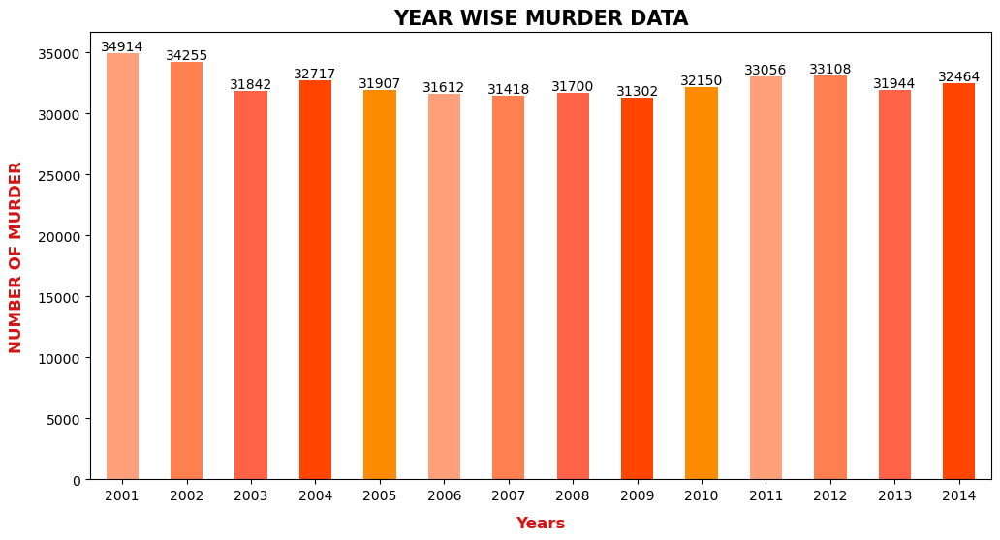

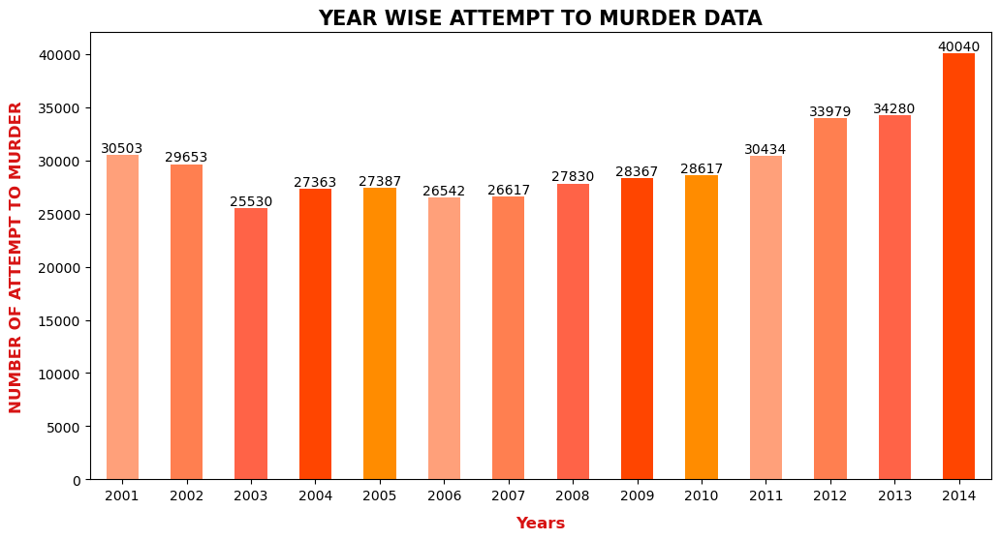

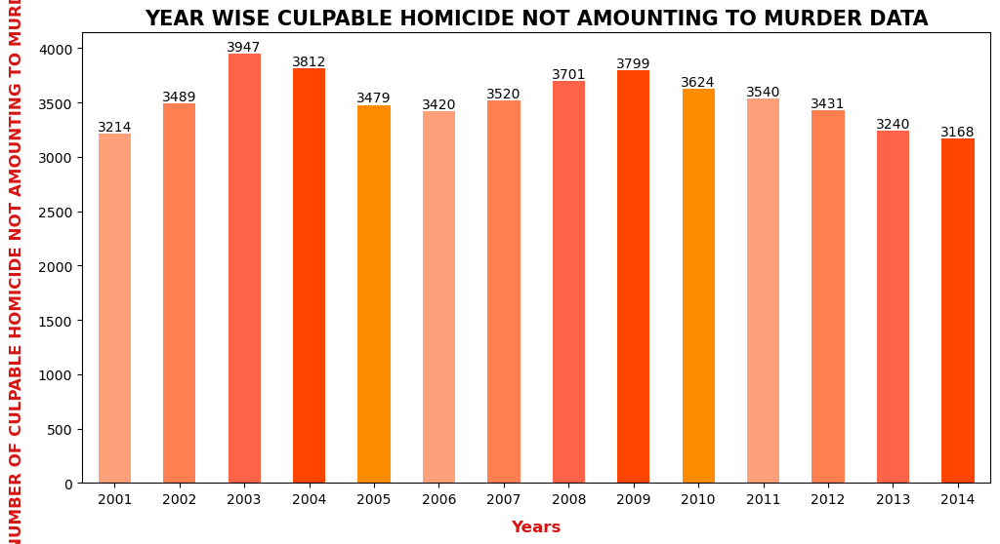

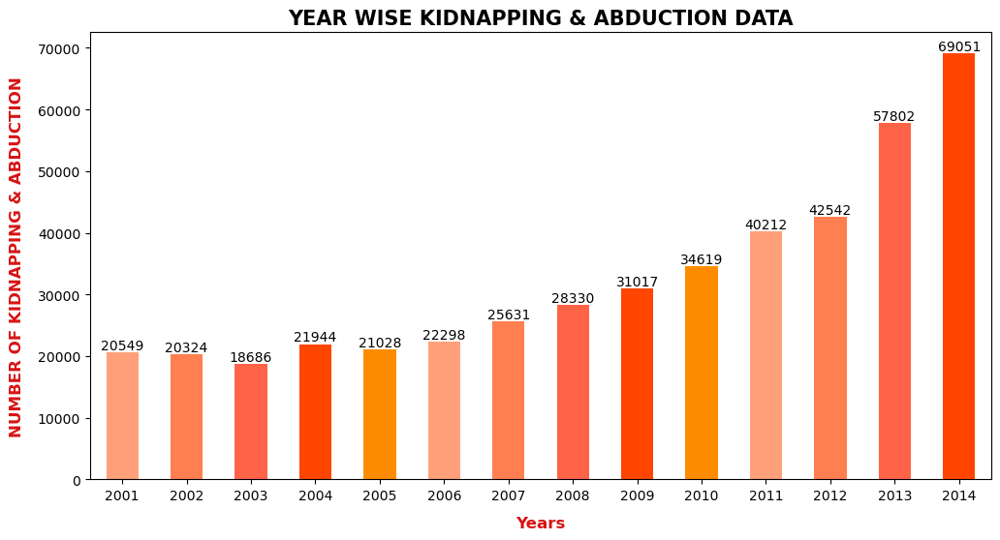

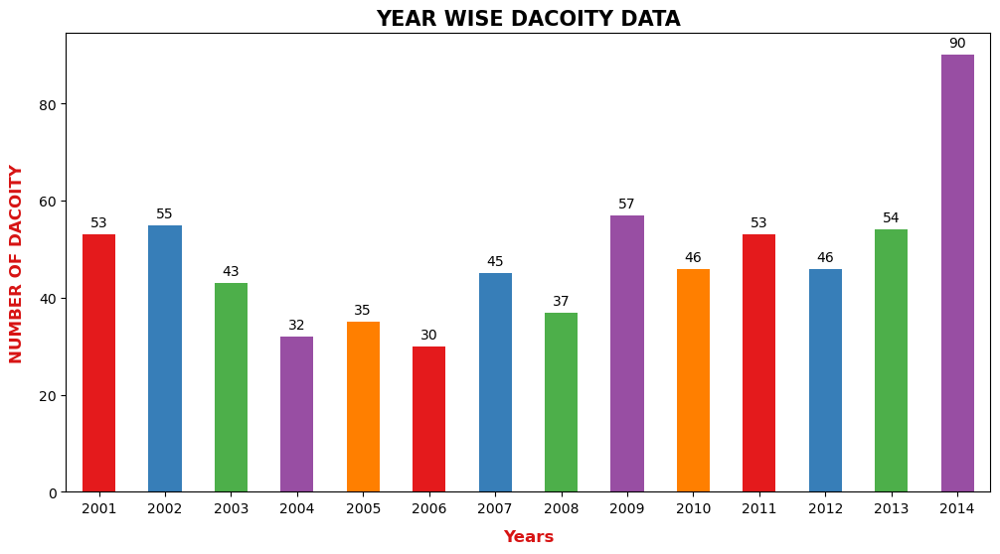

...

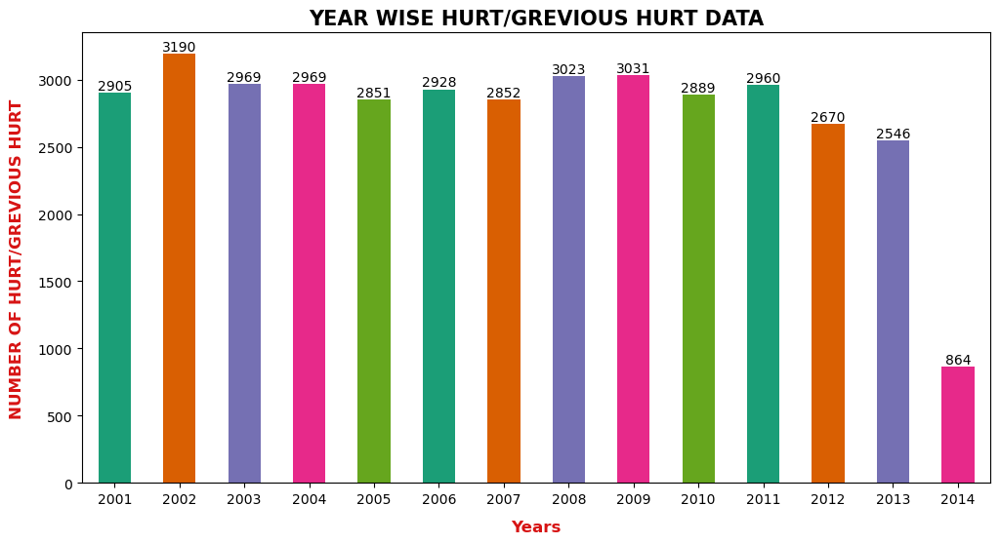

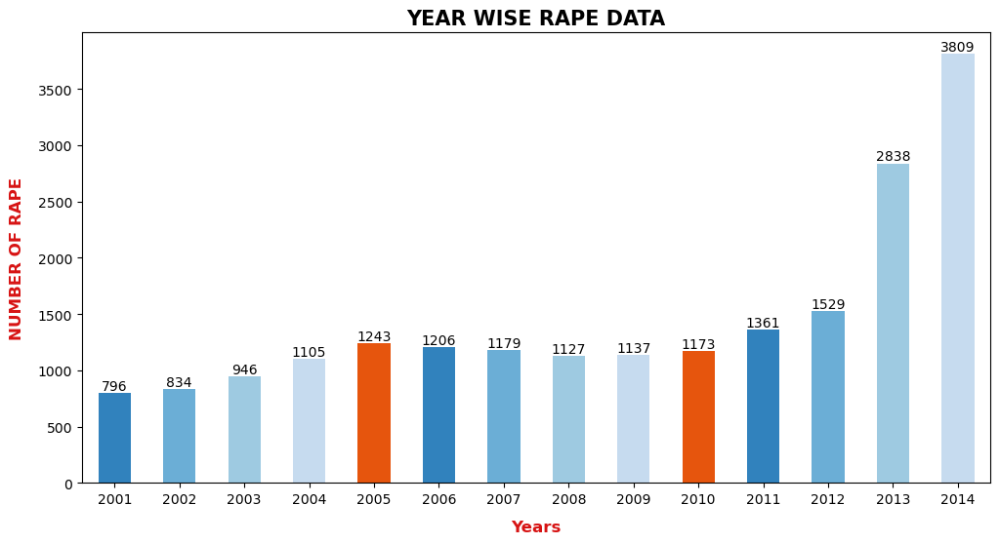

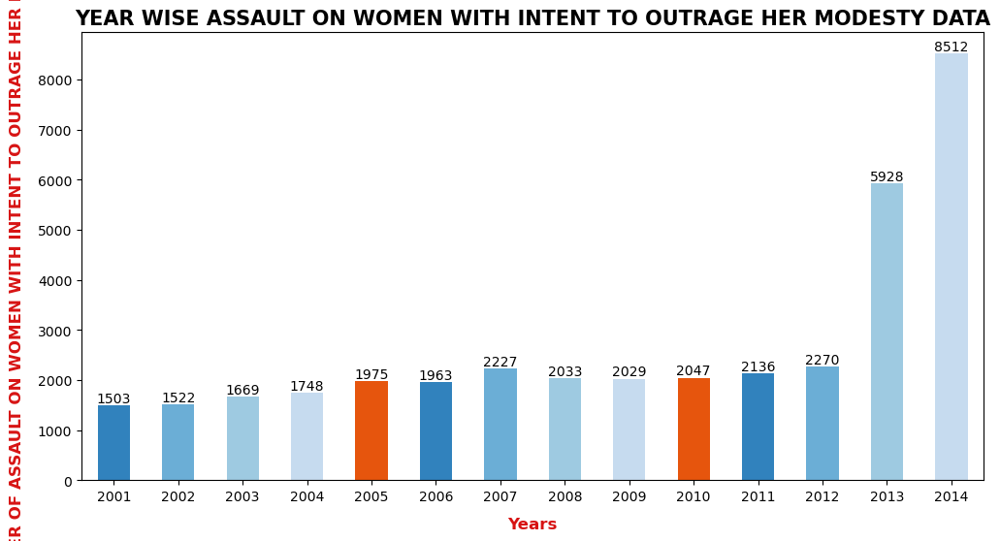

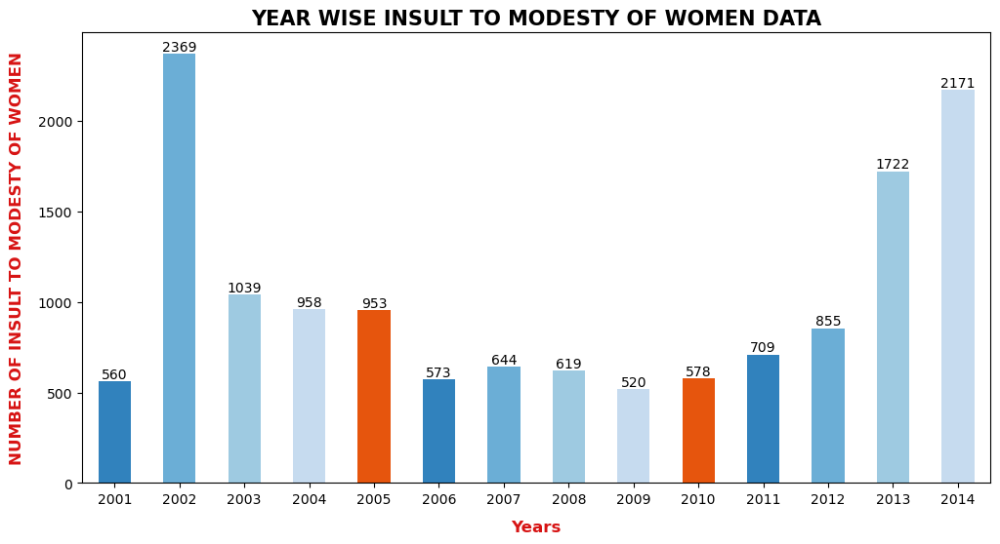

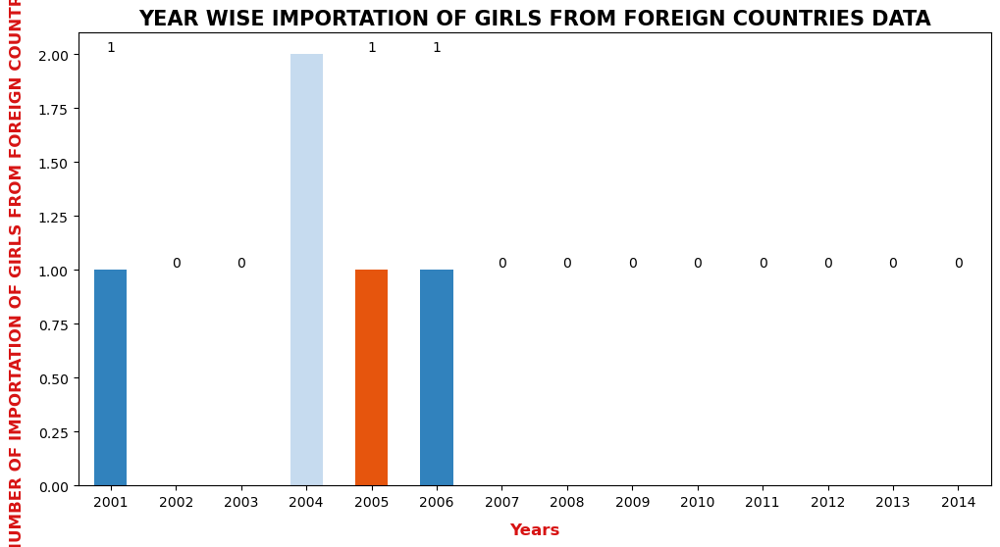

In [193]:
#udata-UT
#sdata-State data
#data- all data
#MetroCities -all metrocities
for Crime in Violent_Crime:
    CrimeBarChart_YearWise(Crime,orangecolor2,sdata)
    
for Crime in Property_Crimes:
    CrimeBarChart_YearWise(Crime,redcolor2,udata)
    
for Crime in Social_Offenses:
    CrimeBarChart_YearWise(Crime,greencolor2,udata)
    
for Crime in Crimes_Against_Women:
    CrimeBarChart_YearWise(Crime,bluecolor2,MetroCities)    

### Bivariate analysis of crimes against districts of states
Crime analysis of each crime category in districts of states enables a comprehensive understanding of the distribution and prevalence of various types of crimes across different regions. By examining crime data at the district level, we gain insights into the specific areas that experience higher or lower rates of different crimes

In [194]:
def CrimeStateWise(Crime):
    plt.figure(figsize=(20, 12))
    state_Crime_sum = data.groupby('STATE/UT')[Crime].sum().reset_index()
    sns.barplot(y=Crime,x='STATE/UT',data=state_Crime_sum.sort_values(by=Crime,ascending=0))
    plt.xlabel('STATE/UT', weight = "bold")
    plt.xticks(rotation=90)
    plt.ylabel(Crime,weight = "bold")
    plt.title(Crime+' DATA',weight = "bold")
    plt.show()

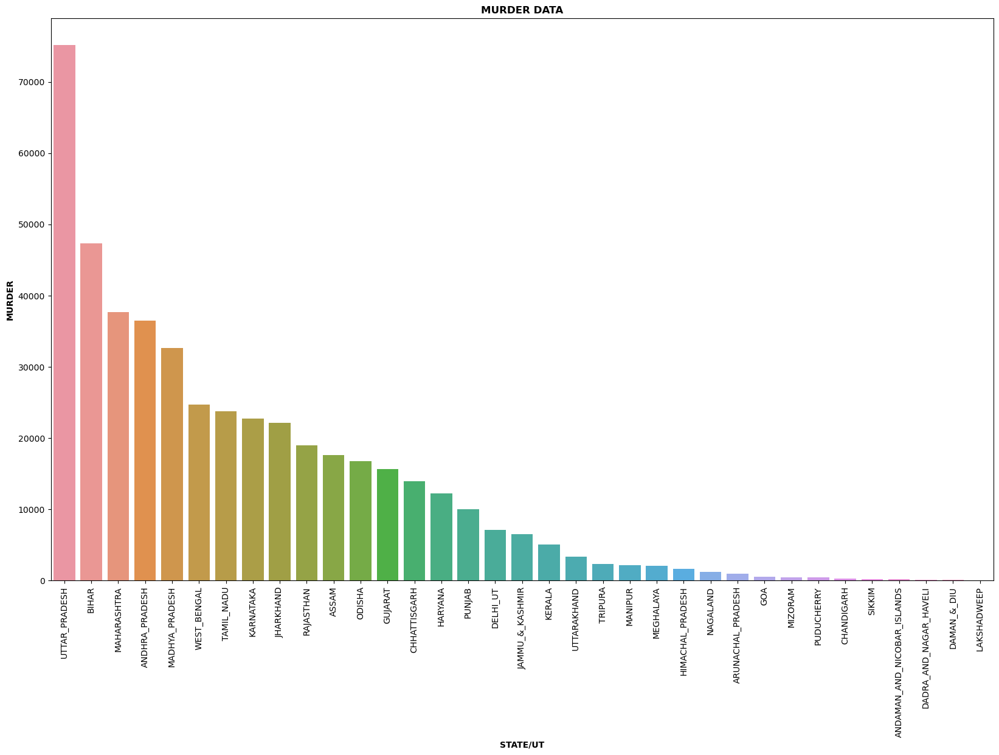

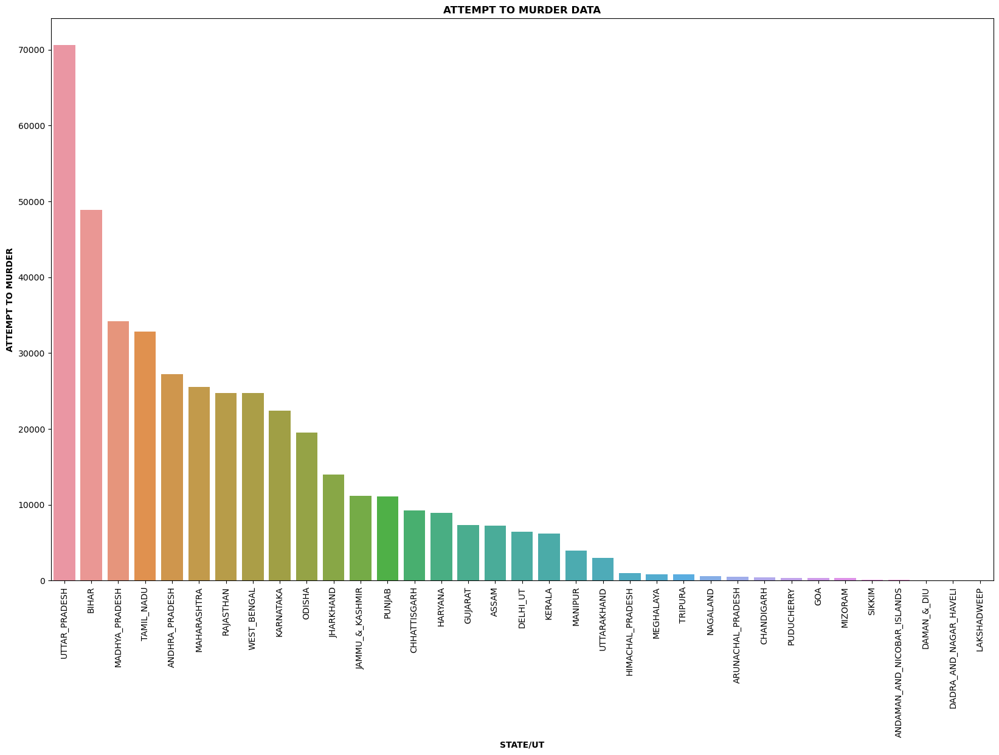

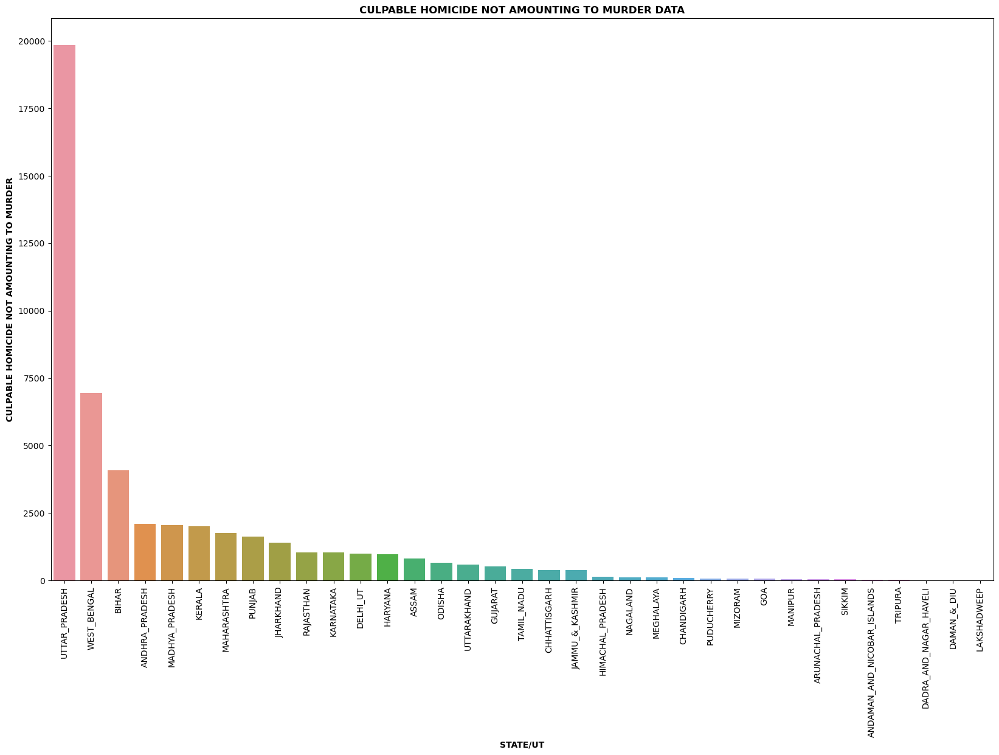

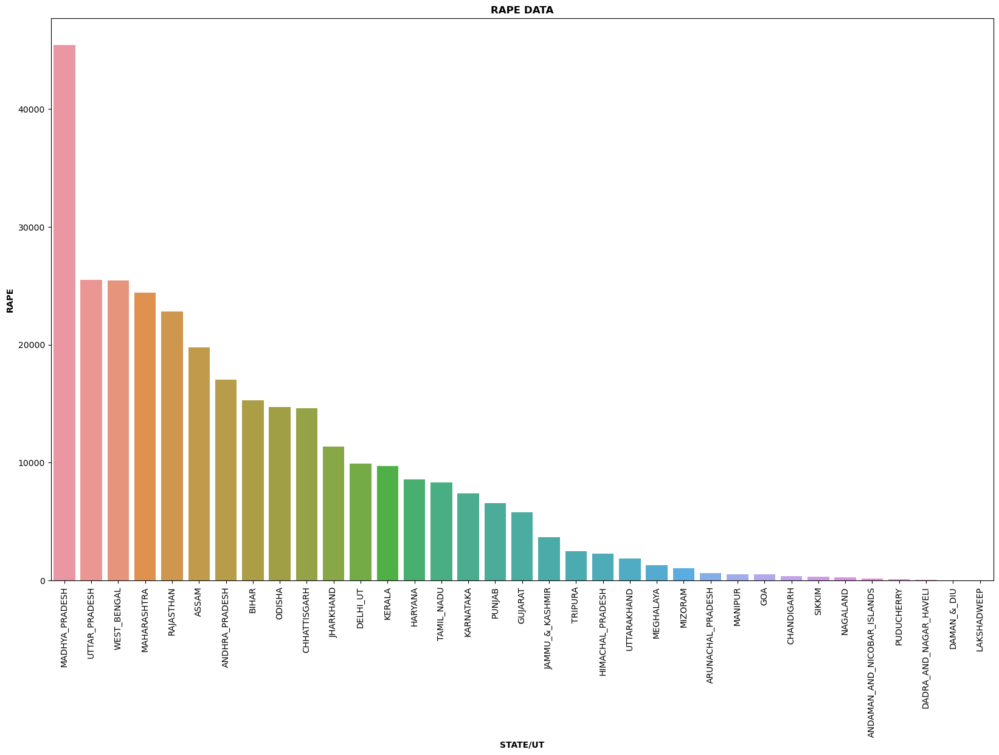

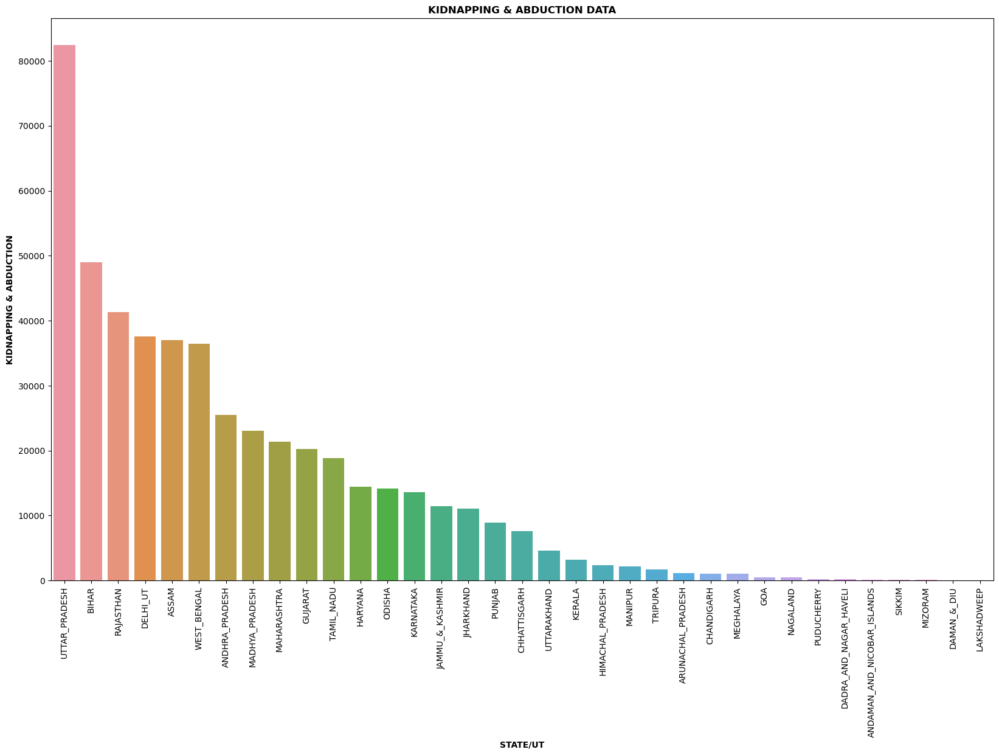

...

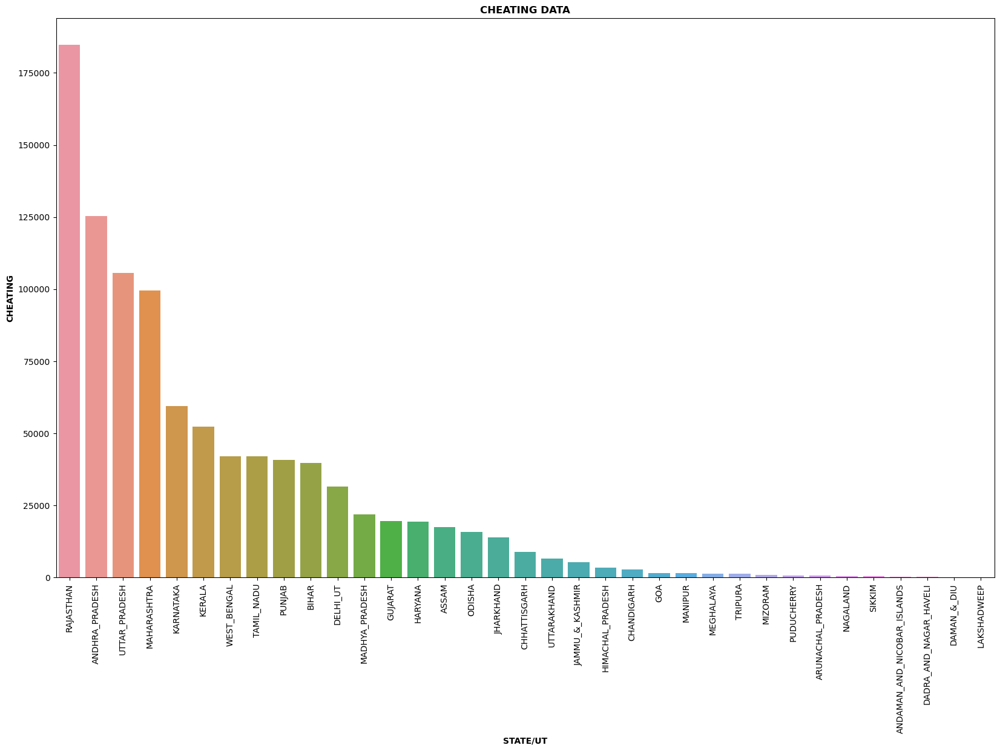

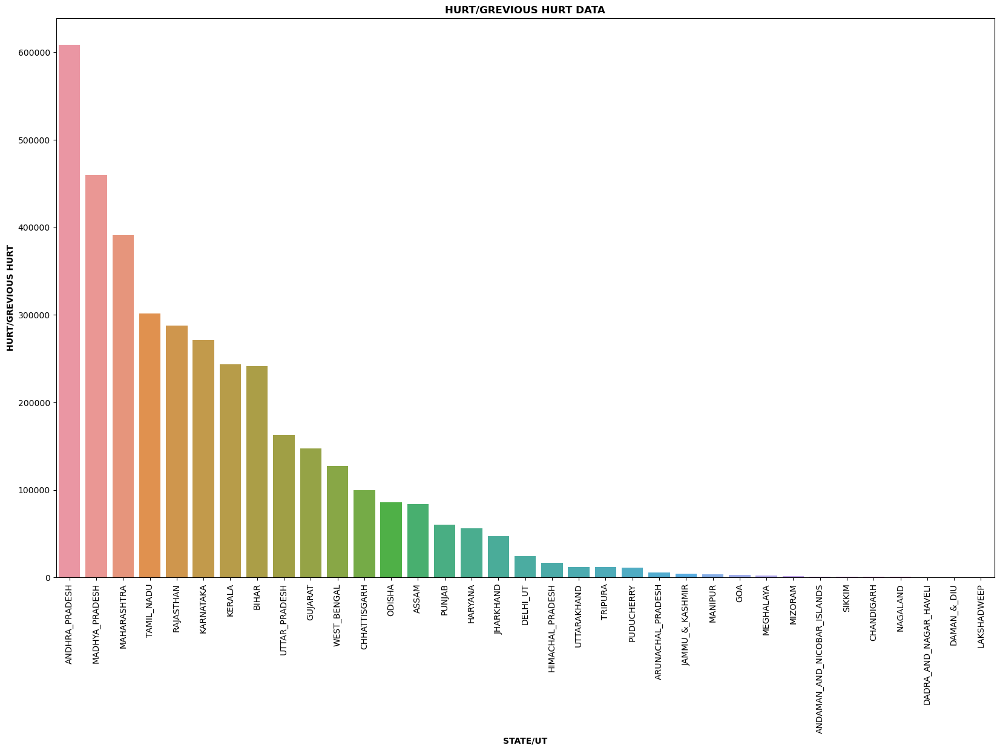

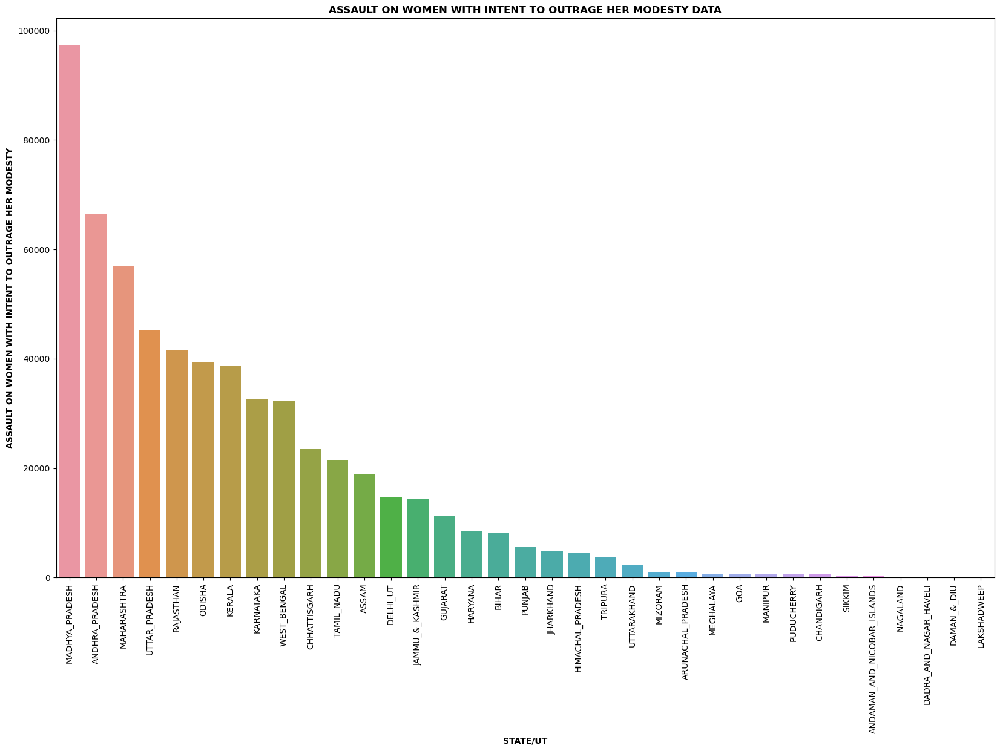

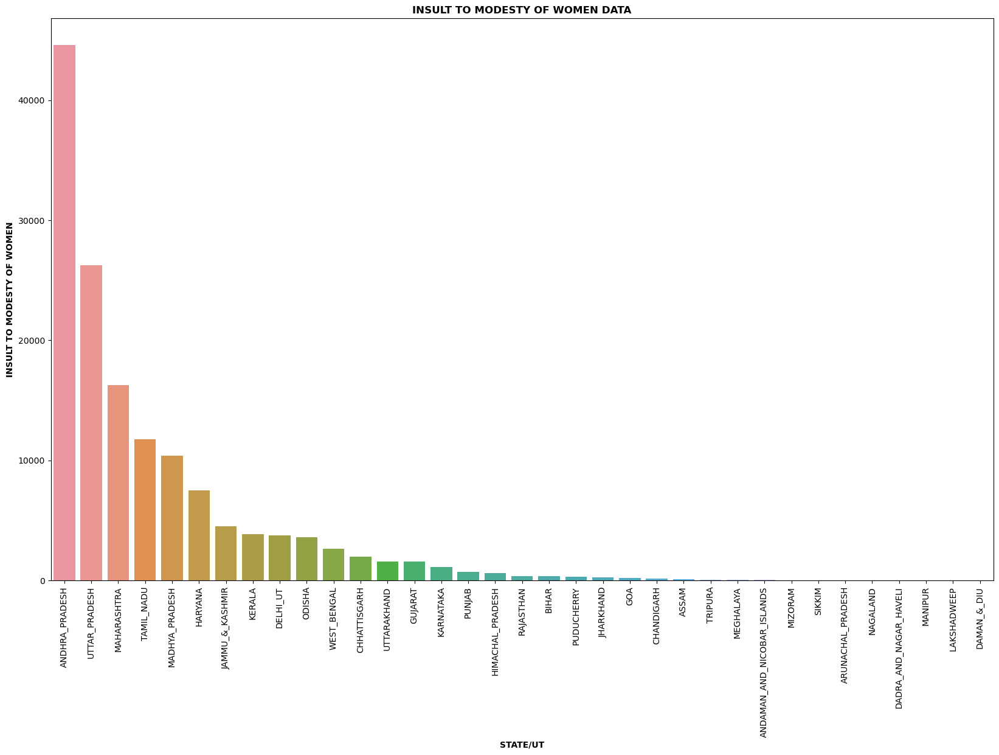

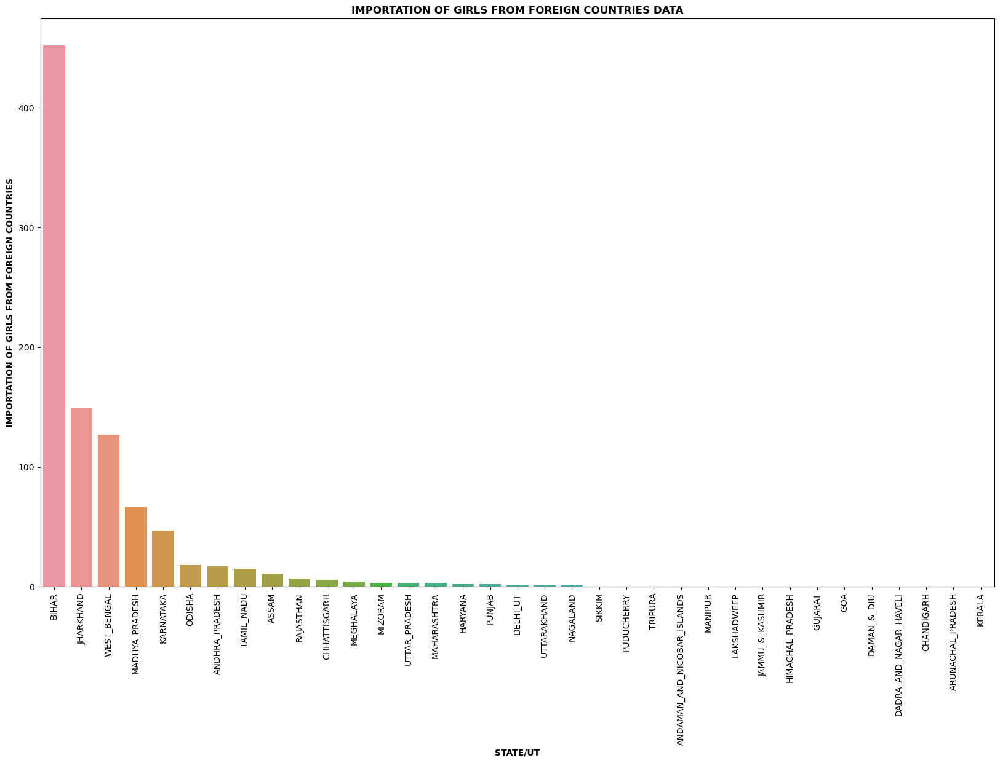

In [195]:
for cr in NumericalCrimeFeature:
    CrimeStateWise(cr)

In [196]:
#DT-udata,sdata,data,MetroCities,dfnorth_india,dfsouth_india,dfeast_india,dfwest_india,dfcentral_india,dfnortheast_india
#region-STATE/UT,DISTRICT
#catcrime-Violent_Crime,Property_Crimes,Crimes_Against_Women,Social_Offenses,Numaricalcrime
#number-5
#minmax-'Max'or'Min


def TopMinMax(DT,region,catcrime,num,minmax):  
    if minmax=='Max':
        #print(minmax)
        fl=True
    else:
        fl=False       
    totaldis={}
    for st in DT[region].unique():
        total=0
        TT=0
        for crime in catcrime:
            TT=DT[DT[region]==st][crime].sum()
            total=total+TT
        totaldis[st]=total   
    LIST=list(sorted(totaldis.items(),key=lambda item: item[1], reverse=fl))[:num]
    return pd.DataFrame(LIST,columns=[region, 'CrimeRate'])
    

In [197]:
print('Top District within State in Maximum violent Crime')
TopMinMax(sdata,'DISTRICT',Violent_Crime,5,'Max')

Top District within State in Maximum violent Crime


,DISTRICT,CrimeRate
0,PATNA,13290
1,BENGALURU CITY,12752
2,MURSHIDABAD,11969
3,24 PARGANAS NORTH,10400
4,MEERUT,8955


In [198]:
print('Top Districts within State has Minimum violent Crime')
TopMinMax(sdata,'DISTRICT',Violent_Crime,5,'Min')

Top Districts within State has Minimum violent Crime


,DISTRICT,CrimeRate
0,ANJAW,8
1,LOWER DIBANG VALLEY,11
2,PAPUM PARE RURAL,17
3,LAHAUL & SPITI,18
4,KHASI HILLS SOUTH WEST,19


In [199]:
print('Top 5 District within State in Maximum Property Crimes')
TopMinMax(sdata,'DISTRICT',Property_Crimes,5,'Max')

Top 5 District within State in Maximum Property Crimes


,DISTRICT,CrimeRate
0,MUMBAI,211207
1,BENGALURU CITY,159492
2,JAIPUR,90287
3,AHMEDABAD COMMR.,80899
4,HYDERABAD CITY,80629


In [200]:
print('Top 5 District within State in Minimum Property Crimes')
TopMinMax(sdata,'DISTRICT',Property_Crimes,5,'Min')

Top 5 District within State in Minimum Property Crimes


,DISTRICT,CrimeRate
0,LONGLENG,25
1,PAPUM PARE RURAL,31
2,LONGDING,33
3,LOWER DIBANG VALLEY,33
4,KHASI HILLS SOUTH WEST,39


In [201]:
print('Top 5 STATE within State in Maximum Crimes Against Women')
TopMinMax(sdata,'STATE/UT',Crimes_Against_Women,5,'Max')

Top 5 STATE within State in Maximum Crimes Against Women


,STATE/UT,CrimeRate
0,MADHYA_PRADESH,153294
1,ANDHRA_PRADESH,128184
2,MAHARASHTRA,97658
3,UTTAR_PRADESH,96889
4,RAJASTHAN,64701


In [202]:
print('Top District within State has Minimum Crimes Against Women')
TopMinMax(sdata,'DISTRICT',Crimes_Against_Women,5,'min')

Top District within State has Minimum Crimes Against Women


,DISTRICT,CrimeRate
0,UPPER DIBANG VALLEY,1
1,LONGLENG,2
2,ANJAW,2
3,LOWER DIBANG VALLEY,3
4,TAMENGLONG,4


In [203]:
print('Top 5 District within State in Maximum Social Offenses')
TopMinMax(dfeast_india,'DISTRICT',Social_Offenses,10,'Max')

Top 5 District within State in Maximum Social Offenses


,DISTRICT,CrimeRate
0,KOLKATA,45957
1,MURSHIDABAD,31150
2,PATNA,27862
3,NADIA,24019
4,MOTIHARI,22521
5,BETTIAH,20926
6,SARAN,20652
7,MUZAFFARPUR,20620
8,NALANDA,18698
9,24 PARGANAS SOUTH,18371


In [204]:
print('Top District within UT has Maximum Violent_Crime')
TopMinMax(udata,'DISTRICT',Violent_Crime,5,'Max')

Top District within UT has Maximum Violent_Crime


,DISTRICT,CrimeRate
0,NORTH WEST DELHI,7739
1,NORTH EAST DELHI,7288
2,OUTER DELHI,6092
3,WEST DELHI,5966
4,EAST DELHI,5713


In [205]:
print('Top District within UT has Maximum Crimes_Against_Women')
TopMinMax(udata,'DISTRICT',Crimes_Against_Women,5,'Max')

Top District within UT has Maximum Crimes_Against_Women


,DISTRICT,CrimeRate
0,SOUTH DELHI,3772
1,NORTH WEST DELHI,3446
2,EAST DELHI,3305
3,SOUTH WEST DELHI,3196
4,WEST DELHI,3159


In [206]:
print('Top District within UT has Maximum Social_Offenses')
TopMinMax(udata,'DISTRICT',Social_Offenses,5,'Max')

Top District within UT has Maximum Social_Offenses


,DISTRICT,CrimeRate
0,PUDUCHERRY,12297
1,WEST DELHI,6333
2,SOUTH DELHI,6313
3,NORTH WEST DELHI,5851
4,EAST DELHI,5660


In [207]:
print('Top District within UT has Maximum Property_Crimes')
TopMinMax(udata,'DISTRICT',Property_Crimes,5,'Max')

Top District within UT has Maximum Property_Crimes


,DISTRICT,CrimeRate
0,SOUTH DELHI,50691
1,EAST DELHI,48068
2,NORTH WEST DELHI,45292
3,WEST DELHI,44993
4,NORTH EAST DELHI,35966


In [208]:
TopMinMax(sdata,'DISTRICT',NumericalCrimeFeature,5,'Max')

,DISTRICT,CrimeRate
0,MUMBAI,314142
1,BENGALURU CITY,256465
2,HYDERABAD CITY,172409
3,JAIPUR,171133
4,CYBERABAD,119740


### Maximum and Minimum Crimerate of 14 years in state and graphical representation 

In [209]:
def CrimeMeanfun(text,crimelist):
    DT=sdata # state data-sdata , UT data-udata
    crimeL=[]
    STLIST=[]
    print('\n\033[91m\033[1m'+'                                 -------'+text+'------'+'\033[0m')
    for crime in crimelist:
        TEMPmax=0
        stmax=''
        TEMPmin=1000000
        stmin=''
        print('\n\033[1m'+crime+'\033[0m')
        totalcrime=DT[crime].sum()
        print('TOTAL '+crime+' Cases 14 YEARS:- ''\033[1m'+ str(totalcrime) +'\033[0m')
        for state in DT['STATE/UT'].unique():
            statesum=DT[DT['STATE/UT']==state][crime].sum() 
            #TEMPmin=statesum
            #print(statesum)
            if statesum>=TEMPmax:
                TEMPmax=statesum
                stmax=state
            #print('before condition state- '+state+' -'+'TEMPmin -'+str(TEMPmin)+' Statesum- '+str(statesum))    
            if statesum<=TEMPmin:
                #print('Pass')
                TEMPmin=statesum
                stmin=state 
                #print('After condition- '+stmin+'-'+str(TEMPmin) )   
 
                #print()
        crimeL.append(TEMPmax)
        STLIST.append(stmax)
        print('\033[96m\033[1m'+'Maximum cases '+stmax+': '+str(TEMPmax)+'\033[0m')           
        print('\033[92m\033[1m'+'Minimum cases '+stmin+': '+str(TEMPmin)+'\033[0m')           
    plt.figure(figsize=(10,2))
    sns.barplot(x=crimeL,y=crimelist)
    plt.show()


                                 -------VIOLENT CRIME------

MURDER
TOTAL MURDER Cases 14 YEARS:- 454389
Maximum cases UTTAR_PRADESH: 75170
Minimum cases SIKKIM: 207

ATTEMPT TO MURDER
TOTAL ATTEMPT TO MURDER Cases 14 YEARS:- 417142
Maximum cases UTTAR_PRADESH: 70599
Minimum cases SIKKIM: 136

CULPABLE HOMICIDE NOT AMOUNTING TO MURDER
TOTAL CULPABLE HOMICIDE NOT AMOUNTING TO MURDER Cases 14 YEARS:- 49384
Maximum cases UTTAR_PRADESH: 19843
Minimum cases TRIPURA: 24

KIDNAPPING & ABDUCTION
TOTAL KIDNAPPING & ABDUCTION Cases 14 YEARS:- 454033
Maximum cases UTTAR_PRADESH: 82415
Minimum cases MIZORAM: 110


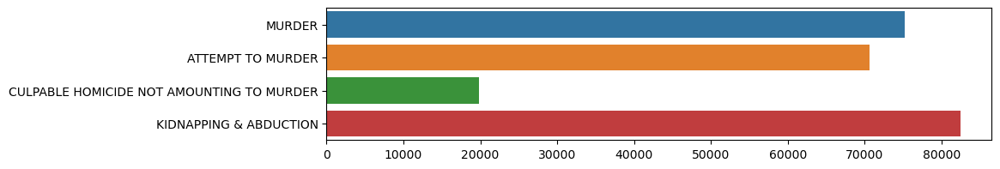


                                 -------PROPERTY CRIME------

DACOITY
TOTAL DACOITY Cases 14 YEARS:- 65491
Maximum cases BIHAR: 11691
Minimum cases SIKKIM: 12

ROBBERY
TOTAL ROBBERY Cases 14 YEARS:- 293496
Maximum cases MAHARASHTRA: 54383
Minimum cases SIKKIM: 83

BURGLARY
TOTAL BURGLARY Cases 14 YEARS:- 1279968
Maximum cases MAHARASHTRA: 221044
Minimum cases MANIPUR: 915

THEFT
TOTAL THEFT Cases 14 YEARS:- 3709762
Maximum cases MAHARASHTRA: 621470
Minimum cases SIKKIM: 1298


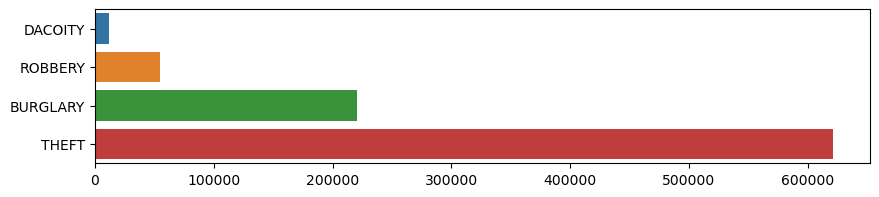


                                 -------SOCIAL OFFENSES------

RIOTS
TOTAL RIOTS Cases 14 YEARS:- 896862
Maximum cases BIHAR: 130100
Minimum cases PUNJAB: 18

CHEATING
TOTAL CHEATING Cases 14 YEARS:- 931700
Maximum cases RAJASTHAN: 184710
Minimum cases SIKKIM: 453

HURT/GREVIOUS HURT
TOTAL HURT/GREVIOUS HURT Cases 14 YEARS:- 3738257
Maximum cases ANDHRA_PRADESH: 608316
Minimum cases NAGALAND: 614


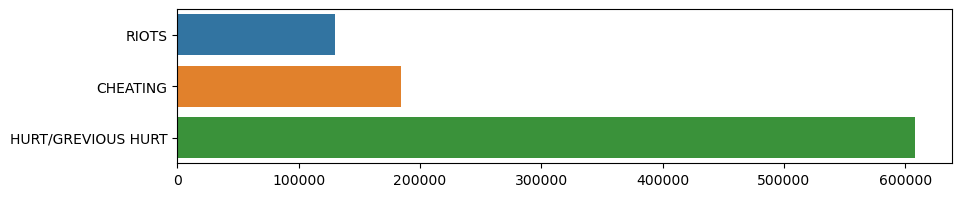


                                 -------CRIMES AGAINST WOMEN------

RAPE
TOTAL RAPE Cases 14 YEARS:- 297878
Maximum cases MADHYA_PRADESH: 45414
Minimum cases NAGALAND: 281

ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY
TOTAL ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY Cases 14 YEARS:- 582149
Maximum cases MADHYA_PRADESH: 97396
Minimum cases NAGALAND: 130

INSULT TO MODESTY OF WOMEN
TOTAL INSULT TO MODESTY OF WOMEN Cases 14 YEARS:- 140638
Maximum cases ANDHRA_PRADESH: 44573
Minimum cases MANIPUR: 3

IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES
TOTAL IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES Cases 14 YEARS:- 935
Maximum cases BIHAR: 452
Minimum cases GOA: 0


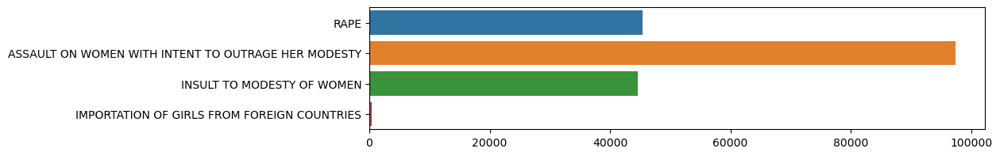

In [210]:
CrimeMeanfun('VIOLENT CRIME',Violent_Crime)
CrimeMeanfun('PROPERTY CRIME',Property_Crimes)
CrimeMeanfun('SOCIAL OFFENSES',Social_Offenses)
CrimeMeanfun('CRIMES AGAINST WOMEN',Crimes_Against_Women)

#### Percentage of Crime in Each District of States

In [211]:
# Calculate total murder crime for the state
def MAXIMUMPERCENTAGEinDistrict(CategoryCrime):
    for crime in CategoryCrime:
        for year in range(2001,2005,1):
            print('\n\033[1m'+str(year)+' MAXIMUM PERCENTAGE OF '+crime+' IN DISTRICT OF STATE/UT  \033[0m')
            for state in data['STATE/UT'].unique():
                temp1=0
                dt=0
                #print(' '+str(state))
                total_murder_state = data[(data['STATE/UT'] == state)&(data['YEAR'] == year)][crime].sum()
                for district in data[data['STATE/UT']==state]['DISTRICT'].unique():
                    districtsum=data[(data['STATE/UT'] == state)&(data['YEAR'] == year)&(data['DISTRICT'] == district)][crime].sum()
                    per=(districtsum/total_murder_state)*100
                    #print('   '+district+'-'+f'{per:.2f}'+' %')
                    if per>temp1:
                        temp1=per
                        dt=district
                P=temp1     
                if not math.isnan(P):
                    print('   STATE {} DISTRICT {}- {:.2f} %'.format(state, dt, P))
                else:
                    print('   STATE {} DISTRICT {}- NaN %'.format(state, dt))

##### Average percentage of increment or decrement of each year in crime cases 

In [212]:
#average persectage of increment or dicrement of crimes over the states bar and line combine

for st in data['STATE/UT'].unique():
    print('\n\033[1m'+st+' :'+'\033[0m\n')
    crdis={}
    for crm in NumericalCrimeFeature:
        t2=0
        crmlist=[]
        for year in range(2001,2015,1):
            total=0
            per=0
            minus=0
            total=data[(data['STATE/UT'] == st)&(data['YEAR'] == year)][crm].sum()
            if year==2001:
                t2=total
            else:
                minus=total-t2
                per=(minus/t2)*100
                t2=total
            crmlist.append(per)
        avgper=sum(crmlist)/len(crmlist)  
        if avgper>=0:
            print(f'Average persentage of increment in  Cases over the years {avgper:.2f} \n')
        else:
            print(f'Average persentage of Decrement in Cases over the years {avgper:.2f} \n')



JAMMU_&_KASHMIR :

Average persentage of Decrement in Cases over the years -11.75 

Average persentage of Decrement in Cases over the years -6.48 

Average persentage of increment in  Cases over the years 0.89 

Average persentage of increment in  Cases over the years 10.11 

Average persentage of increment in  Cases over the years 3.12 

Average persentage of increment in  Cases over the years 34.85 

Average persentage of Decrement in Cases over the years -2.67 

Average persentage of increment in  Cases over the years 0.54 

Average persentage of Decrement in Cases over the years -0.04 

Average persentage of increment in  Cases over the years 4.96 

Average persentage of increment in  Cases over the years 5.04 

Average persentage of increment in  Cases over the years 1.89 

Average persentage of increment in  Cases over the years 6.74 

Average persentage of increment in  Cases over the years 1.21 

Average persentage of Decrement in Cases over the years nan 


NAGALAND :

Averag

Average persentage of increment in  Cases over the years 11.13 

Average persentage of Decrement in Cases over the years -0.81 

Average persentage of Decrement in Cases over the years -2.02 

Average persentage of increment in  Cases over the years 2.06 

Average persentage of increment in  Cases over the years 1.45 

Average persentage of increment in  Cases over the years 3.28 

Average persentage of Decrement in Cases over the years -3.46 

Average persentage of increment in  Cases over the years 13.26 

Average persentage of increment in  Cases over the years 12.50 

Average persentage of Decrement in Cases over the years nan 


MANIPUR :

Average persentage of Decrement in Cases over the years -2.95 

Average persentage of increment in  Cases over the years 6.80 

Average persentage of increment in  Cases over the years 22.74 

Average persentage of increment in  Cases over the years 16.85 

Average persentage of increment in  Cases over the years 7.31 

Average persentage of Dec

Average persentage of increment in  Cases over the years 7.96 

Average persentage of Decrement in Cases over the years nan 


KERALA :

Average persentage of increment in  Cases over the years 0.80 

Average persentage of increment in  Cases over the years 4.51 

Average persentage of increment in  Cases over the years 10.30 

Average persentage of increment in  Cases over the years 10.53 

Average persentage of increment in  Cases over the years 7.04 

Average persentage of increment in  Cases over the years 1.10 

Average persentage of increment in  Cases over the years 9.82 

Average persentage of increment in  Cases over the years 2.86 

Average persentage of increment in  Cases over the years 4.44 

Average persentage of increment in  Cases over the years 1.92 

Average persentage of increment in  Cases over the years 11.31 

Average persentage of Decrement in Cases over the years -3.57 

Average persentage of increment in  Cases over the years 9.41 

Average persentage of increm

Average persentage of increment in  Cases over the years 8.06 

Average persentage of increment in  Cases over the years 7.18 

Average persentage of increment in  Cases over the years 8.29 

Average persentage of increment in  Cases over the years 0.97 

Average persentage of increment in  Cases over the years 1.71 

Average persentage of increment in  Cases over the years 2.63 

Average persentage of Decrement in Cases over the years nan 

Average persentage of increment in  Cases over the years 1.24 

Average persentage of Decrement in Cases over the years -2.36 

Average persentage of increment in  Cases over the years 13.78 

Average persentage of increment in  Cases over the years 9.87 

Average persentage of Decrement in Cases over the years nan 


UTTAR_PRADESH :

Average persentage of Decrement in Cases over the years -2.33 

Average persentage of Decrement in Cases over the years -1.21 

Average persentage of increment in  Cases over the years 1.52 

Average persentage of inc

Average persentage of increment in  Cases over the years 6.37 

Average persentage of increment in  Cases over the years 4.97 

Average persentage of Decrement in Cases over the years -1.63 

Average persentage of increment in  Cases over the years 1.83 

Average persentage of increment in  Cases over the years 2.41 

Average persentage of increment in  Cases over the years 4.51 

Average persentage of Decrement in Cases over the years -1.94 

Average persentage of increment in  Cases over the years 7.09 

Average persentage of Decrement in Cases over the years -2.74 

Average persentage of increment in  Cases over the years 6.53 

Average persentage of increment in  Cases over the years 5.00 

Average persentage of Decrement in Cases over the years nan 



In [213]:
for st in data['STATE/UT'].unique():
    print('\n\033[1m'+st+' :'+'\033[0m\n')
    crdis={}
    total=0
    per=0
    minus=0
    t2=0
    Sum=0
    crmlist=[]
    for year in range(2001,2015,1): 
        for crm in Violent_Crime:
            total=data[(data['STATE/UT'] == st)&(data['YEAR'] == year)][crm].sum()
            Sum=total+Sum
        if year==2001:
            t2=Sum
        else:
            minus=Sum-t2
            per=(minus/t2)*100
            t2=Sum
            crmlist.append(per)    
    avgper=sum(crmlist)/len(crmlist)  
    if avgper>=0:
        print(f'Average persentage of increment in  Cases over the years {avgper:.2f} \n')
    else:
        print(f'Average persentage of Decrement in Cases over the years {avgper:.2f} \n')



JAMMU_&_KASHMIR :

Average persentage of increment in  Cases over the years 20.74 


NAGALAND :

Average persentage of increment in  Cases over the years 24.13 


ANDAMAN_AND_NICOBAR_ISLANDS :

Average persentage of increment in  Cases over the years 33.06 


ARUNACHAL_PRADESH :

Average persentage of increment in  Cases over the years 22.10 


LAKSHADWEEP :

Average persentage of increment in  Cases over the years 23.61 


HIMACHAL_PRADESH :

Average persentage of increment in  Cases over the years 25.45 


DAMAN_&_DIU :

Average persentage of increment in  Cases over the years 21.59 


SIKKIM :

Average persentage of increment in  Cases over the years 21.83 


UTTARAKHAND :

Average persentage of increment in  Cases over the years 24.27 


MANIPUR :

Average persentage of increment in  Cases over the years 26.66 


MIZORAM :

Average persentage of increment in  Cases over the years 28.27 


DELHI_UT :

Average persentage of increment in  Cases over the years 26.61 


PUDUCHERRY :

A

#### Line chart CategoryCrime over the years

In [214]:
def CategoryCrime(title,crimecategory):
    DT=sdata # state data-sdata , UT data-udata
    sp=" "
    print('\n\033[91m\033[1m'+sp*50+'--------'+title+'--------'+'\033[0m')
    Crime=[]
    for year in range(2001,2015,1):
        total=0
        #print()
        for crime in crimecategory:
            totalcrime=DT[DT['YEAR']==year][crime].sum()
            #print(crime+'-'+str(totalcrime))
            total=totalcrime+total
        Crime.append(total)
        print('\033[1m'+str(year) +'-'+str(total)+'\033[0m',end=", ")
    #print(ViolentCrime)
    plt.figure(figsize=(15,7))
    sns.lineplot(x=DT['YEAR'].unique(),y=Crime)
    plt.xlabel('YEAR',weight = "bold")
    plt.ylabel('CRIME OCCURED IN NUMBER',weight = "bold")
    plt.title(str.upper(title)+' CASES PRIJECTION',weight = "bold",color='red')
    plt.show()
    print()


                                                  --------VIOLENT CRIME--------
2001-89180, 2002-87721, 2003-80005, 2004-85836, 2005-83801, 2006-83872, 2007-87186, 2008-91561, 2009-94485, 2010-99010, 2011-107242, 2012-113060, 2013-127266, 2014-144723, 

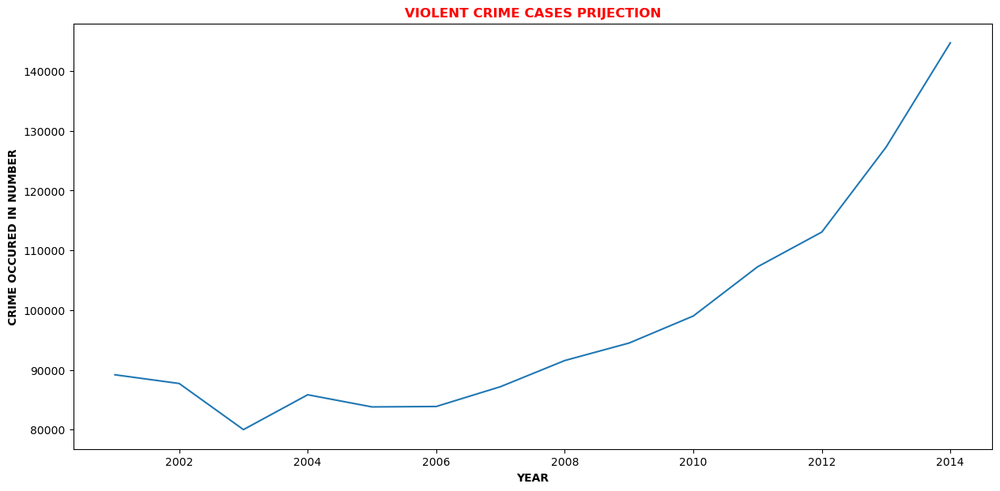



                                                  --------PROPERTY CRIME--------
2001-333001, 2002-328300, 2003-328724, 2004-352746, 2005-350685, 2006-354305, 2007-364589, 2008-394537, 2009-399116, 2010-400156, 2011-412014, 2012-410591, 2013-449968, 2014-469985, 

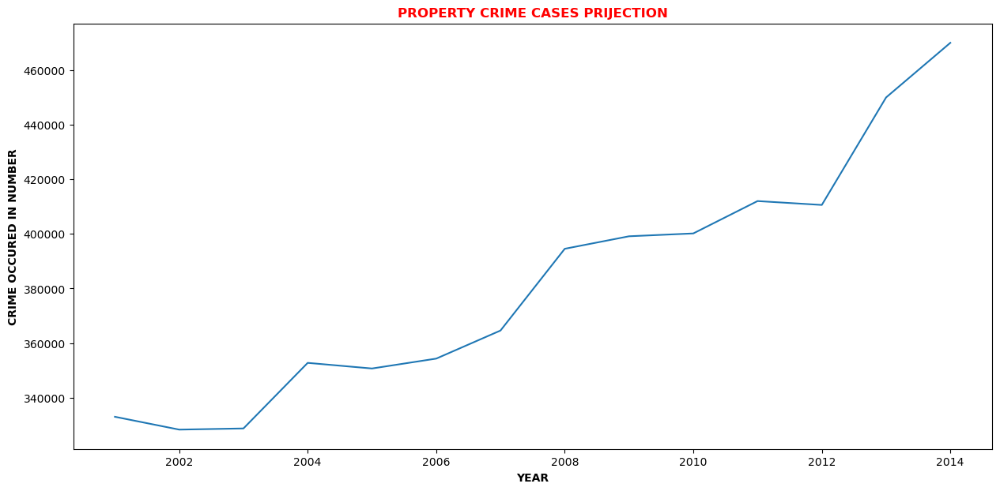



                                                  --------SOCIAL OFFENSES--------
2001-374979, 2002-363813, 2003-359419, 2004-381532, 2005-373434, 2006-372275, 2007-390897, 2008-409383, 2009-406189, 2010-425967, 2011-448624, 2012-490261, 2013-502432, 2014-267614, 

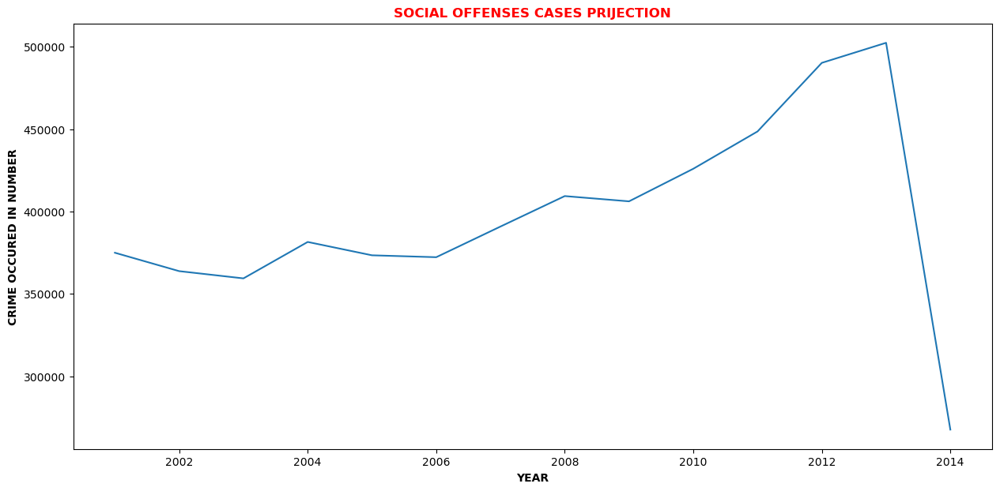



                                                  --------CRIMES AGAINST WOMEN--------
2001-57620, 2002-59089, 2003-60143, 2004-61148, 2005-60411, 2006-63888, 2007-68159, 2008-72116, 2009-69122, 2010-70598, 2011-73445, 2012-76451, 2013-109018, 2014-120392, 

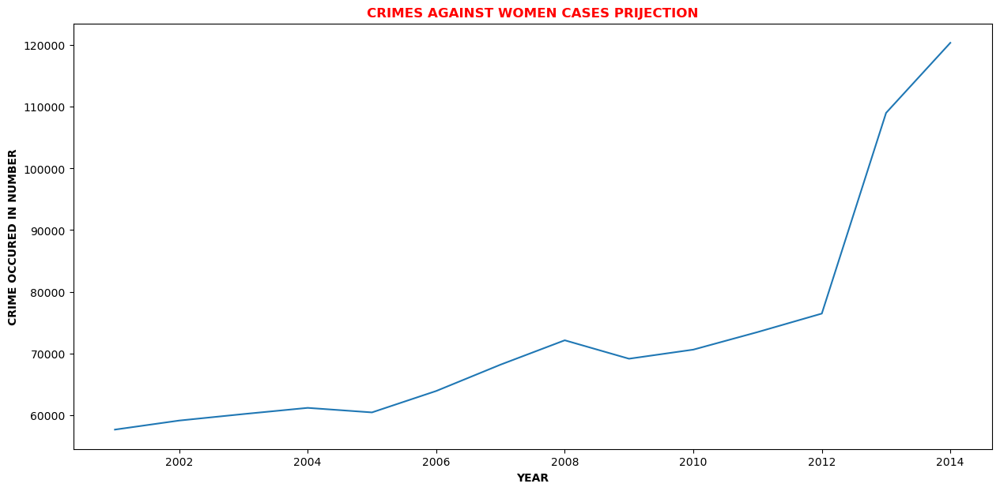

In [215]:
CategoryCrime('VIOLENT CRIME',Violent_Crime)
CategoryCrime('PROPERTY CRIME',Property_Crimes)
CategoryCrime('SOCIAL OFFENSES',Social_Offenses)
CategoryCrime('CRIMES AGAINST WOMEN',Crimes_Against_Women)

##### CategoryCrime of Districts of State has maximum crime rate

In [216]:
def CrimeMaxfun(text,crimelist):
    crimeL=[]
    STLIST=[]
    print('\n\033[91m\033[1m'+'                                       '+text+'\033[0m')
    for crime in crimelist:
        TEMPmax=0
        stmax=''
        print('\n\033[1m'+crime+'\033[0m')
        totalcrime=data[crime].sum()
        print('\033[1m'+'TOTAL '+crime+' RATE IN 14 YEARS:- '+ str(totalcrime) +'\033[0m')
        for state in data['STATE/UT'].unique():
            statesum=data[data['STATE/UT']==state][crime].sum() 
            #print(statesum)
            if statesum>=TEMPmax:
                TEMPmax=statesum
                stmax=state
        print('\033[93m\033[1m'+stmax+': '+str(TEMPmax)+' has maximun total Cases of '+str(crime) + '\033[0m')        
        up_data = data[data['STATE/UT'] == stmax].groupby('DISTRICT').sum()
        up_data.reset_index(inplace=True)
        plt.figure(figsize=(30,20))
        sns.barplot(x=crime, y='DISTRICT', data=up_data.sort_values(by=crime,ascending=0), palette='muted')
        plt.title('Total '+crime+' by District in '+stmax)
        plt.xlabel('Total Murder')
        plt.ylabel('District')
        #plt.xticks(rotation=45)
        for index, value in enumerate(up_data[crime].sort_values(ascending=False)):
            plt.text(value, index, str(value), va='center', ha='left')
        plt.show()


                                       VIOLENT CRIME

MURDER
TOTAL MURDER RATE IN 14 YEARS:- 462599
UTTAR_PRADESH: 75170 has maximun total Cases of MURDER


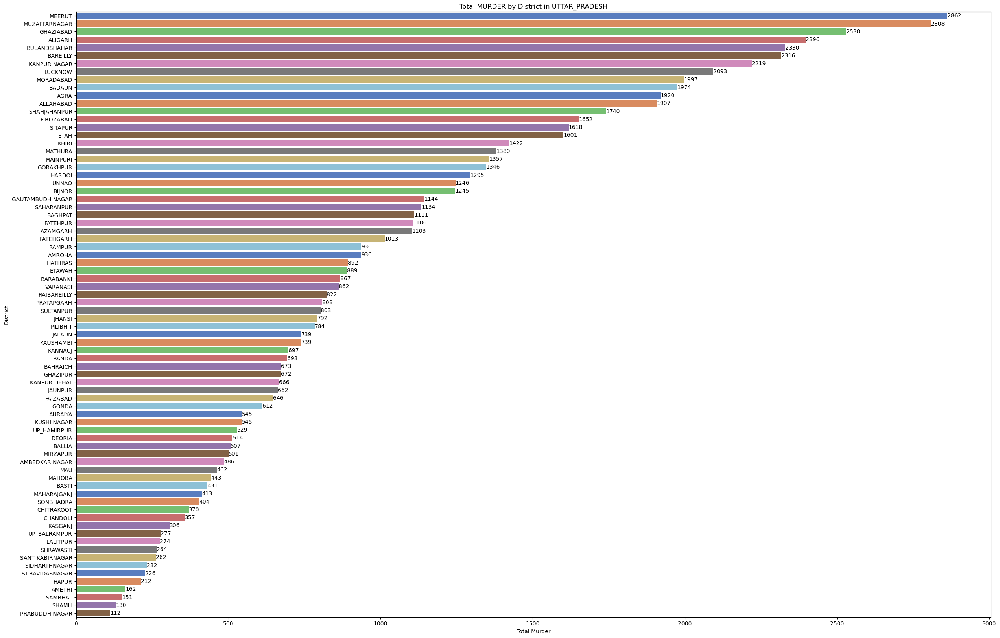


ATTEMPT TO MURDER
TOTAL ATTEMPT TO MURDER RATE IN 14 YEARS:- 424499
UTTAR_PRADESH: 70599 has maximun total Cases of ATTEMPT TO MURDER


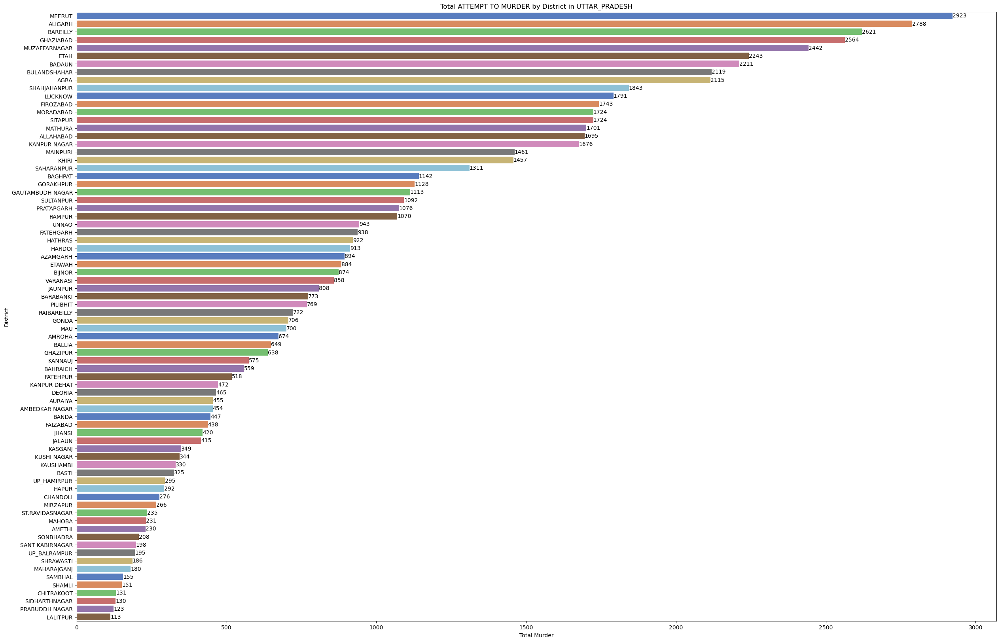


CULPABLE HOMICIDE NOT AMOUNTING TO MURDER
TOTAL CULPABLE HOMICIDE NOT AMOUNTING TO MURDER RATE IN 14 YEARS:- 50584
UTTAR_PRADESH: 19843 has maximun total Cases of CULPABLE HOMICIDE NOT AMOUNTING TO MURDER


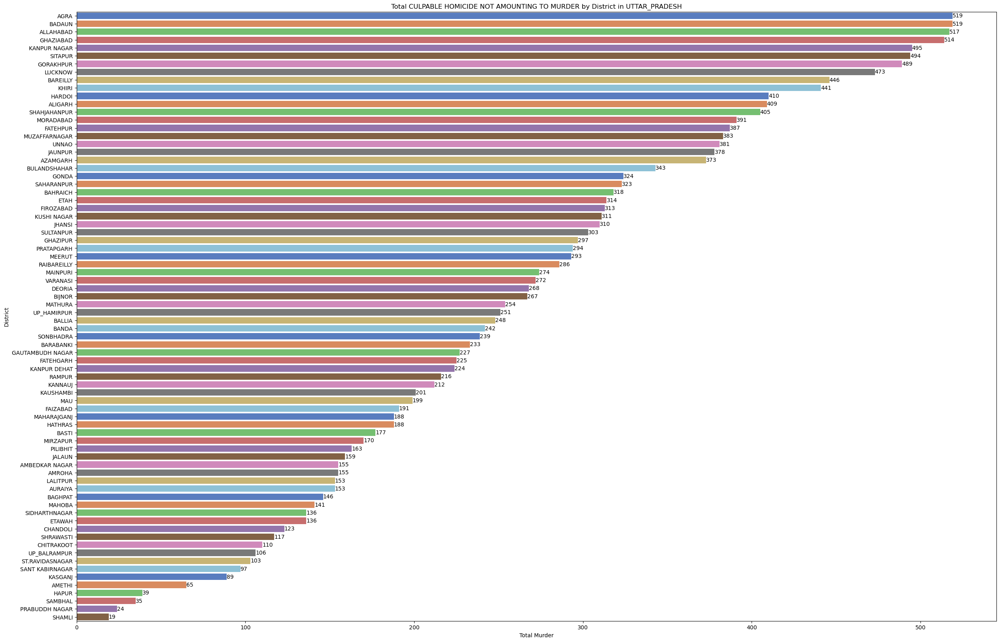


KIDNAPPING & ABDUCTION
TOTAL KIDNAPPING & ABDUCTION RATE IN 14 YEARS:- 493232
UTTAR_PRADESH: 82415 has maximun total Cases of KIDNAPPING & ABDUCTION


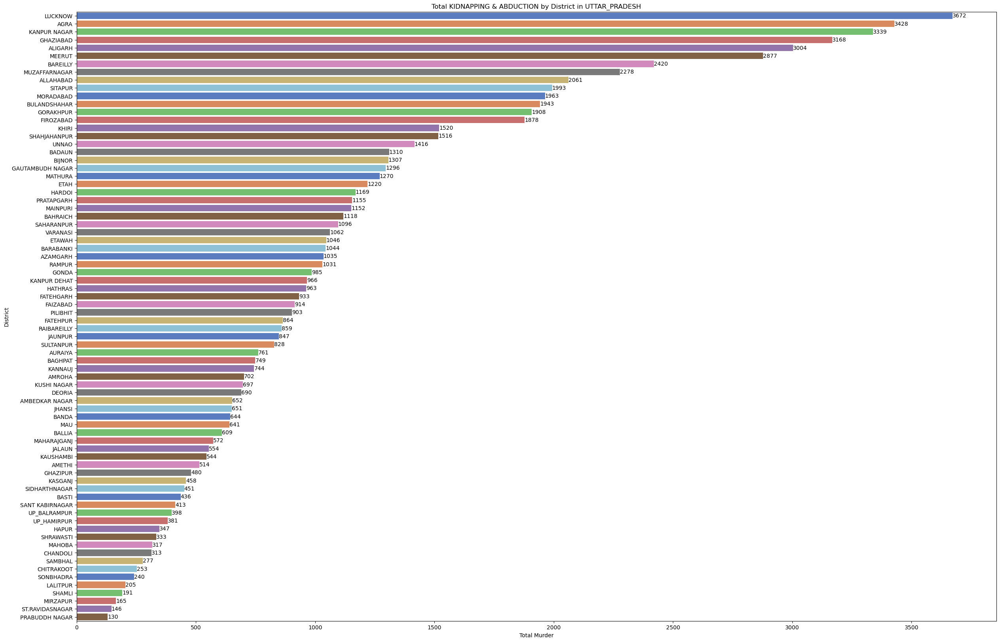


                                       PROPERTY CRIME

DACOITY
TOTAL DACOITY RATE IN 14 YEARS:- 66167
BIHAR: 11691 has maximun total Cases of DACOITY


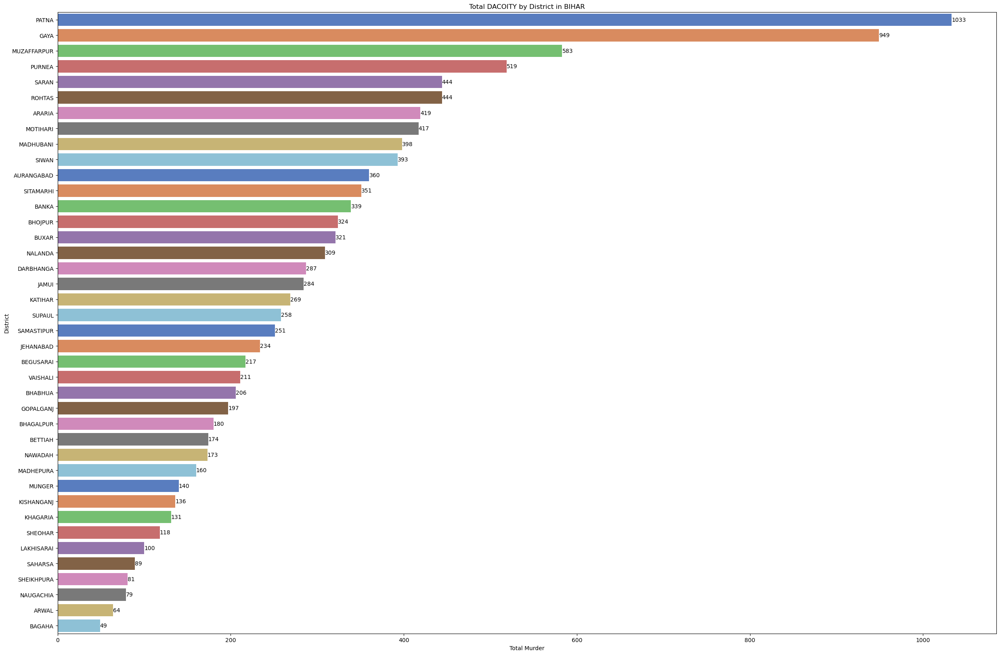


ROBBERY
TOTAL ROBBERY RATE IN 14 YEARS:- 308117
MAHARASHTRA: 54383 has maximun total Cases of ROBBERY


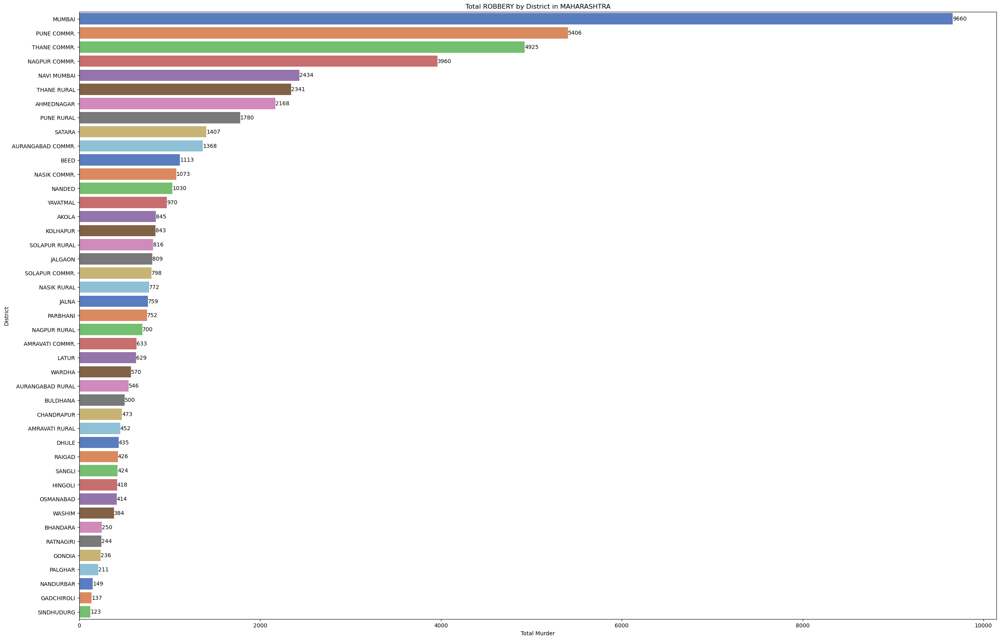


BURGLARY
TOTAL BURGLARY RATE IN 14 YEARS:- 1322617
MAHARASHTRA: 221044 has maximun total Cases of BURGLARY


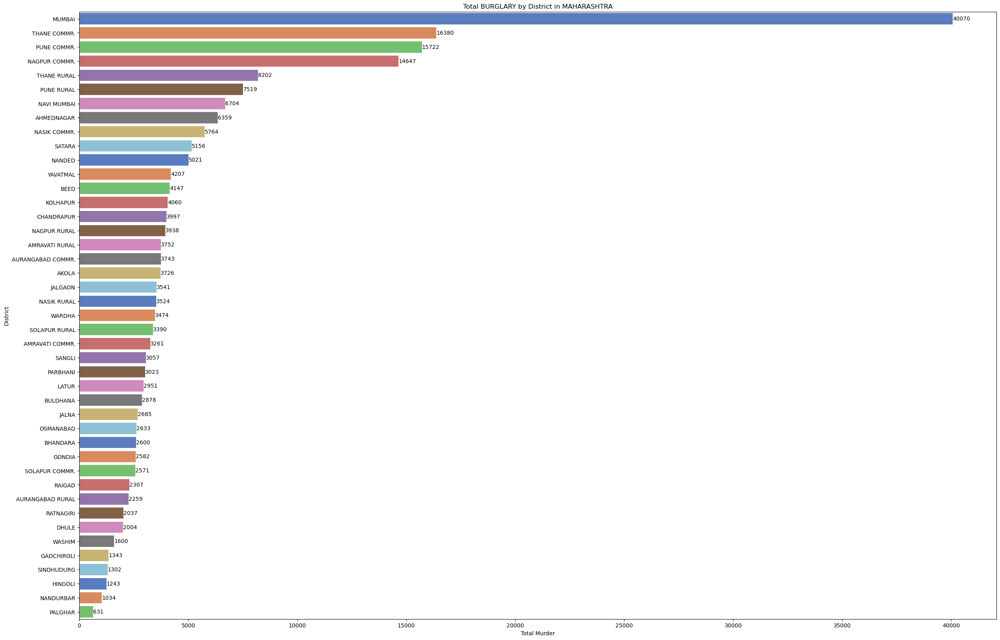


THEFT
TOTAL THEFT RATE IN 14 YEARS:- 4060961
MAHARASHTRA: 621470 has maximun total Cases of THEFT


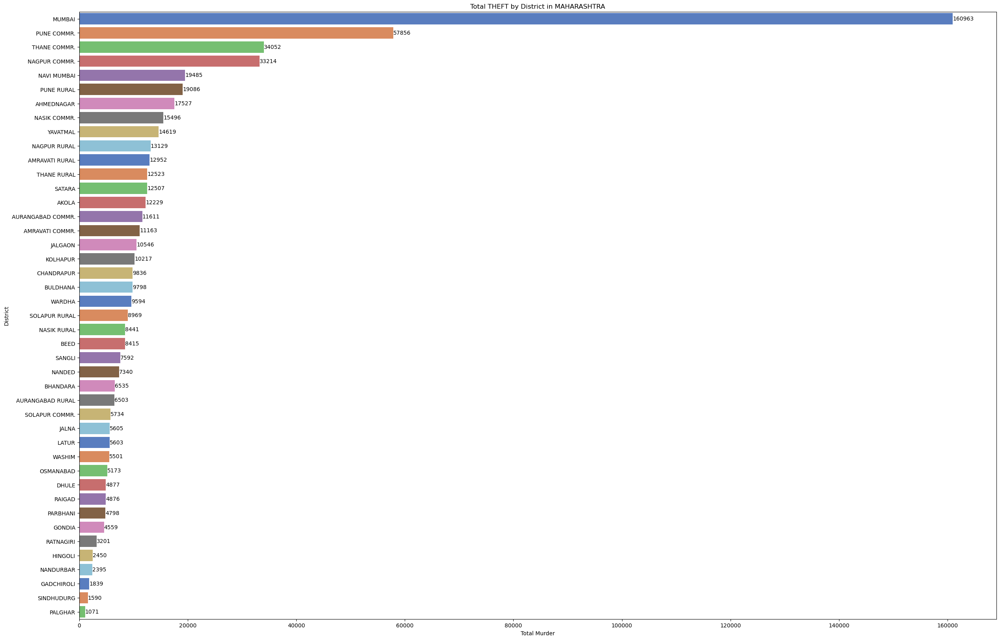


                                       SOCIAL OFFENSES

RIOTS
TOTAL RIOTS RATE IN 14 YEARS:- 901735
BIHAR: 130100 has maximun total Cases of RIOTS


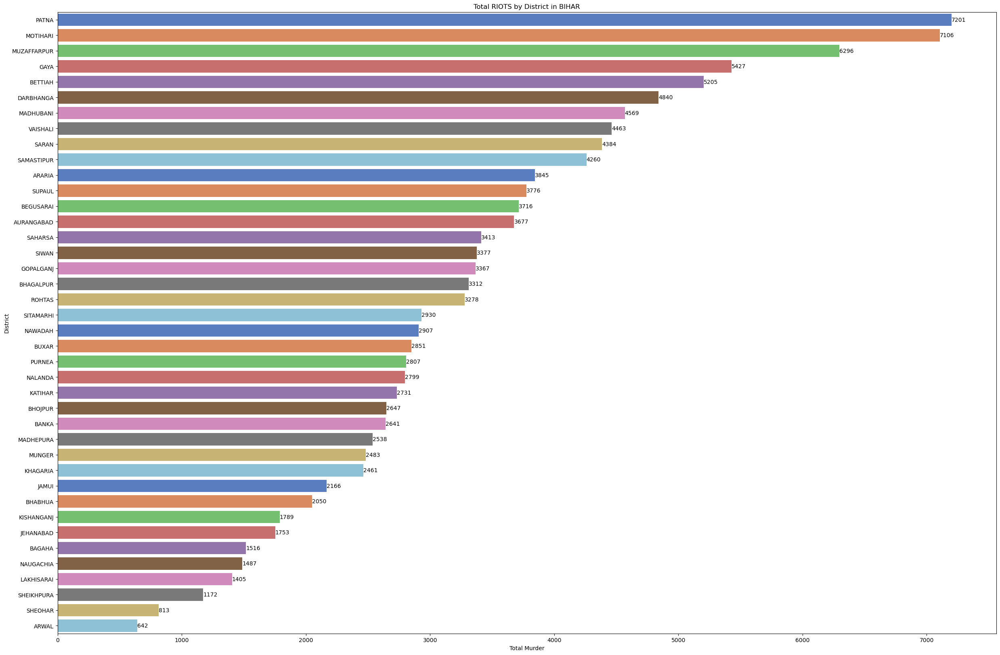


CHEATING
TOTAL CHEATING RATE IN 14 YEARS:- 967468
RAJASTHAN: 184710 has maximun total Cases of CHEATING


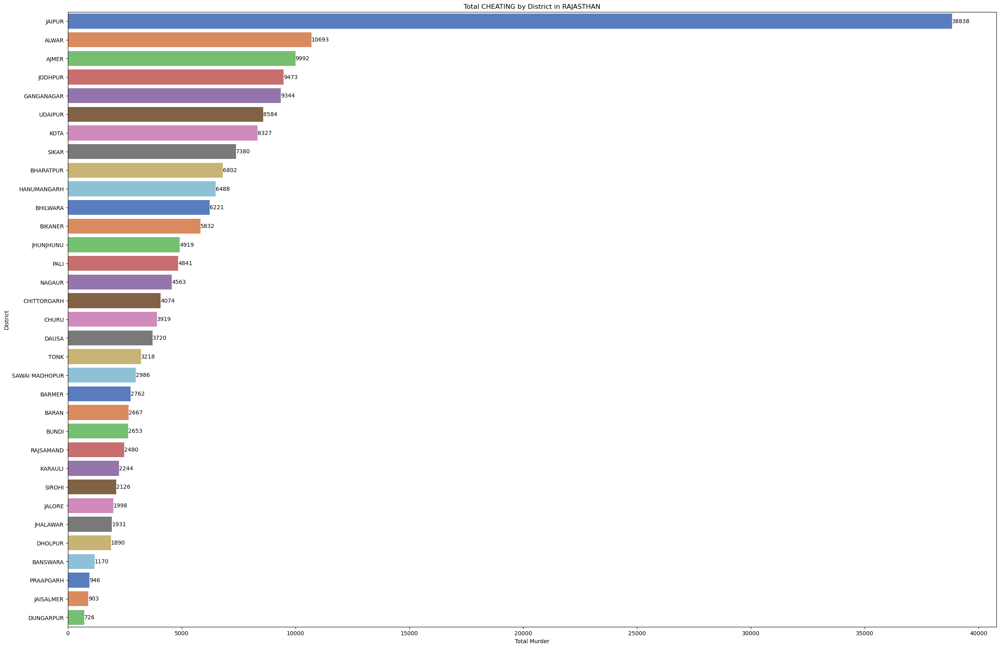


HURT/GREVIOUS HURT
TOTAL HURT/GREVIOUS HURT RATE IN 14 YEARS:- 3776904
ANDHRA_PRADESH: 608316 has maximun total Cases of HURT/GREVIOUS HURT


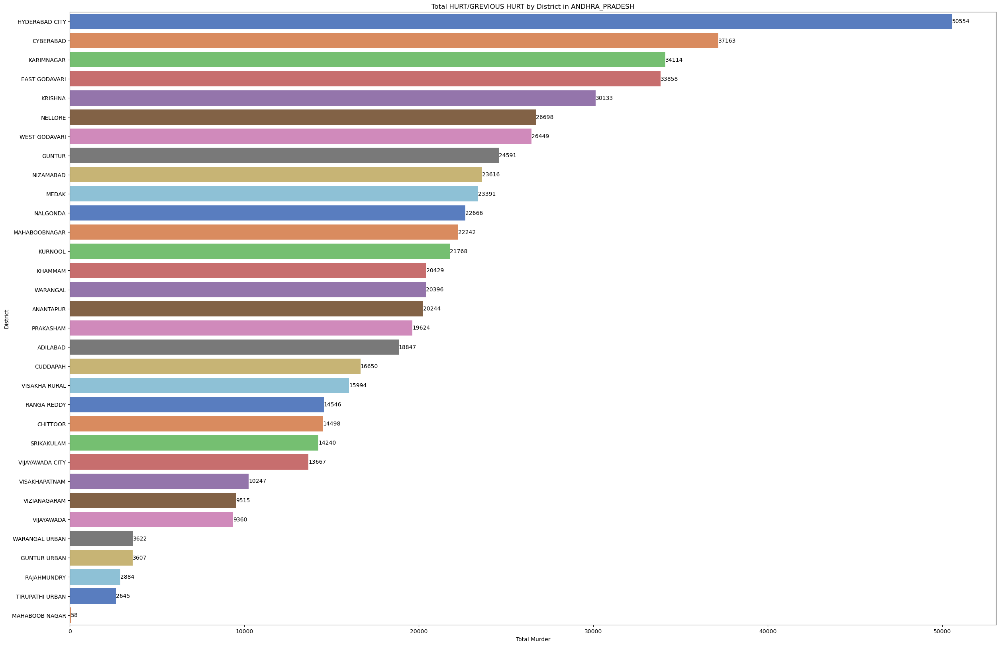


                                       CRIMES AGAINST WOMEN

RAPE
TOTAL RAPE RATE IN 14 YEARS:- 308558
MADHYA_PRADESH: 45414 has maximun total Cases of RAPE


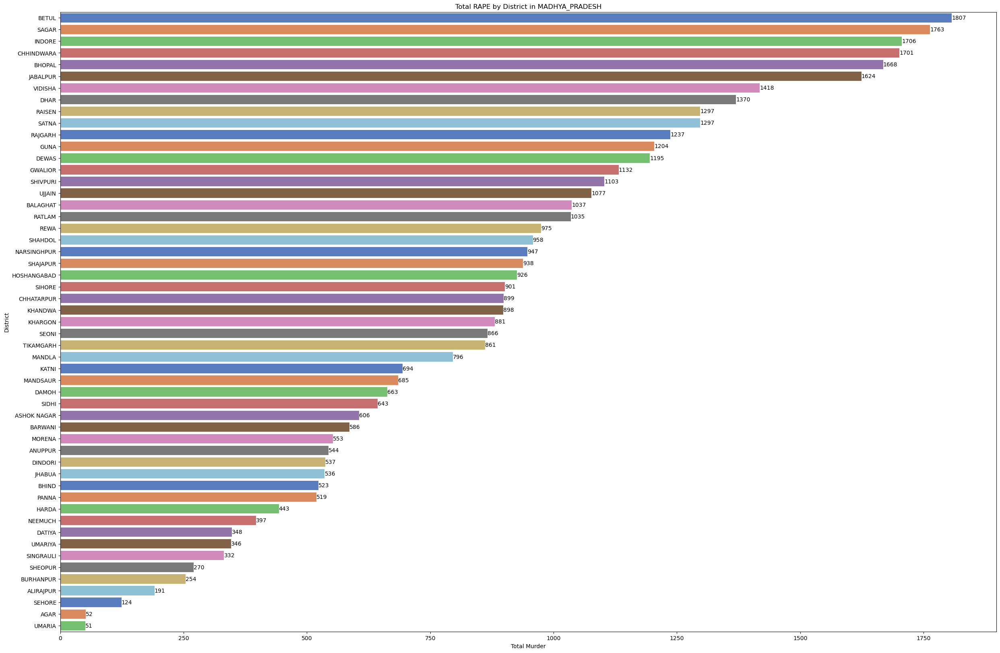


ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY
TOTAL ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY RATE IN 14 YEARS:- 598434
MADHYA_PRADESH: 97396 has maximun total Cases of ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY


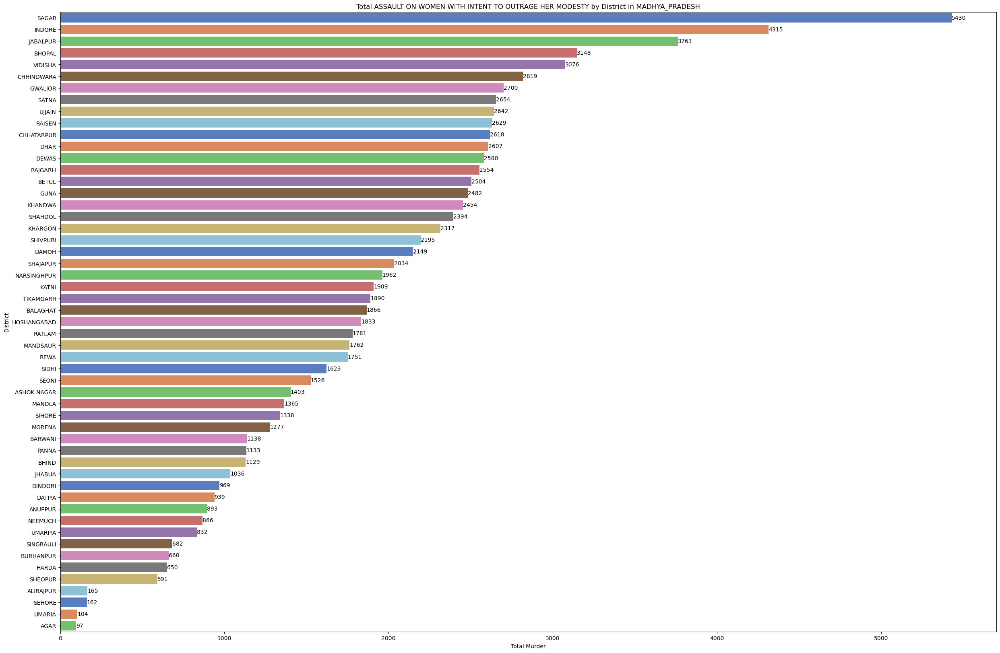


INSULT TO MODESTY OF WOMEN
TOTAL INSULT TO MODESTY OF WOMEN RATE IN 14 YEARS:- 144943
ANDHRA_PRADESH: 44573 has maximun total Cases of INSULT TO MODESTY OF WOMEN


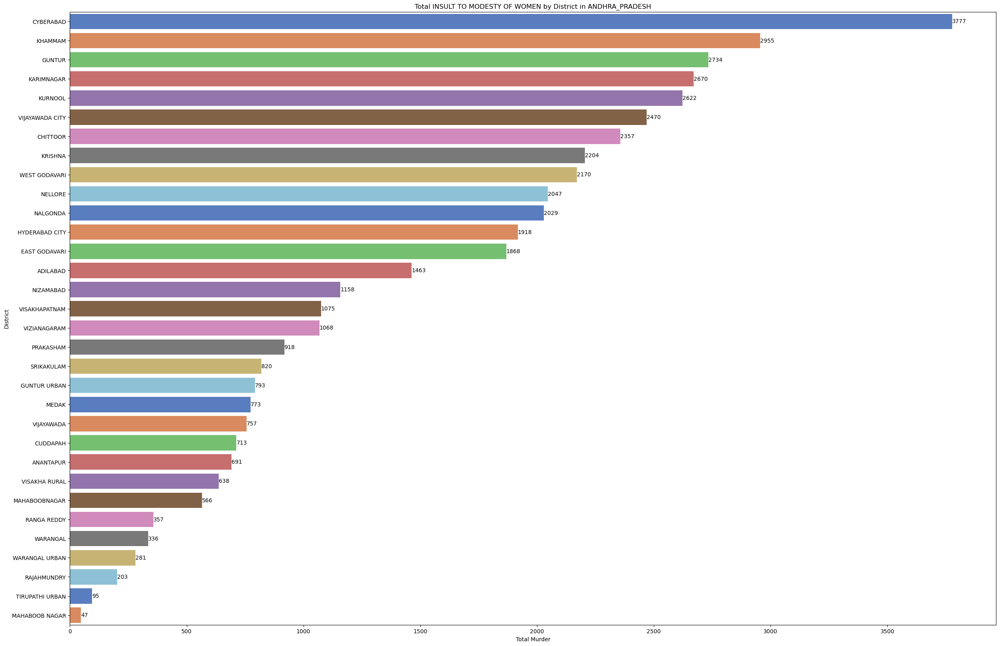


IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES
TOTAL IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES RATE IN 14 YEARS:- 936
BIHAR: 452 has maximun total Cases of IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES


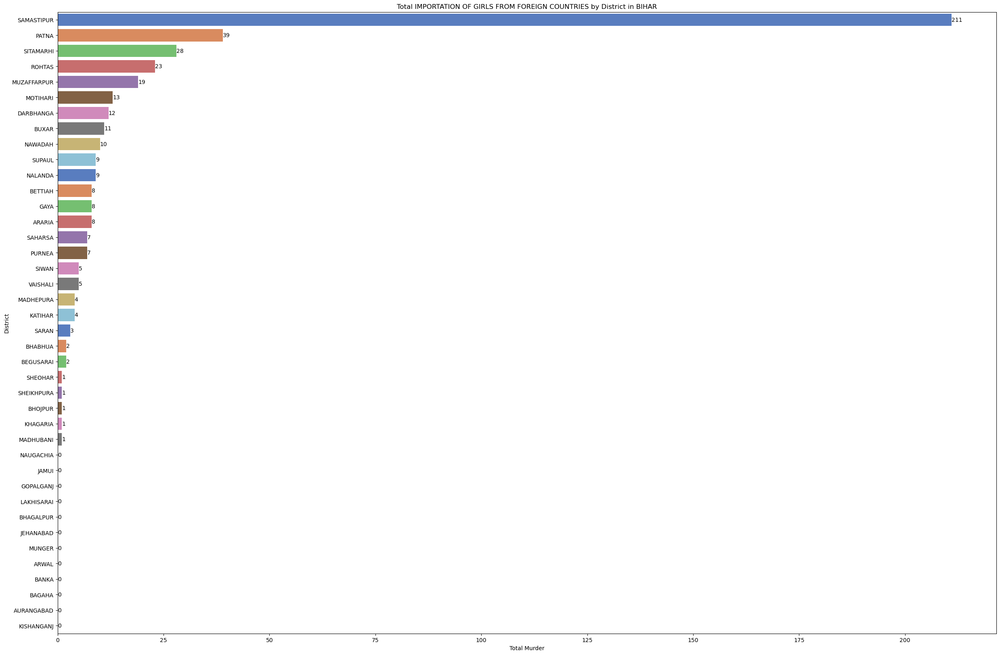

In [217]:
CrimeMaxfun('VIOLENT CRIME',Violent_Crime)
CrimeMaxfun('PROPERTY CRIME',Property_Crimes)
CrimeMaxfun('SOCIAL OFFENSES',Social_Offenses)
CrimeMaxfun('CRIMES AGAINST WOMEN',Crimes_Against_Women)

##### Comparison between category crime over the years

In [218]:
def Linechart(Category,dataset,title):
    totaldataframe=pd.DataFrame(columns=['YEAR'])
    for crime in Category:
        totalcrime=dataset.groupby('YEAR')[crime].sum().reset_index()
        totaldataframe =pd.merge(totaldataframe, totalcrime, on=['YEAR'], how='outer')
    #print(totaldataframe)
    melted_data = pd.melt(totaldataframe, id_vars=['YEAR'], value_vars=Category, var_name='Crime', value_name='Count')
    plt.figure(figsize=(20,6))
    sns.lineplot(x='YEAR', y='Count', hue='Crime', data=melted_data)
    plt.xlabel('Year')
    plt.ylabel('Count')
    plt.title(title)
    plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1))
    plt.show()

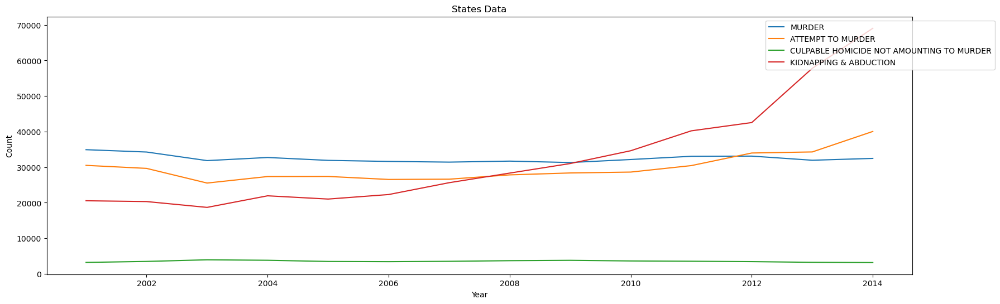

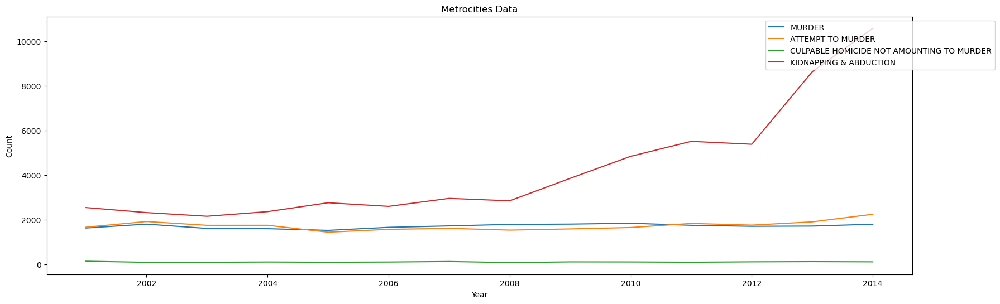

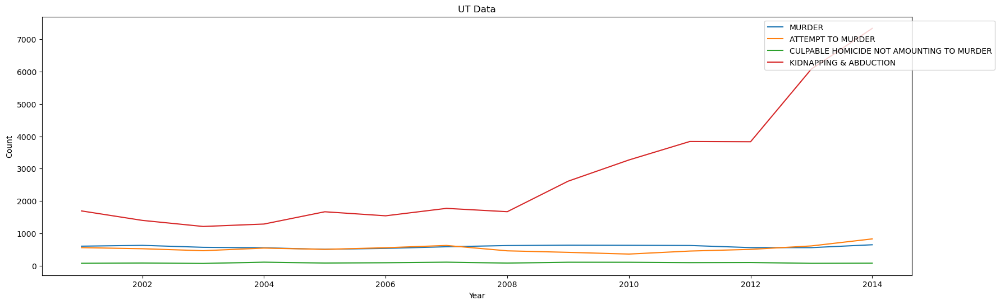

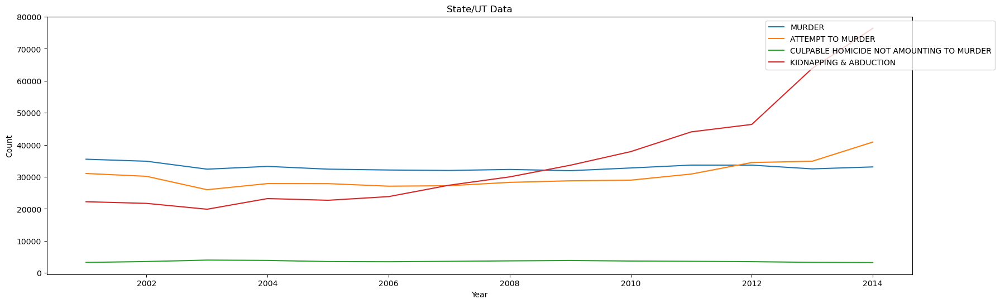

In [219]:
Linechart(Violent_Crime,sdata,'States Data')
Linechart(Violent_Crime,MetroCities,'Metrocities Data')
Linechart(Violent_Crime,udata,'UT Data')
Linechart(Violent_Crime,data,'State/UT Data')

In [220]:
cities = ['ADILABAD', 'ANANTAPUR', 'CHITTOOR', 'CUDDAPAH', 'EAST GODAVARI', 'GUNTUR', 'HYDERABAD CITY', 'KARIMNAGAR', 
          'KHAMMAM', 'KRISHNA', 'KURNOOL', 'MAHABOOBNAGAR', 'MEDAK', 'NALGONDA', 'NELLORE', 'NIZAMABAD', 'PRAKASHAM', 
          'RANGA REDDY', 'SRIKAKULAM', 'VIJAYAWADA', 'VISAKHA RURAL', 'VISAKHAPATNAM', 'VIZIANAGARAM', 'WARANGAL', 
          'WEST GODAVARI', 'CHANGLANG', 'DIBANG VALLEY', 'KAMENG EAST', 'KAMENG WEST', 'LOHIT', 'PAPUM PARE', 'SIANG EAST', 
          'SIANG UPPER', 'SIANG WEST', 'SUBANSIRI LOWER', 'SUBANSIRI UPPER', 'TAWANG', 'TIRAP', 'BARPETA', 'BONGAIGAON', 
          'CACHAR', 'DARRANG', 'DHEMAJI', 'DHUBRI', 'DIBRUGARH', 'GOALPARA', 'GOLAGHAT', 'GUWAHATI CITY', 'HAILAKANDI', 
          'JORHAT', 'KAMRUP', 'KARBI ANGLONG', 'KARIMGANJ', 'KOKRAJHAR', 'LAKHIMPUR', 'MORIGAON', 'N.C.HILLS', 'NAGAON', 
          'NALBARI', 'SIBSAGAR', 'SONITPUR', 'TINSUKIA', 'ARARIA', 'ARWAL', 'AURANGABAD', 'BAGAHA', 'BANKA', 'BEGUSARAI',
          'BETTIAH', 'BHABHUA', 'BHAGALPUR', 'BHOJPUR', 'BUXAR', 'DARBHANGA', 'GAYA', 'GOPALGANJ', 'JAMUI', 'JEHANABAD', 
          'KATIHAR', 'KHAGARIA', 'KISHANGANJ', 'LAKHISARAI', 'MADHEPURA', 'MADHUBANI', 'MOTIHARI', 'MUNGER', 'MUZAFFARPUR', 
          'NALANDA', 'NAUGACHIA', 'NAWADAH', 'PATNA', 'PURNEA', 'ROHTAS', 'SAHARSA', 'SAMASTIPUR', 'SARAN', 'SHEIKHPURA', 
          'SHEOHAR', 'SITAMARHI', 'SIWAN', 'SUPAUL', 'VAISHALI', 'BALRAMPUR', 'BILASPUR', 'BIZAPUR', 'DANTEWARA', 'DHAMTARI', 
          'DURG', 'JAGDALPUR', 'JANJGIR', 'JASHPUR', 'KANKER', 'KAWARDHA', 'KORBA', 'KORIYA', 'MAHASAMUND', 'RAIGARH', 
          'RAIPUR', 'RAJNANDGAON', 'SARGUJA', 'NORTH GOA', 'SOUTH GOA', 'AHMEDABAD COMMR.', 'AHMEDABAD RURAL', 'AHWA-DANG', 
          'AMRELI', 'ANAND', 'BHARUCH', 'BHAVNAGAR', 'DAHOD', 'GANDHINAGAR', 'HIMATNAGAR', 'JAMNAGAR', 'JUNAGADH', 
          'KHEDA NORTH', 'KUTCH', 'MEHSANA', 'NARMADA', 'NAVSARI', 'PALANPUR', 'PANCHMAHAL', 'PATAN', 'PORBANDAR', 
          'RAJKOT COMMR.', 'RAJKOT RURAL', 'SURAT COMMR.', 'SURAT RURAL', 'SURENDRAN']

In [221]:
def MetroCitiesCategoricalCrimeDonut(text,CategoryCrime):
    #DT=dataset
    grandtotal=0
    #plt.figure(figsize=(8,8))
    #fig, ax = plt.subplots()
    Crime=[]
    total=0
    for crime in CategoryCrime:
        plt.figure(figsize=(8,8))
        for year in range(2001,2015,1):
            totalcrime=MetroCities[MetroCities['YEAR']==year][crime].sum()
            #print(crime+'-'+str(totalcrime))
            total=totalcrime+total
        grandtotal=total+grandtotal  
        Crime.append(grandtotal)
        #totalcrime = MetroCities.groupby('DISTRICT')['MURDER'].sum()
    print(grandtotal)
    plt.figure(figsize=(8,8))
    plt.pie(Crime,labels=CategoryCrime, labeldistance=1.05,pctdistance=0.8, rotatelabels=0 ,textprops={'fontsize':9},
               autopct='%1.1f%%', radius=1, wedgeprops=dict(width=1, edgecolor='w'))
    plt.pie([5], radius=0.7, colors='w')
    plt.legend(CategoryCrime,bbox_to_anchor=(1.2, 0.5), loc='center left')
    plt.title(text)
    

231975
1480514
733321
222363


<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

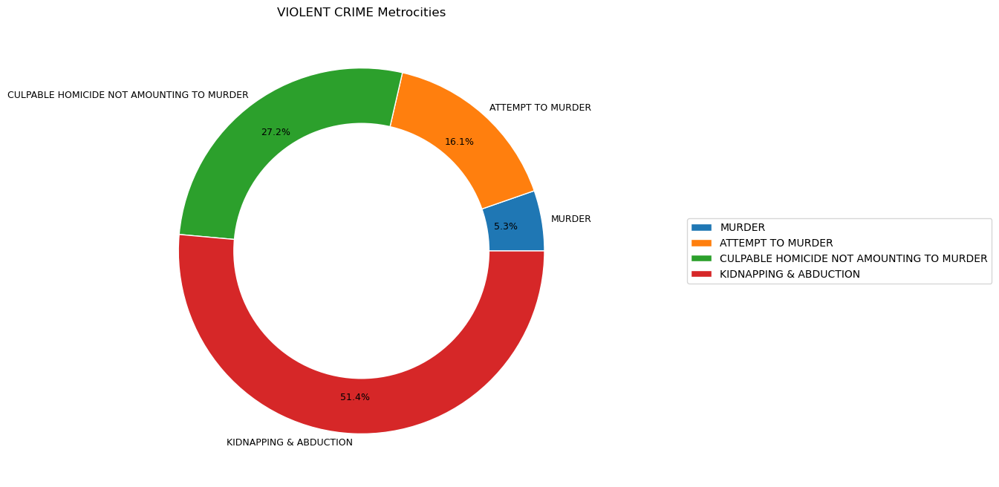

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

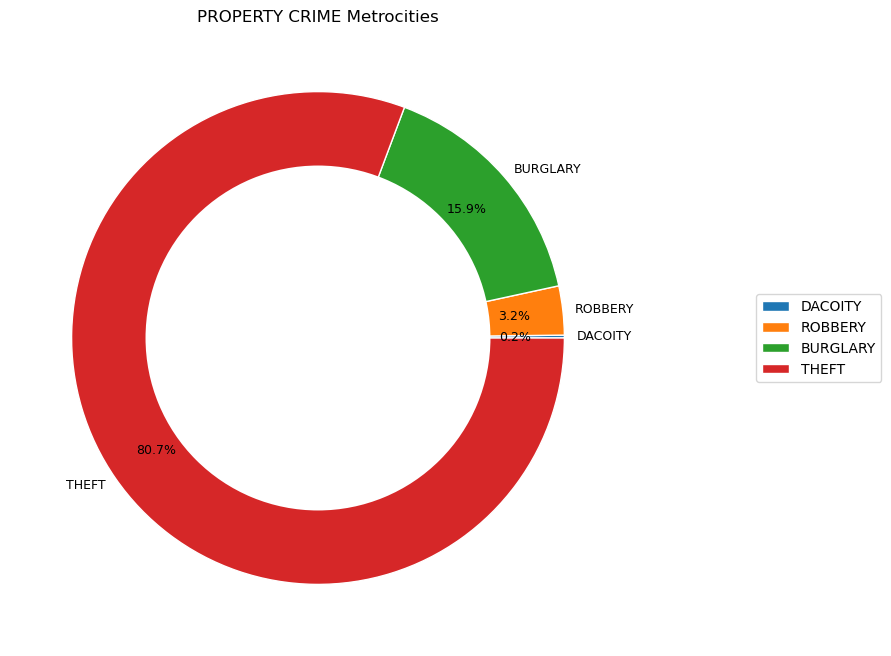

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

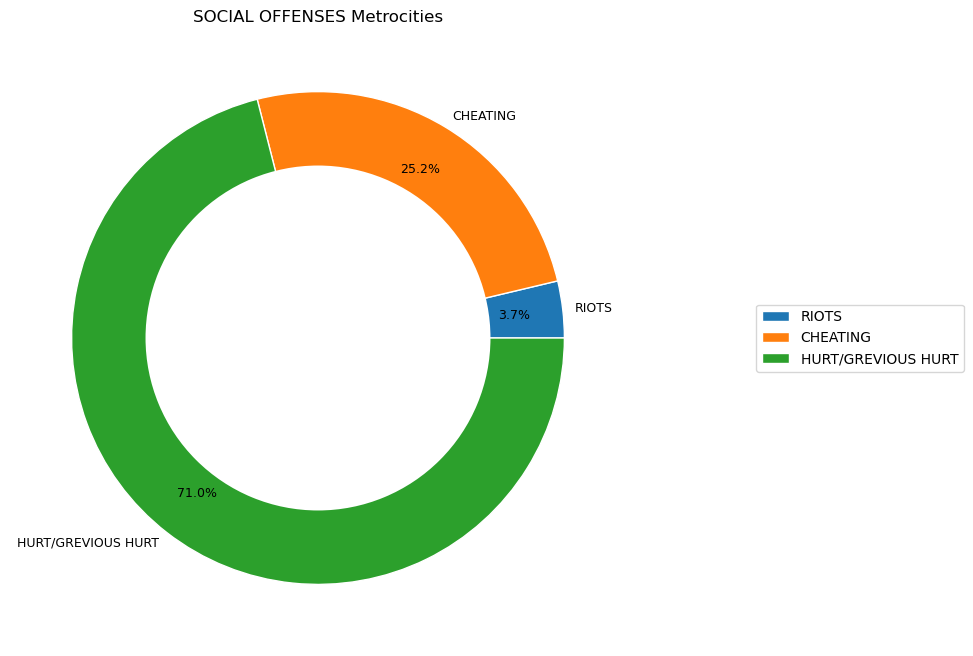

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

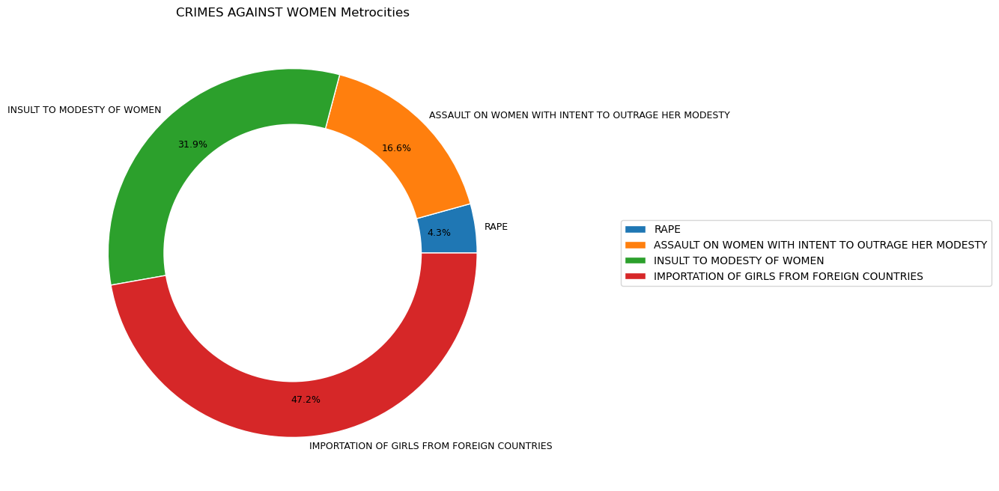

In [222]:
MetroCitiesCategoricalCrimeDonut('VIOLENT CRIME Metrocities',Violent_Crime)
MetroCitiesCategoricalCrimeDonut('PROPERTY CRIME Metrocities',Property_Crimes)
MetroCitiesCategoricalCrimeDonut('SOCIAL OFFENSES Metrocities',Social_Offenses)
MetroCitiesCategoricalCrimeDonut('CRIMES AGAINST WOMEN Metrocities',Crimes_Against_Women)

In [223]:
def MetroCitiesCrime(text,CategoryCrime): 
    print('\n\033[91m\033[1m'+'                                       '+text+'\033[0m')
    for crime in CategoryCrime:    
        totalcrime = MetroCities.groupby('DISTRICT')[crime].sum()
        plt.figure(figsize=(7.5,7.5))
        #explode = (0.01,0.1,0.1,0.1,0.1,0.01,0.1,0.1,0.1,0.01,0.1,0.1,0.1,0.01,0.1,0.1,0.1,0.1,0.1,0.1,0.1)
        plt.pie(totalcrime, labels=totalcrime.index, autopct='%1.1f%%',labeldistance=0.55 ,pctdistance=1.06, textprops={'fontsize':6.5 }, startangle=135, rotatelabels=1)
        plt.title('DISTRIBUTION OF '+ crime,fontsize=10)
        plt.legend(totalcrime.index,bbox_to_anchor=(1.2, 0.5), loc='center left')
        plt.xticks(rotation=30)
        plt.show()


                                       VIOLENT CRIME


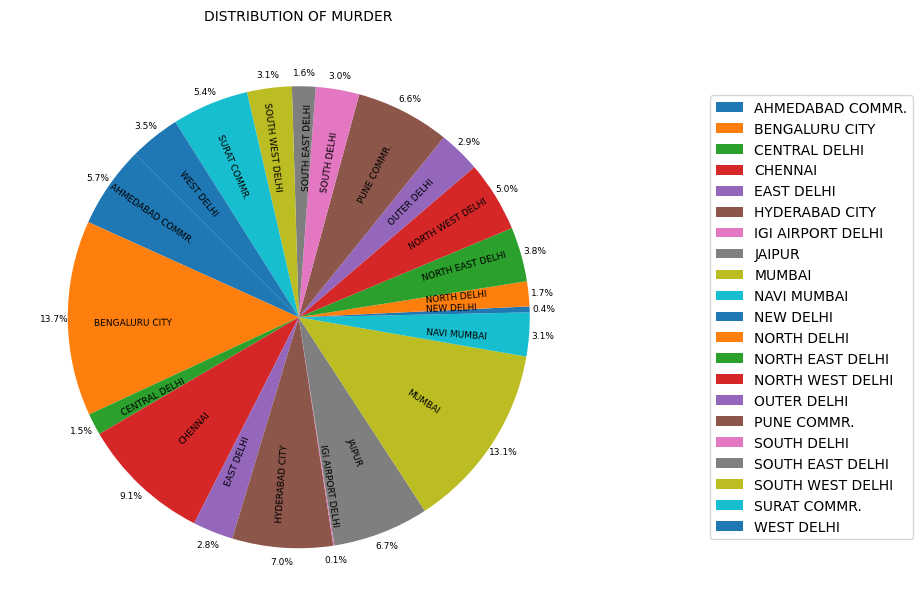

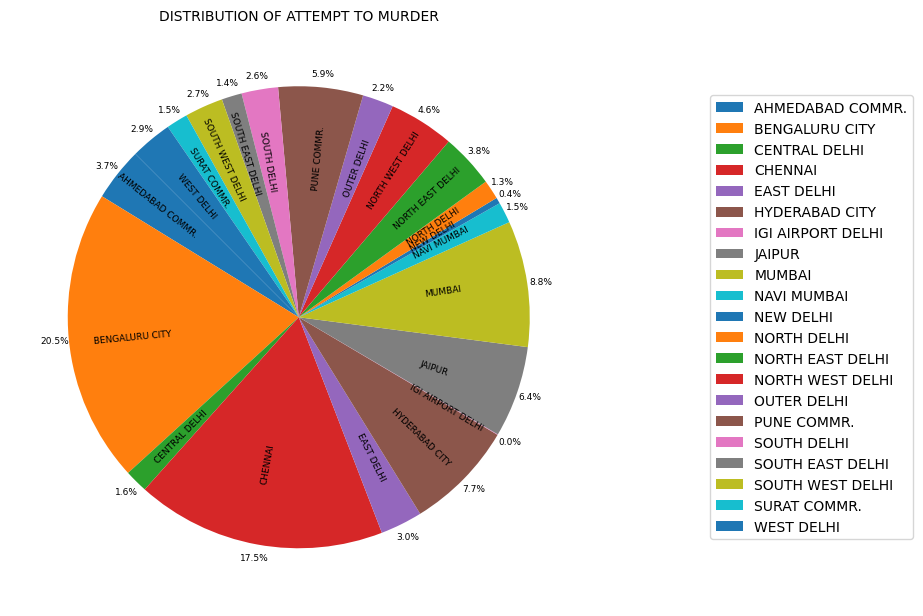

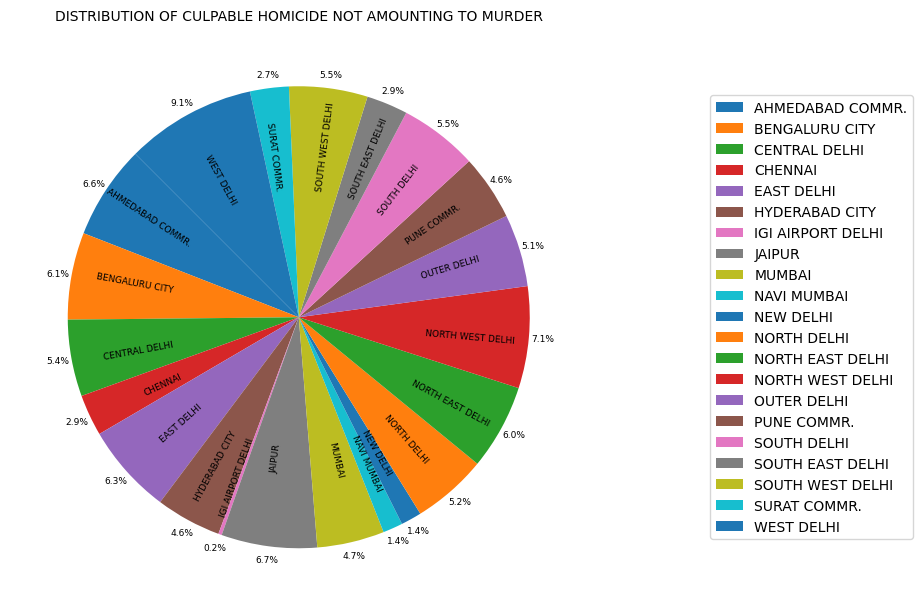

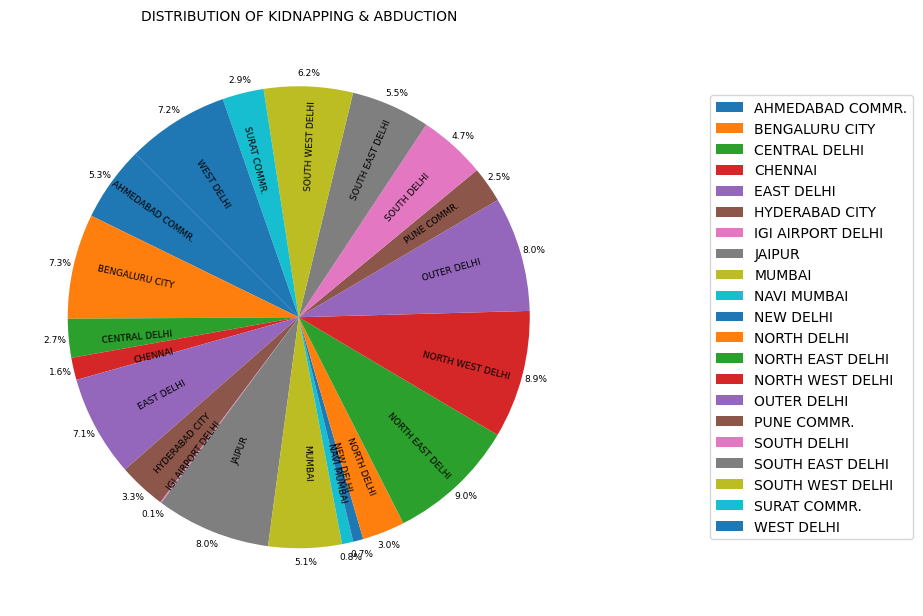


                                       PROPERTY CRIME


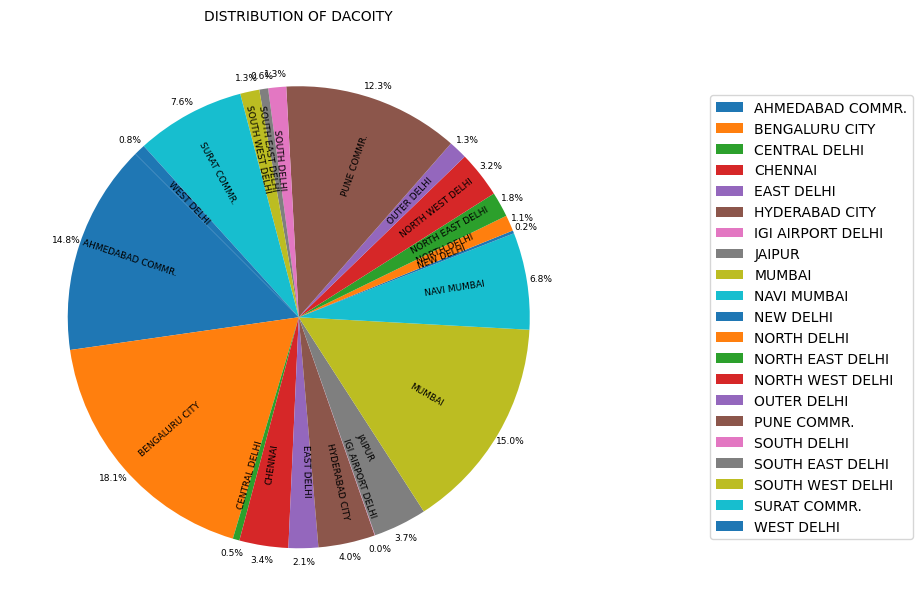

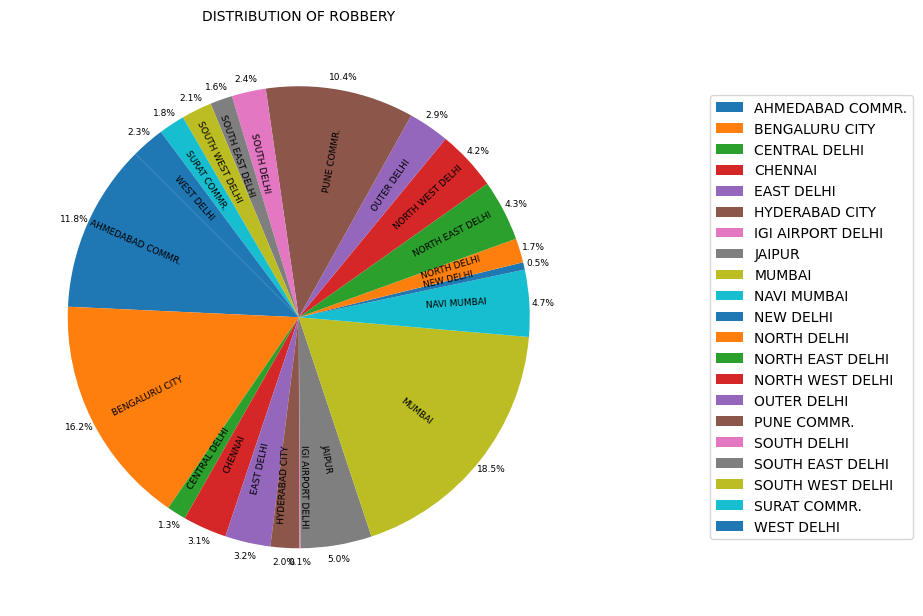

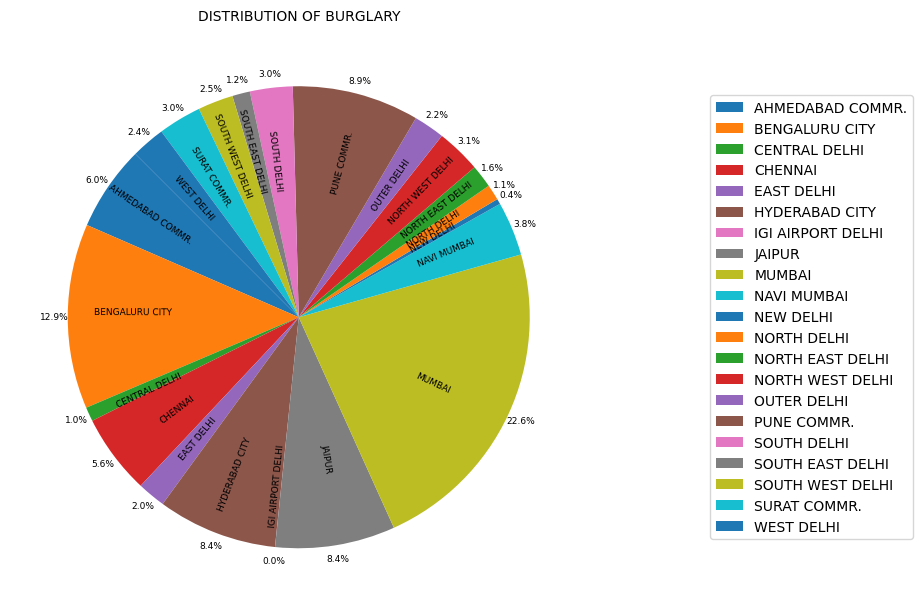

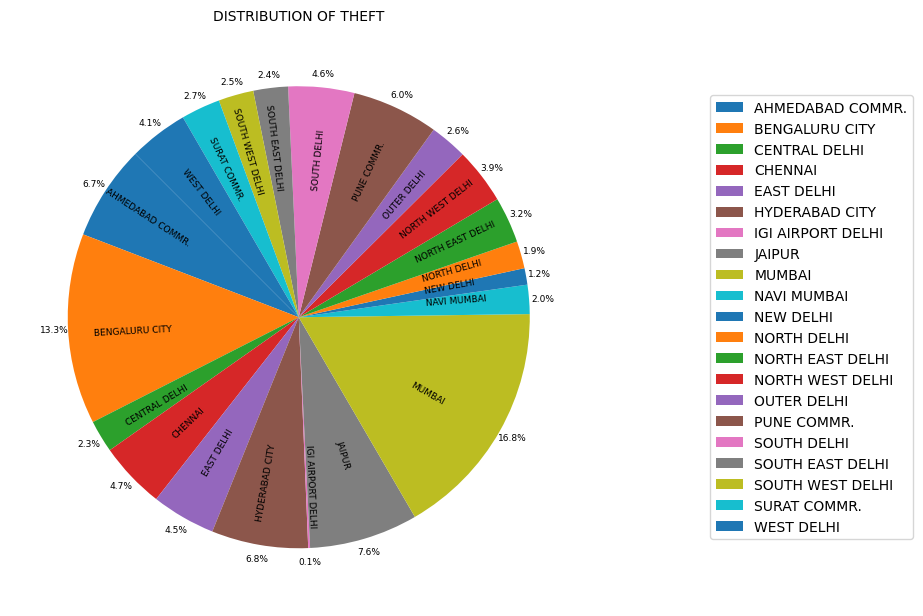


                                       SOCIAL OFFENSES


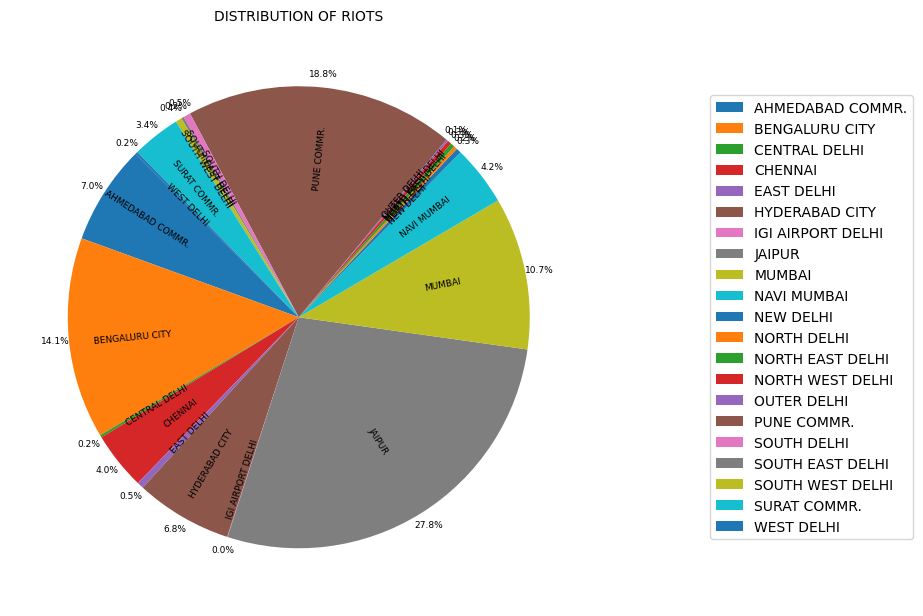

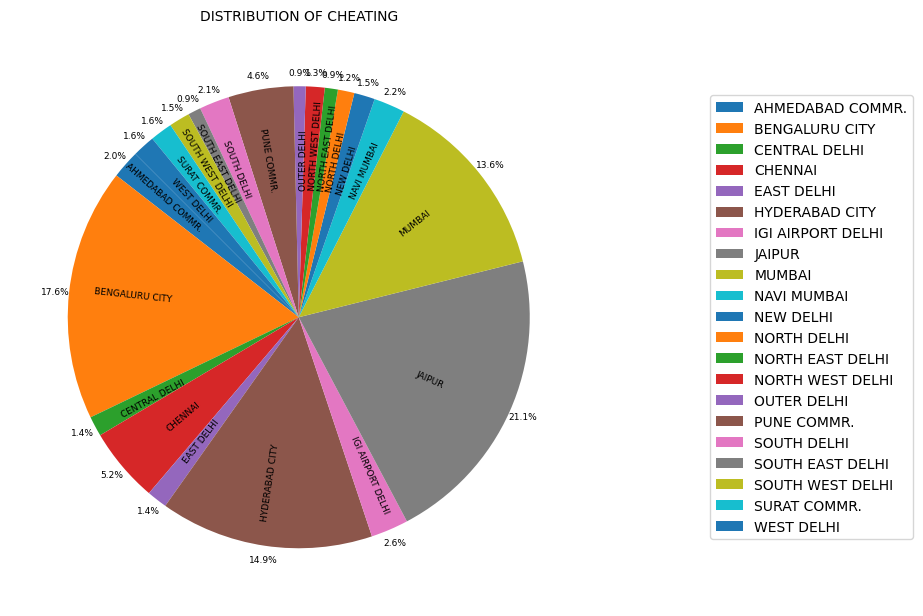

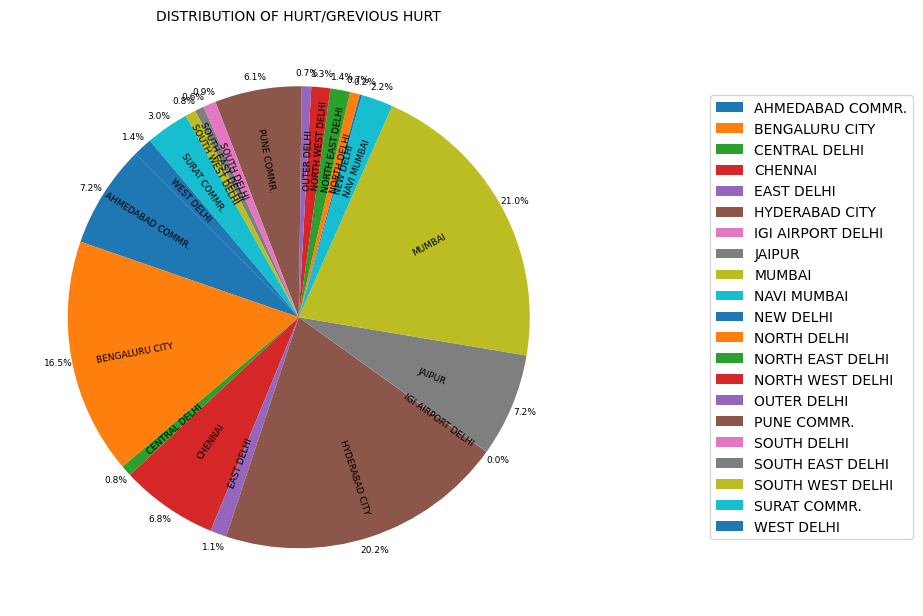


                                       CRIMES AGAINST WOMEN


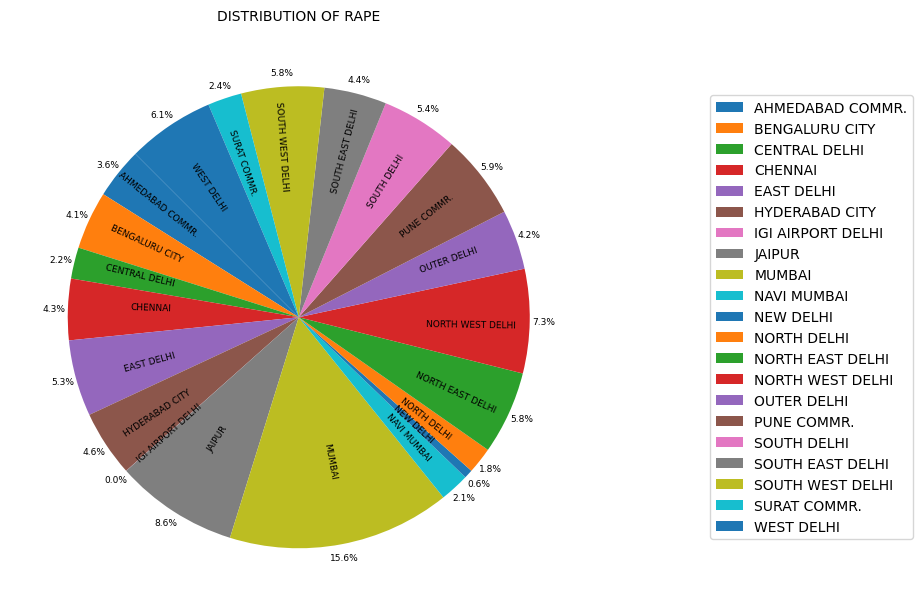

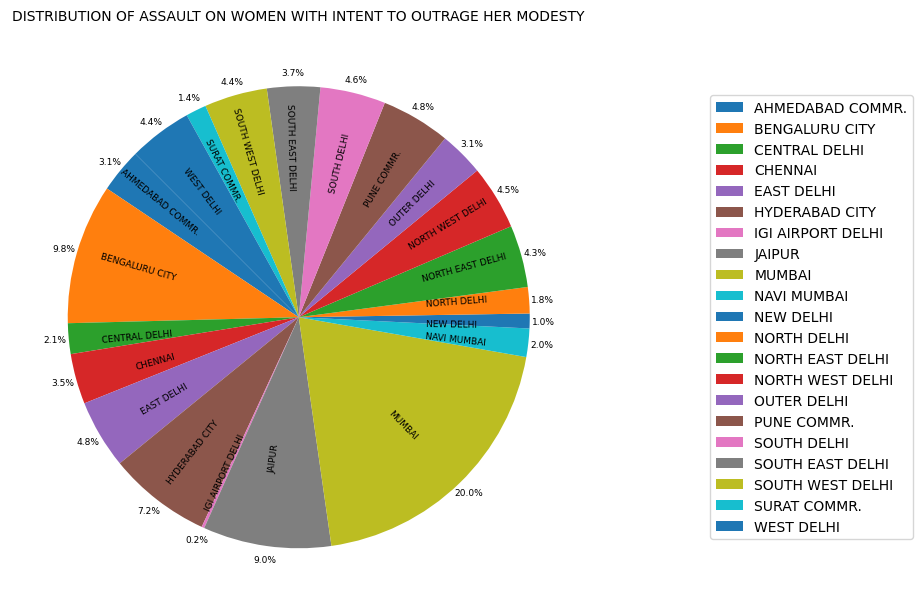

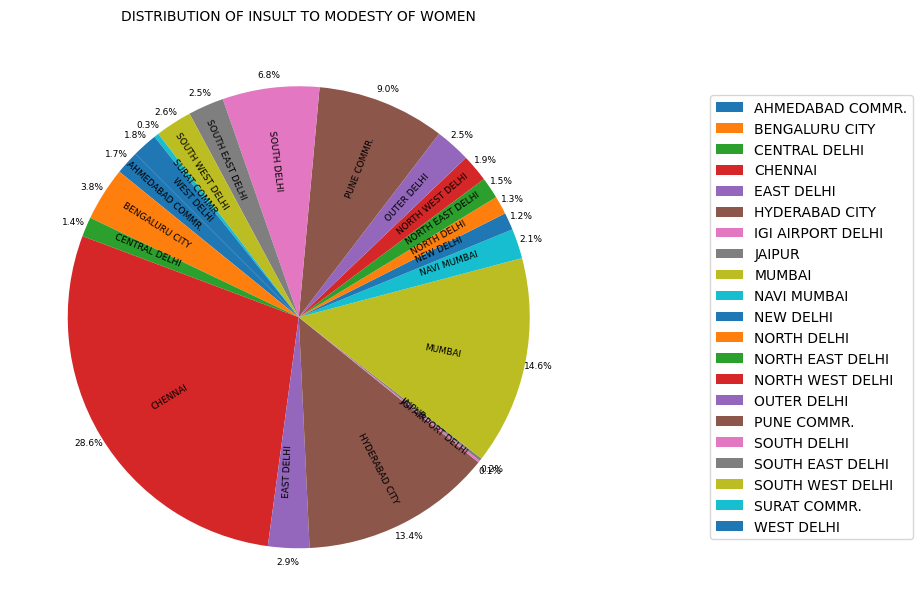

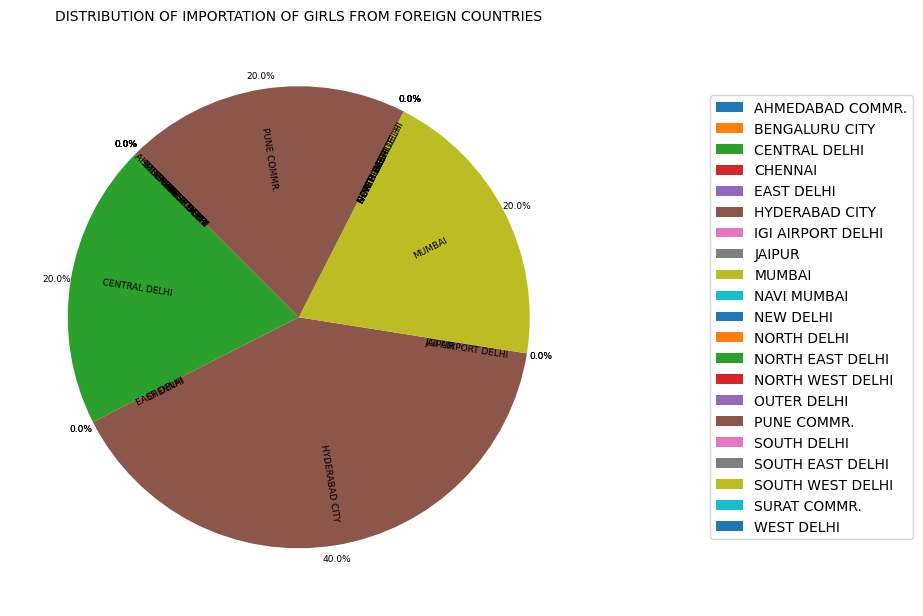

In [224]:
MetroCitiesCrime('VIOLENT CRIME',Violent_Crime)
MetroCitiesCrime('PROPERTY CRIME',Property_Crimes)
MetroCitiesCrime('SOCIAL OFFENSES',Social_Offenses)
MetroCitiesCrime('CRIMES AGAINST WOMEN',Crimes_Against_Women)

# MODEL SELECTION

In [225]:
catdf=pd.DataFrame()
catdf=df

In [226]:
catdf.head()

,STATE/UT CLASSIFICATION,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,KIDNAPPING & ABDUCTION,DACOITY,ROBBERY,BURGLARY,THEFT,RIOTS,CHEATING,HURT/GREVIOUS HURT,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES
3,STATE,JAMMU_&_KASHMIR,KARGIL,2001,0,0,0,0,2,0,0,2,6,5,0,1,1,0,0
5,STATE,NAGALAND,PEREN,2001,0,2,0,0,0,0,1,9,4,0,1,0,0,0,0
7,UT,ANDAMAN_AND_NICOBAR_ISLANDS,NICOBAR,2001,0,0,0,0,0,0,0,2,0,0,0,5,1,0,0
10,STATE,ARUNACHAL_PRADESH,SIANG UPPER,2002,0,1,0,3,0,0,1,9,7,0,0,0,0,0,0
11,STATE,ARUNACHAL_PRADESH,TAWANG,2002,0,0,1,1,0,0,0,3,13,1,1,2,0,1,0


In [227]:
catdf.shape

(9351, 19)

CrimeMeanfun('VIOLENT CRIME',Violent_Crime)
CrimeMeanfun('PROPERTY CRIME',Property_Crimes)
CrimeMeanfun('SOCIAL OFFENSES',Social_Offenses)
CrimeMeanfun('CRIMES AGAINST WOMEN',Crimes_Against_Women)

In [228]:
Property_Crimes

['DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT']

In [229]:
catdf['Crime_Rate']=((catdf['MURDER']+catdf['ATTEMPT TO MURDER']+catdf['CULPABLE HOMICIDE NOT AMOUNTING TO MURDER']+catdf['KIDNAPPING & ABDUCTION'])*0.5)
+((catdf['DACOITY']+catdf['ROBBERY']+catdf['BURGLARY']+catdf['THEFT'])*0.2)
+((catdf['RIOTS']+catdf['CHEATING']+catdf['HURT/GREVIOUS HURT'])*0.3)+((catdf['RAPE']
+catdf['ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY']+catdf['INSULT TO MODESTY OF WOMEN']+catdf['IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'])*0.4)

3          2.2
5          0.3
7          1.9
10         1.2
11         2.0
         ...  
10425    402.5
10427    348.1
10431    414.4
10434    409.1
10441    410.6
Length: 9351, dtype: float64

In [230]:
catdf=catdf.drop(columns=NumericalCrimeFeature)

In [231]:
catdf.describe()

,YEAR,Crime_Rate
count,9351.000000,9351.000000
mean,2007.641108,76.511282
std,4.034975,75.419470
min,2001.000000,0.000000
25%,2004.000000,31.000000
50%,2008.000000,56.500000
75%,2011.000000,98.500000
max,2014.000000,1512.500000


In [232]:
#198-outlier

{'whiskers': [<matplotlib.lines.Line2D at 0x218e794d010>,
 'caps': [<matplotlib.lines.Line2D at 0x218e794df50>,
 'boxes': [<matplotlib.lines.Line2D at 0x218eaad5cd0>],
 'medians': [<matplotlib.lines.Line2D at 0x218e7085250>],
 'fliers': [<matplotlib.lines.Line2D at 0x218e69a4650>],
 'means': []}

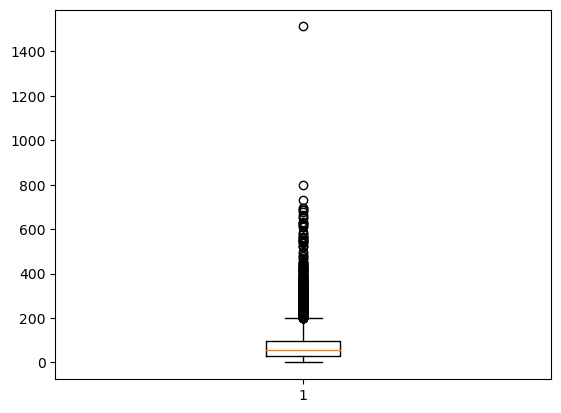

In [233]:
plt.boxplot(catdf['Crime_Rate'])

(array([8.34e+03, 8.41e+02, 1.28e+02, 2.40e+01, 1.60e+01, 1.00e+00,
        0.00e+00, 0.00e+00, 0.00e+00, 1.00e+00]),
 array([   0.  ,  151.25,  302.5 ,  453.75,  605.  ,  756.25,  907.5 ,
        1058.75, 1210.  , 1361.25, 1512.5 ]),
 <BarContainer object of 10 artists>)

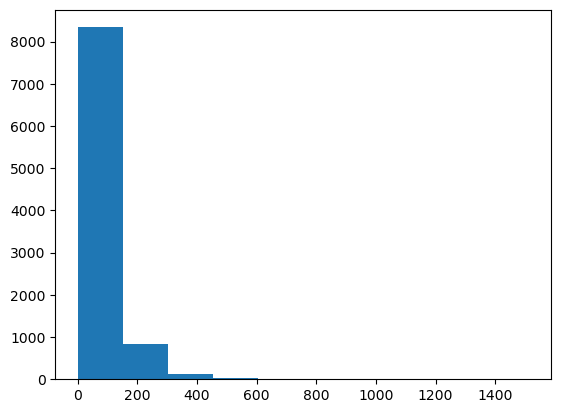

In [234]:
plt.hist(catdf['Crime_Rate'])

In [235]:
catdf=catdf[catdf['Crime_Rate']<198]

In [236]:
catdf[catdf['Crime_Rate']>=600]

,STATE/UT CLASSIFICATION,STATE/UT,DISTRICT,YEAR,Crime_Rate


### Feature Encoding 
DISTRICT-Nominal Categorical feature. it has 720 differents classes. we can not use on hot encoding because it will create  columns so we used ratget encoding 

YEAR = ordinal Categorical feature. here we use label encoding

STATE/UT CLASSIFICATION- binary encoding

STATE/UT-Nominal Categorical feature. here we used one hot encoding

In [237]:
#hierarchical_encoding-DISTRICT
hierarchical_encoding_District = catdf.groupby(['STATE/UT', 'DISTRICT'])['Crime_Rate'].mean().to_dict()
catdf['DISTRICT'] = catdf.apply(lambda row: hierarchical_encoding_District.get((row['STATE/UT'], row['DISTRICT'])), axis=1)

In [238]:
#Binary encoding -STATE/UT CLASSIFICATION,YEAR
label_encoder = LabelEncoder()
columns_to_encode = ['STATE/UT CLASSIFICATION','YEAR']
catdf[columns_to_encode] = catdf[columns_to_encode].apply(lambda x: label_encoder.fit_transform(x))


In [239]:
#one hot encoding - STATE/UT
catdf=pd.get_dummies(catdf, columns=['STATE/UT'],dtype=int)

In [240]:
catdf

,STATE/UT CLASSIFICATION,DISTRICT,YEAR,Crime_Rate,STATE/UT_ANDAMAN_AND_NICOBAR_ISLANDS,STATE/UT_ANDHRA_PRADESH,STATE/UT_ARUNACHAL_PRADESH,STATE/UT_ASSAM,STATE/UT_BIHAR,STATE/UT_CHANDIGARH,...,STATE/UT_ODISHA,STATE/UT_PUDUCHERRY,STATE/UT_PUNJAB,STATE/UT_RAJASTHAN,STATE/UT_SIKKIM,STATE/UT_TAMIL_NADU,STATE/UT_TRIPURA,STATE/UT_UTTARAKHAND,STATE/UT_UTTAR_PRADESH,STATE/UT_WEST_BENGAL
3,0,1.571429,0,1.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,3.428571,0,1.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0.807692,0,0.0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,2.142857,1,0.5,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0.785714,1,0.5,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10311,0,157.291667,2,195.5,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10314,0,178.692308,4,194.5,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10316,0,148.357143,8,189.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10349,0,163.583333,2,183.0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


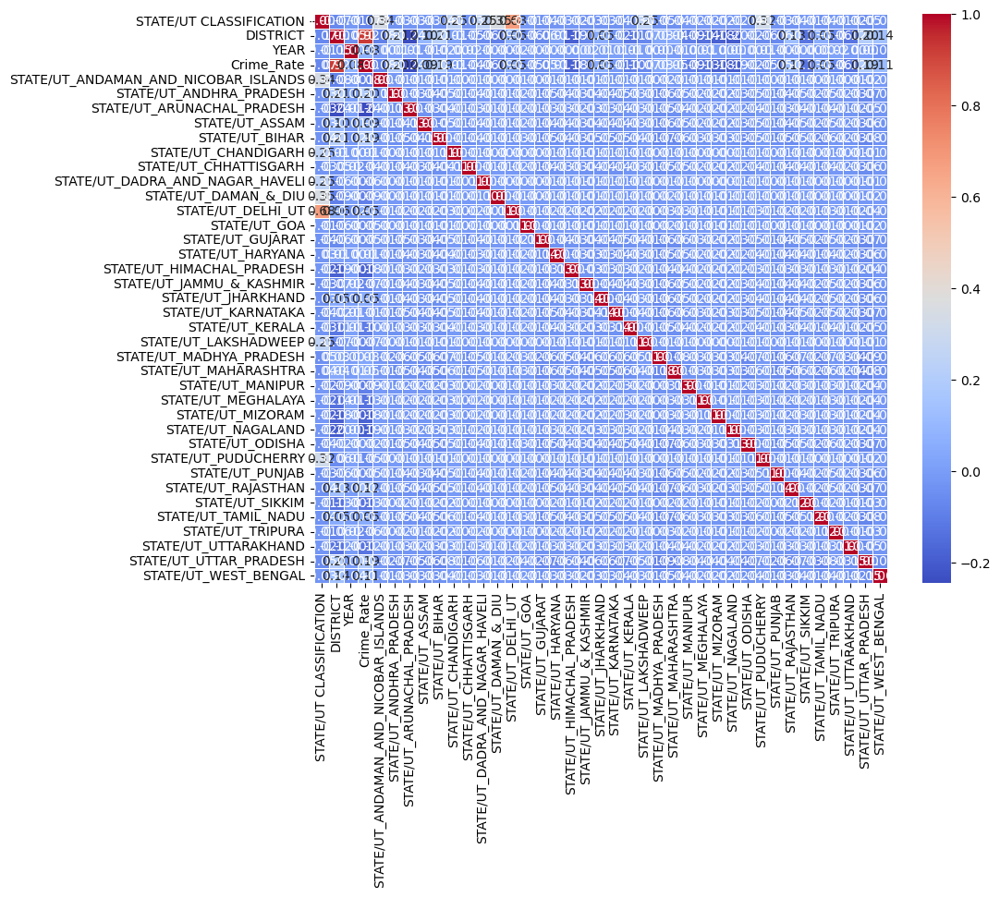

In [241]:
corr_matrix = catdf.corr(method='spearman')
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix,annot=True,cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.show()

## Model Selection
predictors-State/UT classification,state/ut name,district, and year

predicted-crime rate

we found this Classification regreesion problem here we have some ML algorithms 
1. Support vector regressor
2. KNeighborsRegressor
3. RandomForestRegressor
4. LinearRegression
5. NuralNetwork

will conclude bases on MAE, MSE, RMSE and R2 values of each model

Mae SVR: 11.76
mse SVR: 296.90
rmse SVR: 17.23
r2 SVR: 0.86

y_pred_SVR


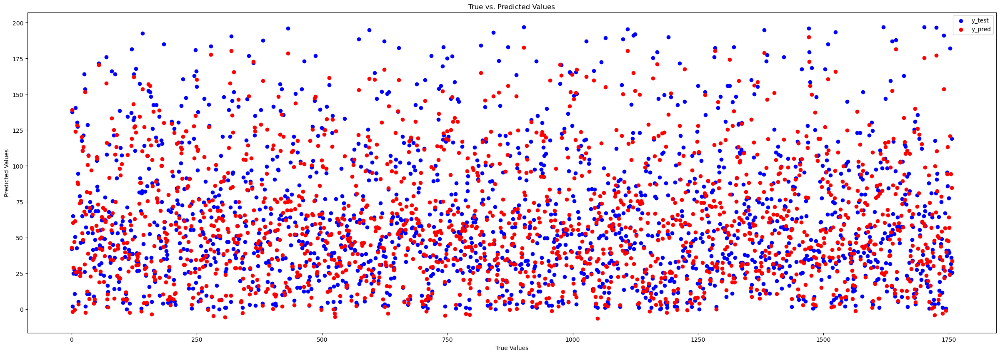

Mae KNN: 10.67
mse KNN: 253.60
rmse KNN: 15.92
r2 KNN: 0.88

y_pred_knn


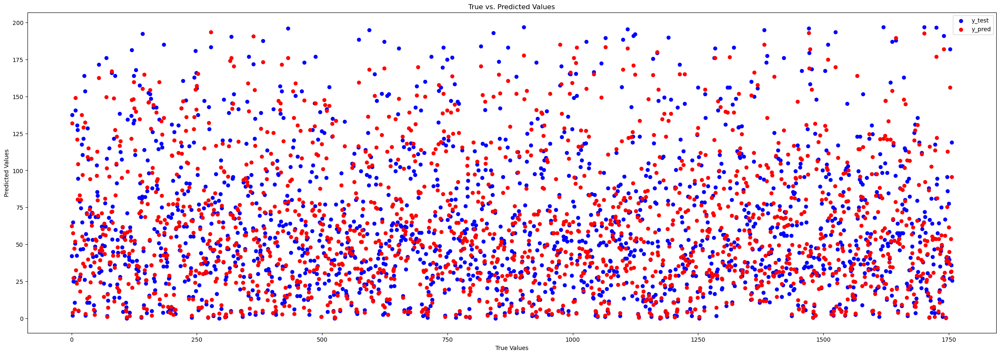

Mae rf_regressor: 9.76
mse rf_regressor: 215.53
rmse rf_regressor: 14.68
rmse rf_regressor: 0.90

y_pred_rf


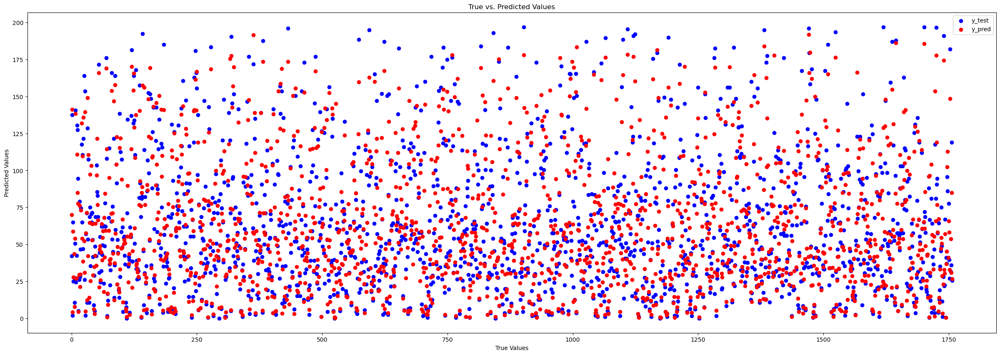

Mae LR : 11.98
mse LR: 285.41
rmse LR: 16.89
R2 LR: 0.86

y_pred_LR


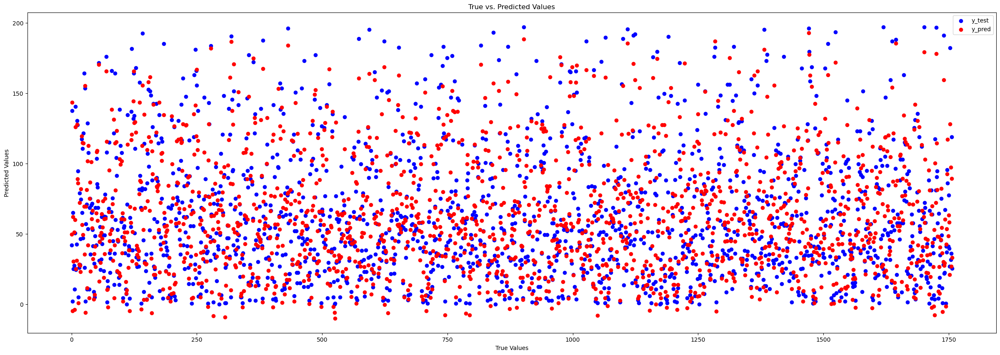

Epoch 1/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1477.9731 - val_loss: 382.1947
Epoch 2/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 329.6106 - val_loss: 375.1409
Epoch 3/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 319.6807 - val_loss: 344.5793
Epoch 4/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 309.6149 - val_loss: 329.9851
Epoch 5/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 293.5377 - val_loss: 346.6601
Epoch 6/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 300.5482 - val_loss: 341.6031
Epoch 7/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 290.9712 - val_loss: 316.8444
Epoch 8/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 296.8197 - val_loss: 326.2610
Epoch 9/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 297.4641 - val_loss: 303.8491
Epoch 10/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 301.0117 - val_loss: 306.6348
Epoch 11/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 284.6188 - val_loss: 306.8

198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 221.7975 - val_loss: 254.8022
Epoch 67/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 229.0437 - val_loss: 260.1504
Epoch 68/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 222.8481 - val_loss: 264.3032
Epoch 69/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 234.9246 - val_loss: 247.3135
Epoch 70/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 234.6535 - val_loss: 248.5105
Epoch 71/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 235.9651 - val_loss: 252.2763
Epoch 72/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 222.6275 - val_loss: 259.5073
Epoch 73/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253.8903 - val_loss: 249.4765
Epoch 74/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 230.6293 - val_loss: 264.3431
Epoch 75/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245.8113 - val_loss: 307.8254
Epoch 76/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 234.6986 - val_loss: 263.8692
E

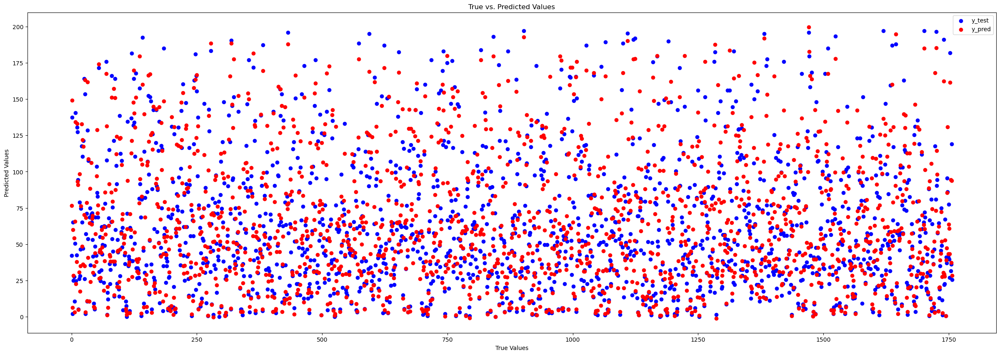

In [242]:
X=catdf.drop(columns=['Crime_Rate'])
y=catdf['Crime_Rate']
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.2,random_state=42)

#-----------------------------------------SVR---------------------------------------------------#

model_svr = SVR()
paramns={
    'kernel': ['linear', 'rbf', 'poly'],
}
model_svr_gs = GridSearchCV(model_svr, paramns, scoring='neg_mean_squared_error', cv=5)
model_svr_gs.fit(X_train,y_train)

y_pred_SVR = model_svr_gs.predict(X_test)
maesvr = mean_absolute_error(y_test, y_pred_SVR)
print(f'Mae SVR: {maesvr:.2f}')
msesvr = mean_squared_error(y_test, y_pred_SVR)
print(f'mse SVR: {msesvr:.2f}')
rmsesvr = mean_squared_error(y_test, y_pred_SVR, squared=False)
print(f'rmse SVR: {rmsesvr:.2f}')
r2svr = r2_score(y_test, y_pred_SVR)
print(f'r2 SVR: {r2svr:.2f}')
print()

print('y_pred_SVR')
plt.figure(figsize=[30,10])
plt.scatter(range(len(y_test)), y_test, color='blue', label='y_test')
plt.scatter(range(len(y_pred_SVR)), y_pred_SVR, color='red', label='y_pred')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs. Predicted Values')
plt.legend()
plt.show()


#-----------------------------------KNeighborsRegressor-----------------------------------------#
model_knn = KNeighborsRegressor()
n_neighbors = list(range(1, 16))
paramns = {  
    'leaf_size':[30, 60, 90],
    'n_neighbors':n_neighbors,
    'n_jobs': [-1]
}
model_knn_gs = GridSearchCV(model_knn, paramns, scoring='neg_mean_squared_error', cv=5)
model_knn_gs.fit(X_train,y_train)

y_pred_knn = model_knn_gs.predict(X_test)
maeknn = mean_absolute_error(y_test, y_pred_knn)
print(f'Mae KNN: {maeknn:.2f}')
mseknn = mean_squared_error(y_test, y_pred_knn)
print(f'mse KNN: {mseknn:.2f}')
rmseknn = mean_squared_error(y_test, y_pred_knn, squared=False)
print(f'rmse KNN: {rmseknn:.2f}')
r2knn = r2_score(y_test, y_pred_knn)
print(f'r2 KNN: {r2knn:.2f}')
print()

print('y_pred_knn')
plt.figure(figsize=[30,10])
plt.scatter(range(len(y_test)), y_test, color='blue', label='y_test')
plt.scatter(range(len(y_pred_knn)), y_pred_knn, color='red', label='y_pred')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs. Predicted Values')
plt.legend()
plt.show()



#--------------------------------------RandomForest----------------------------------------#

model_rf_regressor = RandomForestRegressor()
paramns={
    'random_state': [42,10,60],
    'n_estimators': [100,150],
}
model_rf_regressor_gs = GridSearchCV(model_rf_regressor, paramns, scoring='neg_mean_squared_error', cv=10)
model_rf_regressor_gs.fit(X_train,y_train)


y_pred_rf = model_rf_regressor_gs.predict(X_test)
maerf = mean_absolute_error(y_test, y_pred_rf)
print(f'Mae rf_regressor: {maerf:.2f}')
mserf = mean_squared_error(y_test, y_pred_rf)
print(f'mse rf_regressor: {mserf:.2f}')
rmserf = mean_squared_error(y_test, y_pred_rf,squared=False)
print(f'rmse rf_regressor: {rmserf:.2f}')
r2rf = r2_score(y_test, y_pred_rf)
print(f'rmse rf_regressor: {r2rf:.2f}')
print()

print('y_pred_rf')
plt.figure(figsize=[30,10])
plt.scatter(range(len(y_test)), y_test, color='blue', label='y_test')
plt.scatter(range(len(y_pred_rf)), y_pred_rf, color='red', label='y_pred')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs. Predicted Values')
plt.legend()
plt.show()


#--------------------------------------LinearRegression----------------------------------------#
model_lR = LinearRegression()

param_grid = {
    'fit_intercept': [True, False],
}
model_lR_gs = GridSearchCV(model_lR,param_grid, scoring='neg_mean_squared_error', cv=10)
model_lR_gs.fit(X_train,y_train)

y_pred_lr=model_lR_gs.predict(X_test)


maelr = mean_absolute_error(y_test, y_pred_lr)
print(f'Mae LR : {maelr:.2f}')
mselr = mean_squared_error(y_test, y_pred_lr)
print(f'mse LR: {mselr:.2f}')
rmselr = mean_squared_error(y_test, y_pred_lr,squared=False)
print(f'rmse LR: {rmselr:.2f}')
r2lr = r2_score(y_test, y_pred_lr)
print(f'R2 LR: {r2lr:.2f}')
print()

print('y_pred_LR')
plt.figure(figsize=[30,10])
plt.scatter(range(len(y_test)), y_test, color='blue', label='y_test')
plt.scatter(range(len(y_pred_lr)), y_pred_lr, color='red', label='y_pred')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs. Predicted Values')
plt.legend()
plt.show()



#--------------------------------------NuralNetwork----------------------------------------#
model_NN = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='elu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(1)  # Output layer with 1 neuron for regression
])
model_NN.compile(optimizer='adam', loss='mean_squared_error')
model_NN.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1, verbose=1)
pred_NN= model_NN.predict(X_test)

MAE=mean_absolute_error(y_test,pred_NN)
print('Mae: ',MAE)
MSE=mean_squared_error(y_test,pred_NN)
print('Mse: ',MSE)
rmsenn = mean_squared_error(y_test, pred_NN,squared=False)
print(f'rmse NN: {rmsenn:.2f}')
r2nn = r2_score(y_test, pred_NN)
print(f'R2 NN: {r2nn:.2f}')


print('y_pred_NN')
plt.figure(figsize=[30,10])
plt.scatter(range(len(y_test)), y_test, color='blue', label='y_test')
plt.scatter(range(len(pred_NN)), pred_NN, color='red', label='y_pred')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs. Predicted Values')
plt.legend()
plt.show()


Based on the evaluation metrics provided, here's a summary of the performance of each model:

###### Support Vector Regressor (SVR):

``Mean Absolute Error (MAE): 11.76``

``Mean Squared Error (MSE): 296.90``

``Root Mean Squared Error (RMSE): 17.23``

``R-squared (R2): 0.86``


###### K-Nearest Neighbors (KNN) Regressor:

`Mae KNN: 10.67`

`mse KNN: 253.60`

`rmse KNN: 15.92`

`r2 KNN: 0.88`


##### Random Forest Regressor:

`Mae rf_regressor: 9.76`

`mse rf_regressor: 215.53`

`rmse rf_regressor: 14.68`

`rmse rf_regressor: 0.90`



##### Linear Regression (LR):

`Mae LR : 11.98`

`mse LR: 285.41`

`rmse LR: 16.89`

`R2 LR: 0.86`

###### Neural Network (NN):

`Mae:  10.591938432793432`

`Mse:  235.8002860487319`

`rmse NN: 15.36`

`R2 NN: 0.89`



### Observations:

Random Forest (RF) and Neural Network (NN) models outperform the other models in terms of all evaluation metrics.
RF has slightly lower MAE, MSE, and RMSE compared to NN, indicating better performance in terms of prediction accuracy.
However, NN has a slightly higher R2 value compared to RF, suggesting that NN explains a greater proportion of the variance in the target variable.
Considering both prediction accuracy and explanatory power, NN appears to be the better model among the two.

### Conclusion:
Based on the evaluation results, while Random Forest (RF) shows good predictive performance, Neural Network (NN) emerges as the preferred model due to its slightly higher R2 value, indicating better explanatory power. Therefore, for this particular problem, Neural Network would be the recommended choice for predicting crime rates.







# Final Selected Model- Neural Networks

In [243]:
 catdf.describe()

,STATE/UT CLASSIFICATION,DISTRICT,YEAR,Crime_Rate,STATE/UT_ANDAMAN_AND_NICOBAR_ISLANDS,STATE/UT_ANDHRA_PRADESH,STATE/UT_ARUNACHAL_PRADESH,STATE/UT_ASSAM,STATE/UT_BIHAR,STATE/UT_CHANDIGARH,...,STATE/UT_ODISHA,STATE/UT_PUDUCHERRY,STATE/UT_PUNJAB,STATE/UT_RAJASTHAN,STATE/UT_SIKKIM,STATE/UT_TAMIL_NADU,STATE/UT_TRIPURA,STATE/UT_UTTARAKHAND,STATE/UT_UTTAR_PRADESH,STATE/UT_WEST_BENGAL
count,8790.000000,8790.000000,8790.000000,8790.000000,8790.000000,8790.000000,8790.00000,8790.000000,8790.000000,8790.000000,...,8790.000000,8790.000000,8790.000000,8790.000000,8790.000000,8790.000000,8790.000000,8790.000000,8790.000000,8790.000000
mean,0.025597,62.573834,6.545734,62.573834,0.003072,0.040387,0.02446,0.038453,0.053356,0.001593,...,0.050626,0.002617,0.036860,0.048464,0.006371,0.054608,0.007736,0.020478,0.092833,0.024573
std,0.157940,40.296794,4.002490,44.392495,0.055341,0.196876,0.15448,0.192298,0.224755,0.039879,...,0.219245,0.051089,0.188429,0.214757,0.079568,0.227225,0.087619,0.141636,0.290214,0.154830
min,0.000000,0.357143,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,32.607143,3.000000,29.500000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,56.821429,7.000000,53.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,88.500000,10.000000,88.500000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,195.000000,13.000000,197.500000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000



based on Final Crime persentile we have created threshold for low, medium, high crime

25% -29.000000

75% -88.500000

below 29 - LOW CRIME RATE

below 88.50 & above 29 - MEDIUM CRIME RATE

above 88.50 - HIGH CRIME RATE

## Model Implementation using ipwidgets

In [244]:
def StateUT(SU):
    if 'UT'in SU:
        return 1
    else:
        return 0
    
def Year(yr):
    return (yr-2001)

def StateEncoder(stateName):
    states = [
        'STATE/UT_ANDAMAN_AND_NICOBAR_ISLANDS','STATE/UT_ANDHRA_PRADESH', 'STATE/UT_ARUNACHAL_PRADESH', 'STATE/UT_ASSAM',
        'STATE/UT_BIHAR', 'STATE/UT_CHANDIGARH', 'STATE/UT_CHHATTISGARH',
        'STATE/UT_DADRA_AND_NAGAR_HAVELI', 'STATE/UT_DAMAN_&_DIU', 'STATE/UT_DELHI_UT',
        'STATE/UT_GOA', 'STATE/UT_GUJARAT', 'STATE/UT_HARYANA', 'STATE/UT_HIMACHAL_PRADESH',
        'STATE/UT_JAMMU_&_KASHMIR', 'STATE/UT_JHARKHAND', 'STATE/UT_KARNATAKA',
        'STATE/UT_KERALA', 'STATE/UT_LAKSHADWEEP', 'STATE/UT_MADHYA_PRADESH',
        'STATE/UT_MAHARASHTRA', 'STATE/UT_MANIPUR', 'STATE/UT_MEGHALAYA',
        'STATE/UT_MIZORAM', 'STATE/UT_NAGALAND', 'STATE/UT_ODISHA',
        'STATE/UT_PUDUCHERRY', 'STATE/UT_PUNJAB', 'STATE/UT_RAJASTHAN',
        'STATE/UT_SIKKIM', 'STATE/UT_TAMIL_NADU', 'STATE/UT_TRIPURA',
        'STATE/UT_UTTARAKHAND', 'STATE/UT_UTTAR_PRADESH', 'STATE/UT_WEST_BENGAL'
    ]
    encoded_df = pd.DataFrame(columns=states)
    for state in states:
        if stateName in state:
            encoded_df.loc[0,state] = 1
            #stdistrict=state
        else:
            encoded_df.loc[0,state] = 0  
            
            
    #district=hierarchical_encoding_District[(stdistrict,districtName)]       
    #encoded_df['DISTRICT']=district  
    return encoded_df

In [245]:
def Set(StateorUT,StateName,DistrictName,year):
    Setpd=pd.DataFrame(columns=['STATE/UT CLASSIFICATION','DISTRICT','YEAR'])
    #district_dropdown.options = districts
    Setpd.loc[0,'DISTRICT']=hierarchical_encoding_District[(StateName,DistrictName)]#'ANDAMAN_AND_NICOBAR_ISLANDS','ANDAMAN'
    Setpd=pd.concat([Setpd,StateEncoder(StateName)],axis=1)#'ANDAMAN_AND_NICOBAR_ISLANDS'
    Setpd['STATE/UT CLASSIFICATION']=StateUT(StateorUT)#'UT'
    Setpd['YEAR']=Year(year)#2003
    return Setpd
    
# Create dropdowns
state_dropdown = widgets.Dropdown(
    options=[],
    description='State/UT NAME:    ',
    disabled=False,
)

district_dropdown = widgets.Dropdown(
    options=[],
    description='District:',
    disabled=False,
)

StateorUT_dropdown = widgets.Dropdown(
    options=['STATE','UT'],
    description='State/UT:',
    disabled=False,
)


def dropdown_Districthandler(change):
    #determine(change.new)
    #print(change.new)
    districts=[]
    for state, district in hierarchical_encoding_District.keys():
        if state == change.new:
            districts.append(district)
    district_dropdown.options=districts

def dropdown_Statehandler(change):
    #determine(change.new)
    #print(change.new)
    if change.new=='STATE':
        state_dropdown.options=['JAMMU_&_KASHMIR', 'NAGALAND', 'ARUNACHAL_PRADESH', 'HIMACHAL_PRADESH', 'SIKKIM', 'MANIPUR', 
                                'MIZORAM', 'UTTAR_PRADESH','HARYANA', 'MEGHALAYA', 'RAJASTHAN', 'GUJARAT', 'KERALA', 
                                'CHHATTISGARH', 'ODISHA', 'MAHARASHTRA','UTTARAKHAND','TAMIL_NADU', 'ASSAM', 'PUNJAB', 
                                'TRIPURA', 'WEST_BENGAL', 'BIHAR', 'GOA', 'KARNATAKA', 'JHARKHAND', 'ANDHRA_PRADESH']
    else:
        state_dropdown.options=['ANDAMAN_AND_NICOBAR_ISLANDS', 'LAKSHADWEEP', 'DAMAN_&_DIU', 'DELHI_UT', 'PUDUCHERRY', 
                                'DADRA_AND_NAGAR_HAVELI', 'CHANDIGARH']
        
state_dropdown.observe(dropdown_Districthandler,names='value')    
StateorUT_dropdown.observe(dropdown_Statehandler,names='value')

def MLPrediction(STateorUT,STateName,DIstrictName,YEAR):
    IPdata=Set(STateorUT,STateName,DIstrictName,YEAR)
    result_tensor=model_NN(IPdata)
    predictedCrimeRate = result_tensor.numpy()[0][0]
    print('\n\033[1mPreditcated Crime rate:- '+str(predictedCrimeRate)+'\033[0m')
    if predictedCrimeRate <= 29:
        print('\n\033[92m\033[1mPercentile Wise it has LOW CRIME RATE')
    elif predictedCrimeRate <= 89:
        print('\n\033[93m\033[1mPercentile Wise it has MIDIUM CRIME RATE')
    else:
        print('\n\033[91m\033[1mPercentile Wise it has HIGH CRIME RATE')


# Display the interaction
interact_manual(MLPrediction, STateorUT=StateorUT_dropdown, STateName=state_dropdown, DIstrictName=district_dropdown, YEAR=(2001, 2030))


interactive(children=(Dropdown(description='State/UT:', options=('STATE', 'UT'), value='STATE'), Dropdown(desc…

<function __main__.MLPrediction(STateorUT, STateName, DIstrictName, YEAR)>